In [1]:
import time
import os
import math
import cv2
import numpy as np
import pandas as pd
import pyautogui as pa
import shutil
import imageio
import re  # regex
from PIL import Image, ImageDraw
import random
from scipy.stats import sem, ttest_ind, norm
from scipy.optimize import curve_fit
import seaborn as sns
import matplotlib.cm as cm
import pickle

from lib.analysis.trace_metrics import TraceMetrics
from lib.analysis.false_discovery_control import false_discovery_control
from lib.auto_GUI.auto_PhotoZ import AutoPhotoZ
from lib.analysis.laminar_dist import *
from lib.file.TIF import *
from lib.analysis.align import ImageAlign
from lib.utilities import *
from lib.file.ROI_writer import ROIFileWriter
from lib.file.ROI_reader import ROIFileReader
from lib.analysis.barrel_roi import Barrel_ROI_Creator
from lib.analysis.cell_roi import RandomROISample, OverlapCounterROI
from lib.analysis.baseline_correction import BaselineCorrection
from lib.analysis.correlation import FunctionalConnectivityMatrix

from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
import statsmodels.api as sm
from scipy.stats import linregress
import networkx as nx


In [2]:
# load trace files from the following directory
data_dir = "C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR/"
ppr_coronal_df = data_dir + "export_summary_backup_coronal.csv"
ppr_sagittal_df = data_dir + "export_summary_backup_sagittal.csv"
data_dir = "C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR_single_pixel/"
ppr_single_px_df = data_dir + "export_summary_backup_single_px.csv"

camera_program = 4
um_per_px = 6.0 #um

# load the CSVs
ppr_coronal_df = pd.read_csv(ppr_coronal_df)
ppr_sagittal_df = pd.read_csv(ppr_sagittal_df)
ppr_single_px_df = pd.read_csv(ppr_single_px_df)

# add column for Coronal/Sagittal
ppr_coronal_df['Section'] = 'Coronal'
ppr_sagittal_df['Section'] = 'Sagittal'

# merge ppr_coronal_df and ppr_sagittal_df into barrel_ppr_df
ppr_barrel_df =  ppr_coronal_df.append(ppr_sagittal_df)

# combine the dataframes or use single px only
ppr_df = ppr_single_px_df #ppr_coronal_df.append(ppr_sagittal_df)

output_fig_dir = 'P:/John/crossing-paper/input/'
ppr_barrel_df

,ROI,amp,latency,halfwidth,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,trace,trace_non_polyfit,amp_array,Medial/Lateral,Section,Rostral/Caudal
0,1,0.479013,120.492,18.61820,51.660221,53.138122,1_rois pulse1,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home,Coronal,NaN
1,2,0.330619,120.585,30.66020,44.112853,28.366771,1_rois pulse1,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,Coronal,NaN
2,1,0.176925,182.307,3.53397,51.660221,53.138122,1_rois pulse2,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home,Coronal,NaN
3,2,0.078507,182.489,7.29899,44.112853,28.366771,1_rois pulse2,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,Coronal,NaN
4,1,0.590332,120.014,12.29530,51.660221,53.138122,1_rois pulse1,1/2/2025,1,3,2,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Home,Coronal,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1213,2,5.388340,142.602,5.38834,24.504732,41.558360,3_rois pulse1,4/16/2025,3,2,25,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN,Sagittal,Rostral
1214,1,5.504880,143.043,5.50488,58.472131,43.518033,3_rois pulse1,4/16/2025,3,2,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN,Sagittal,Home
1215,2,7.391860,141.078,7.39186,24.504732,41.558360,3_rois pulse1,4/16/2025,3,2,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN,Sagittal,Rostral
1216,1,7.935810,185.029,7.93581,58.472131,43.518033,3_rois pulse2,4/16/2025,3,2,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN,Sagittal,Home


In [3]:
# load PPR catalog
ppr_catalog = data_dir + "ppr_catalog_backup-both.csv"
ppr_catalog_df = pd.read_csv(ppr_catalog)

# only keep zda_file, IPI, and is_single_pulse_control columns
#ppr_catalog_df = ppr_catalog_df[['zda_file', 'IPI', 'is_single_pulse_control']]

# parse slice, location, and recording numbers from zda_file and store in new columns
ppr_catalog_df['zda_id'] = ppr_catalog_df['zda_file'].apply(lambda x: x.split('/')[-1].split('.')[0])
ppr_catalog_df['Slice'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[0]))
ppr_catalog_df['Location'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[1]))
ppr_catalog_df['Recording'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[2]))

# parse date from zda_file column. It is in format "/mm-dd-yy/", use pattern matching to extract date (regex)
# Function to extract date using regex
def extract_date(filename):
    match = re.search(r'(\d{2}-\d{2}-\d{2})', filename)
    if match:
        # remove zero padding from day and month
        m,d,y = match.group(0).split('-')
        d = str(int(d))
        m = str(int(m))
        return f"{m}/{d}/20{y}"
    return None

ppr_catalog_df['Date'] = ppr_catalog_df['zda_file'].apply(extract_date)
ppr_catalog_df


,zda_file,pulse1_start,pulse1_width,pulse2_start,pulse2_width,baseline_start,baseline_width,IPI,is_single_pulse_control,done,Coronal/Sagittal,zda_id,Slice,Location,Recording,Date
0,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,236,70,356.0,70.0,236,220,60,0,1.0,Coronal,01_03_01,1,3,1,1/2/2025
1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,236,70,NaN,NaN,236,100,60,1,1.0,Coronal,01_03_02,1,3,2,1/2/2025
2,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,276,70,NaN,NaN,276,100,40,1,1.0,Coronal,01_03_03,1,3,3,1/2/2025
3,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,276,70,356.0,70.0,276,180,40,0,1.0,Coronal,01_03_04,1,3,4,1/2/2025
4,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,336,20,356.0,70.0,336,120,10,0,1.0,Coronal,01_03_05,1,3,5,1/2/2025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
669,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,116,70,NaN,NaN,116,100,120,1,NaN,Sagittal,03_02_22,3,2,22,4/16/2025
670,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,176,70,356.0,70.0,176,280,90,0,NaN,Sagittal,03_02_23,3,2,23,4/16/2025
671,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,176,70,NaN,NaN,176,100,90,1,NaN,Sagittal,03_02_24,3,2,24,4/16/2025
672,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,276,70,NaN,NaN,276,100,40,1,NaN,Sagittal,03_02_25,3,2,25,4/16/2025


In [4]:
def read_array_file(filename): 
    data_arr = pd.read_csv(filename,
                                 sep='\t',
                                 header=None,
                                 names=['Index',  'Values'])
    return np.array(data_arr['Values']).reshape((80, 80))

def read_dat_trace_file(filename):
    data_arr = pd.read_csv(filename,
                                 sep='\t',
                                 header=0)  # change me to traces?
    data_arr = data_arr.apply(pd.to_numeric, errors='coerce')
    return data_arr

# merge the two dataframes, using date, slice, location, and recording as keys
ppr_df = ppr_df.merge(ppr_catalog_df, on=['Date', 'Slice', 'Location', 'Recording'])

# drop the zda_file column
ppr_df.drop('zda_file', axis=1, inplace=True)

ppr_df

,ROI_File,ROI_Set,Date,Slice,Location,Recording,trace,pulse1_start,pulse1_width,pulse2_start,pulse2_width,baseline_start,baseline_width,IPI,is_single_pulse_control,done,Coronal/Sagittal,zda_id
0,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,01_rois_output__rand_0,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,236,70,356.0,70.0,236,220,60,0,1.0,Coronal,01_03_01
1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,01_rois_output__rand_1,1/2/2025,1,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,236,70,356.0,70.0,236,220,60,0,1.0,Coronal,01_03_01
2,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,01_rois_output__rand_0,1/2/2025,1,3,2,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,236,70,NaN,NaN,236,100,60,1,1.0,Coronal,01_03_02
3,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,01_rois_output__rand_1,1/2/2025,1,3,2,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,236,70,NaN,NaN,236,100,60,1,1.0,Coronal,01_03_02
4,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,01_rois_output__rand_0,1/2/2025,1,3,3,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,276,70,NaN,NaN,276,100,40,1,1.0,Coronal,01_03_03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1529,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,04_rois_output__rand_1,4/9/2025,4,2,25,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,216,70,356.0,70.0,216,240,70,0,NaN,Sagittal,04_02_25
1530,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,04_rois_output__rand_2,4/9/2025,4,2,25,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,216,70,356.0,70.0,216,240,70,0,NaN,Sagittal,04_02_25
1531,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,04_rois_output__rand_0,4/9/2025,4,2,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,216,70,NaN,NaN,216,100,70,1,NaN,Sagittal,04_02_26
1532,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,04_rois_output__rand_1,4/9/2025,4,2,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,216,70,NaN,NaN,216,100,70,1,NaN,Sagittal,04_02_26


In [16]:
no_plots = False
# set matplotlib font to size 22
plt.rcParams.update({'font.size': 22})
skip_home_barrel = True
optimal_lag = 0
max_lag = 10
lags = [l for l in range(0, max_lag)]

In [ ]:
# now use the StaticFC class to calculate the functional connectivity matrix
# of the PPR data.
# Use the ppr_catalog_df to get the measure window(s) for each recording
# and pass that to the StaticFC class as the measure_window argument,
# per the StaticFC class docstring.
# The measure window is the time window in which to calculate the functional connectivity matrix.
# It is a tuple of the form (start_time, end_time) in ms.



missing_files = []

total_rdm_distances = [{0: [], 1: [], 2: []} for _ in lags]
corr_matrices = {}
corr_matrices_by_slice = {}
trace_sets_dict = {}
for date in ppr_df['Date'].unique():
    date_df = ppr_df[ppr_df['Date'] == date]
    for slic in date_df['Slice'].unique():
        slic_df = date_df[date_df['Slice'] == slic]
        for loc in slic_df['Location'].unique():
            loc_df = slic_df[slic_df['Location'] == loc]
            slic_loc_id = f"{slic}_{loc}"
            
            n_ipis = len(loc_df['IPI'].unique())
            
            
            for ipi in loc_df['IPI'].unique():
                ipi_df = loc_df[loc_df['IPI'] == ipi]
                
                for control_or_ppr_type in ipi_df['is_single_pulse_control'].unique():
                    control_df = ipi_df[ipi_df['is_single_pulse_control'] == control_or_ppr_type]
                    trace_dict = {}
                    # get the measure windows for this recording
                    measure_windows = ppr_catalog_df[(ppr_catalog_df['Slice'] == slic) & 
                                                    (ppr_catalog_df['Location'] == loc) & 
                                                    (ppr_catalog_df['Date'] == date) & 
                                                    (ppr_catalog_df['IPI'] == ipi) &
                                                    (ppr_catalog_df['is_single_pulse_control'] 
                                == control_or_ppr_type)][['pulse1_start', 
                                                            'pulse1_width', 
                                                            'pulse2_start', 
                                                            'pulse2_width']].values
                    pulse1_start = int(measure_windows[0][0])
                    pulse1_width = int(measure_windows[0][1])
                    pulse2_start = measure_windows[0][2]
                    pulse2_width = measure_windows[0][3]

                    m_windows = []
                    measure_window1 = (pulse1_start, pulse1_start + pulse1_width)
                    # if pulse2_start is nan, don't use the second measure window
                    if not np.isnan(pulse2_start):
                        measure_window2 = (int(pulse2_start), 
                                           int(pulse2_start) + int(pulse2_width))
                        m_windows.append(measure_window1)
                        m_windows.append(measure_window2)
                    else:
                        m_windows.append(measure_window1)

                    # grab the trace files from the ppr_df for this recording
                    # there should be at least 2 trace files, one for each ROI
                    trace_files = control_df['trace'].values
                    if len(trace_files) < 2:
                        print("Not enough traces for this recording")
                        continue
                    
                    # we can tell which barrel it is by the trace filename last digit before .dat 
                    for trace_file in trace_files:
                        if '_rand_' not in trace_file:
                            continue
                        i_barrel = int(trace_file.split('_rand_')[1][0])
                        
                        try:
                            traces = read_dat_trace_file(trace_file)
                        except FileNotFoundError:
                            missing_files.append(trace_file)
                            continue
                        if i_barrel not in trace_dict:
                            trace_dict[i_barrel] = []
                        # traces is a pandas dataframe, with columns ['Pt', 'ROI1', 'ROI2', ...]
                        # where each ROI is a time series for a pixel.
                        # convert this to a List of time series (e.g., pixels) from the first set.
                        trace_dict[i_barrel] += ([traces[r] 
                                                for r in traces.columns if r != 'Pt'])

                    # store the trace_dict in the trace_sets_dict
                    if date not in trace_sets_dict:
                        trace_sets_dict[date] = {}
                    if slic_loc_id not in trace_sets_dict[date]:
                        trace_sets_dict[date][slic_loc_id] = {}
                    if ipi not in trace_sets_dict[date][slic_loc_id]:
                        trace_sets_dict[date][slic_loc_id][ipi] = {}
                    if control_or_ppr_type not in trace_sets_dict[date][slic_loc_id][ipi]:
                        trace_sets_dict[date][slic_loc_id][ipi][control_or_ppr_type] = {}
                    trace_sets_dict[date][slic_loc_id][ipi][control_or_ppr_type] = trace_dict

                    barrels = list(trace_dict.keys())
                    for i in range(len(barrels)):

                        # if skipping home barrel
                        if skip_home_barrel and i == 0:
                            continue

                        if i not in barrels:
                            continue
                        #for i in range(len(barrels)):
                            #for j in range(i+1, len(barrels)):
                        fc = FunctionalConnectivityMatrix(measure_windows=m_windows)
                        print("Date:", date, "Slice:", slic, "Location:", loc, "IPI:", ipi,
                                "Control or PPR type:", control_or_ppr_type, "barrel:", i)
                        print("Barrels ", barrels[i], #"set:", trace_dict[barrels[i]],
                            'len:', len(trace_dict[barrels[i]]))
                        print("Trace files: ", trace_files)

                        for lag in lags:
                            print("\tLag: ", lag)

                            static_matrix = fc.compute_correlation(trace_dict[barrels[i]][:100],
                                                            trace_dict[barrels[i]][:100],
                                                            method='pearson',
                                                            lag=lag,
                                                            plot_rate=0.000)

                            # store correlation matrix in the corr_matrices dict
                            if date not in corr_matrices_by_slice:
                                corr_matrices_by_slice[date] = {}
                            if slic_loc_id not in corr_matrices_by_slice[date]:
                                corr_matrices_by_slice[date][slic_loc_id] = {}
                            if ipi not in corr_matrices_by_slice[date][slic_loc_id]:
                                corr_matrices_by_slice[date][slic_loc_id][ipi] = {}
                            if control_or_ppr_type not in corr_matrices_by_slice[date][slic_loc_id][ipi]:
                                corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type] = {}
                            if lag not in corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type]:
                                corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][lag] = {}
                            if i not in corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][lag]:
                                corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][lag][i] = []
                            corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][lag][i].append(static_matrix)
                            
                            if ipi not in corr_matrices:
                                corr_matrices[ipi] = {}
                            if control_or_ppr_type not in corr_matrices[ipi]:
                                corr_matrices[ipi][control_or_ppr_type] = {}
                            if lag not in corr_matrices[ipi][control_or_ppr_type]:
                                corr_matrices[ipi][control_or_ppr_type][lag] = {}
                            if i not in corr_matrices[ipi][control_or_ppr_type][lag]:
                                corr_matrices[ipi][control_or_ppr_type][lag][i] = []
                            corr_matrices[ipi][control_or_ppr_type][lag][i].append(static_matrix)
            i_ipi = -1
            for ipi in corr_matrices.keys():
                i_ipi += 1

                for control_or_ppr_type in corr_matrices[ipi].keys():

                    for i in range(len(barrels)):
                        # if skipping home barrel
                        if skip_home_barrel and i == 0:
                            continue
                        if i not in barrels:
                            continue

                        static_matrix = corr_matrices[ipi][control_or_ppr_type][optimal_lag][i][-1]  # optimal lag 2 ms = 4 pt

                        i_plot = i_ipi * 2 + control_or_ppr_type

                        if no_plots:
                            continue
                        '''fig, ax = plt.subplots(n_ipis * 2, 3, figsize=(30, 10 * n_ipis * 2))

                        # visualize the static matrix
                        # make 3 subplots
                        ax[i_plot][0].imshow(static_matrix, cmap='hot', interpolation='nearest',
                            vmin=0, vmax=1)
                        
                        # in the other subplot, show histogram of strengths of the connections
                        ax[i_plot][1].hist(static_matrix[np.isfinite(static_matrix)].flatten(), bins=100, color='blue', alpha=0.5)
                        ax[i_plot][1].set_xlabel('Correlation')
                                                    
                        #plt.show()

                        # in the 3rd subplot, plot some example trace pairs (one from each barrel)
                        # and annotate with the correlation value
                        baseline = 0
                        for k in range(5):
                            
                            i_rand = random.randint(0, 99)
                            j_rand = random.randint(0, 99)
                            ax[i_plot][2].plot(trace_dict[barrels[i]][i_rand] + baseline, color='blue', alpha=0.5)
                            
                            # annotate the plot with the correlation value near the baseline value
                            # get the correlation value from the static_matrix
                            # the correlation value is the value at (i_rand, j_rand) in the static_matrix
                            corr = static_matrix[i_rand, j_rand]
                            ax[i_plot][2].annotate(f"Corr: {corr:.2f}", 
                                        xy=(0, baseline), 
                                        xytext=(0, baseline + 0.5),
                                        arrowprops=dict(facecolor='black', shrink=0.05),
                                        fontsize=12)
                            baseline += max(trace_dict[barrels[i]][i_rand].max(), 
                                            trace_dict[barrels[i]][j_rand].max()) * 1.1

                        # legend shows that blue is barrel i and red is barrel j
                        # if i,j == 0 label home barrel, else label barrel neighbor
                        ax[0][2].legend(["Home Barrel" if k_r == 0 else "Barrel Neighbor" 
                                    for k_r in [i]], loc='upper right')

                        if not (i in barrels):
                            plt.close(fig)
                            continue

                        plt.savefig(f"{output_fig_dir}/{date.replace('/', '-')}_{slic_loc_id}_"
                                    f"static_fc_intrabarrel_{str(i)}-xcorr.png")   

                        plt.tight_layout()
                        #plt.show()
                        plt.close(fig)'''

            # Now, for each pair of (ipi1, is_single_pulse_control1) and (ipi2, is_single_pulse_control2),
            # calculate the dissimiarity of the static FC matrices.
            # Store that value in a representational dissimilarity matrix (RDM).
            # The RDM is a square matrix of size n x n, where n is the number of pairs of (ipi, is_single_pulse_control).
            # The first n/2 values are the (ipi1, is_single_pulse_control1) values for which is_single_pulse_control == 0,
            # and the second n/2 values are the (ipi2, is_single_pulse_control2) values for which is_single_pulse_control == 1.
            
            ipi_list = list(corr_matrices.keys())
            rdm = np.zeros((len(ipi_list) * 2, len(ipi_list) * 2))
            # sort
            ipi_list.sort()
            for i in range(len(barrels)):
                # if skipping home barrel
                if skip_home_barrel and i == 0:
                    continue
                if i not in barrels:
                    continue
                
                for lag in lags:
                    any_data_to_plot = False
                    for i_ipi in range(len(ipi_list)):
                        ipi = ipi_list[i]
                        for control_or_ppr_type in corr_matrices[ipi].keys():
                            if len(corr_matrices[ipi][control_or_ppr_type][lag][i]) == 0:
                                continue
                            i_rdm = i_ipi + (len(ipi_list) * control_or_ppr_type)
                            fc1 = corr_matrices[ipi][control_or_ppr_type][lag][i][-1]

                            for j_ipi in range(i_ipi + 1, len(ipi_list)):
                                ipi2 = ipi_list[j_ipi]
                                for control_or_ppr_type2 in corr_matrices[ipi2].keys():
                                    if len(corr_matrices[ipi2][control_or_ppr_type2][lag][i]) == 0:
                                        continue
                                    j_rdm = j_ipi + (len(ipi_list) * control_or_ppr_type2)
                                    fc2 = corr_matrices[ipi2][control_or_ppr_type2][lag][i][-1]

                                    # calculate the dissimilarity between the two matrices (sum of squared differences)
                                    rdm[i_rdm][j_rdm] = np.sum((fc1 - fc2) ** 2)
                                    rdm[j_rdm][i_rdm] = rdm[i_rdm][j_rdm]
                                    any_data_to_plot = True
                                    
                    total_rdm_distances[lag][i].append(np.sum(rdm))

                # show the RDM as a heatmap
                if any_data_to_plot and not no_plots:
                    fig, ax = plt.subplots(figsize=(10, 10))
                    plt.imshow(rdm, cmap='hot', interpolation='nearest', vmin=0, vmax=7000)
                    plt.colorbar()
                    plt.title(f"RDM: {date} {slic_loc_id} ")
                    
                    # label IPIs ticks where is_single_pulse_control == 0
                    plt.xticks(np.arange(len(ipi_list)), 
                                [f"{ipi} ms" for ipi in ipi_list], rotation=45)
                    plt.yticks(np.arange(len(ipi_list)),
                                [f"{ipi} ms" for ipi in ipi_list])
                    plt.xlabel('Recording')
                    plt.ylabel('Recording')
                    plt.title(f"RDM: {date} {slic_loc_id} Barrel {i} ")
                    plt.tight_layout()
                    date_formatted = date.replace('/', '-')
                    plt.savefig(f"{output_fig_dir}/{date_formatted}_{slic_loc_id}_"
                                f"rdm-xcorr_intrabarrel_{str(i)}.png")
                    #plt.show()
                    plt.close(fig)

# save total_rdm_distances and corr_matrices and corr_matrices_by_slice to a pickle file
with open(f"{output_fig_dir}/total_rdm_distances_intrabarrel.pkl", 'wb') as f:
    pickle.dump(total_rdm_distances, f)
with open(f"{output_fig_dir}/corr_matrices_intrabarrel.pkl", 'wb') as f:
    pickle.dump(corr_matrices, f)
with open(f"{output_fig_dir}/corr_matrices_by_slice_intrabarrel.pkl", 'wb') as f:
    pickle.dump(corr_matrices_by_slice, f)
                        
print(len(missing_files), "missing files")
for missing_file in missing_files:
    print("\t", missing_file)

Date: 12/23/2024 Slice: 1 Location: 3 IPI: 130 Control or PPR type: 1 barrel: 1
Barrels  1 len: 100
Trace files:  ['C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR_single_pixel/PPR_coronal_annotated\\12-23-24\\converted_zda/_01_03_01_trace_01_rois_output__rand_0.dat'
 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR_single_pixel/PPR_coronal_annotated\\12-23-24\\converted_zda/_01_03_01_trace_01_rois_output__rand_1.dat']
	Lag:  0
	Lag:  1
	Lag:  2
	Lag:  3
	Lag:  4
	Lag:  5
	Lag:  6
	Lag:  7
	Lag:  8
	Lag:  9
Date: 12/23/2024 Slice: 1 Location: 3 IPI: 130 Control or PPR type: 0 barrel: 1
Barrels  1 len: 100
Trace files:  ['C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR_single_pixel/PPR_coronal_annotated\\12-23-24\\converted_zda/_01_03_02_trace_01_rois_output__rand_0.dat'
 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR_single_pixel/PPR_coronal_annotated\\12-23-24\\converted_zda/_01_03_02_trace_01_rois_output__rand_1.dat']
	Lag:  0
	Lag:  1
	Lag:  2
	Lag:  3
	Lag:  4
	Lag:  5
	Lag:  6
	Lag:

In [8]:
# pull from pickle files
with open(f"{output_fig_dir}/total_rdm_distances_intrabarrel.pkl", 'rb') as f:
    total_rdm_distances = pickle.load(f)
with open(f"{output_fig_dir}/corr_matrices_intrabarrel.pkl", 'rb') as f:
    corr_matrices = pickle.load(f)
with open(f"{output_fig_dir}/corr_matrices_by_slice_intrabarrel.pkl", 'rb') as f:
    corr_matrices_by_slice = pickle.load(f)

one of the date/slice/locations does not have the IPI/control_or_ppr_type requested
one of the date/slice/locations does not have the IPI/control_or_ppr_type requested
one of the date/slice/locations does not have the IPI/control_or_ppr_type requested
one of the date/slice/locations does not have the IPI/control_or_ppr_type requested
one of the date/slice/locations does not have the IPI/control_or_ppr_type requested
one of the date/slice/locations does not have the IPI/control_or_ppr_type requested
one of the date/slice/locations does not have the IPI/control_or_ppr_type requested
one of the date/slice/locations does not have the IPI/control_or_ppr_type requested
one of the date/slice/locations does not have the IPI/control_or_ppr_type requested
one of the date/slice/locations does not have the IPI/control_or_ppr_type requested
one of the date/slice/locations does not have the IPI/control_or_ppr_type requested
one of the date/slice/locations does not have the IPI/control_or_ppr_type re

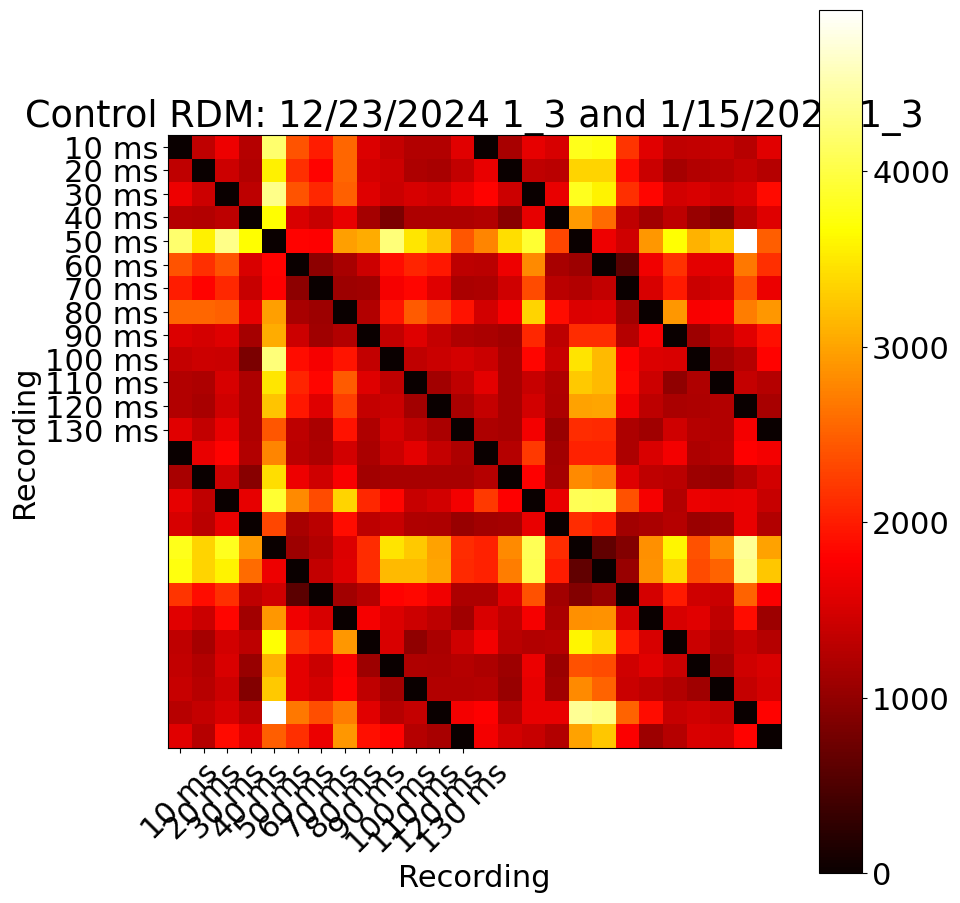

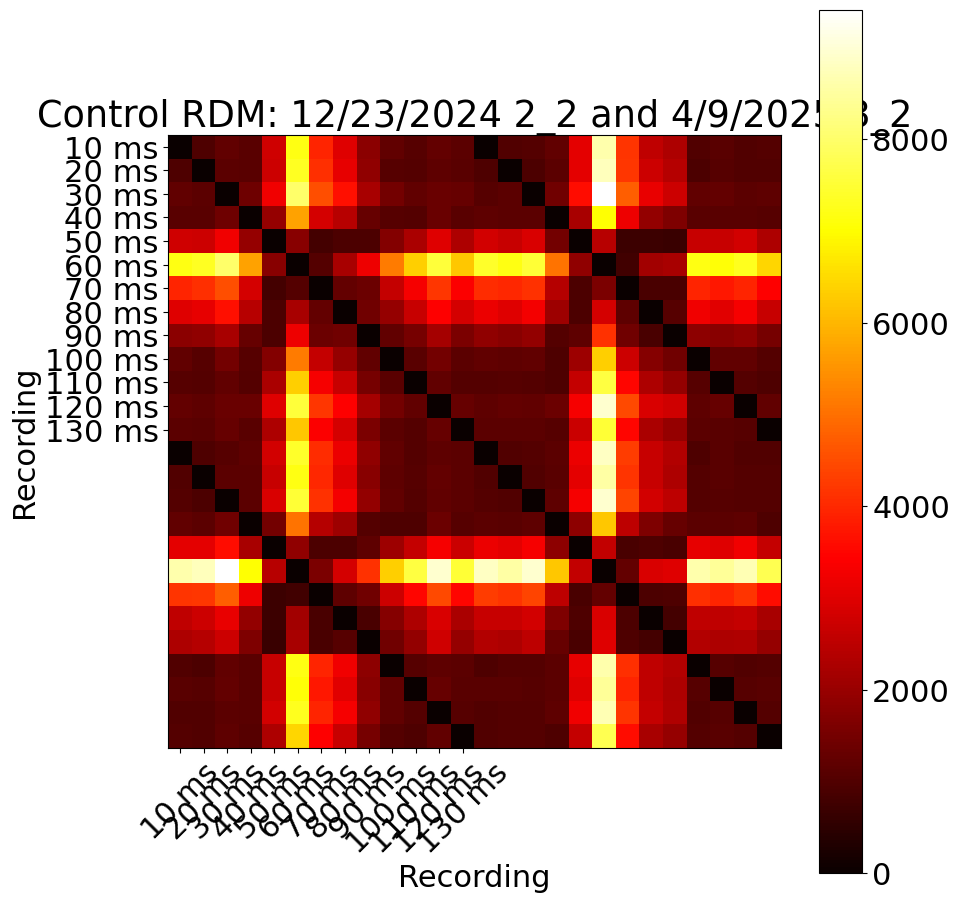

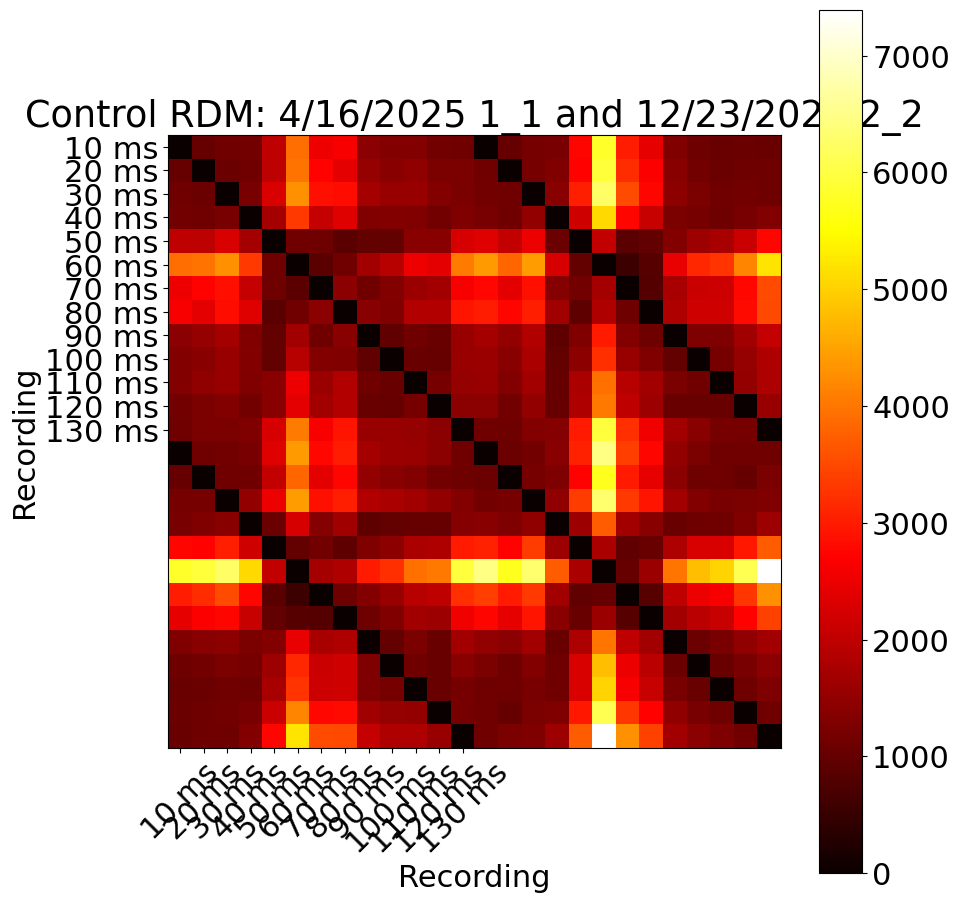

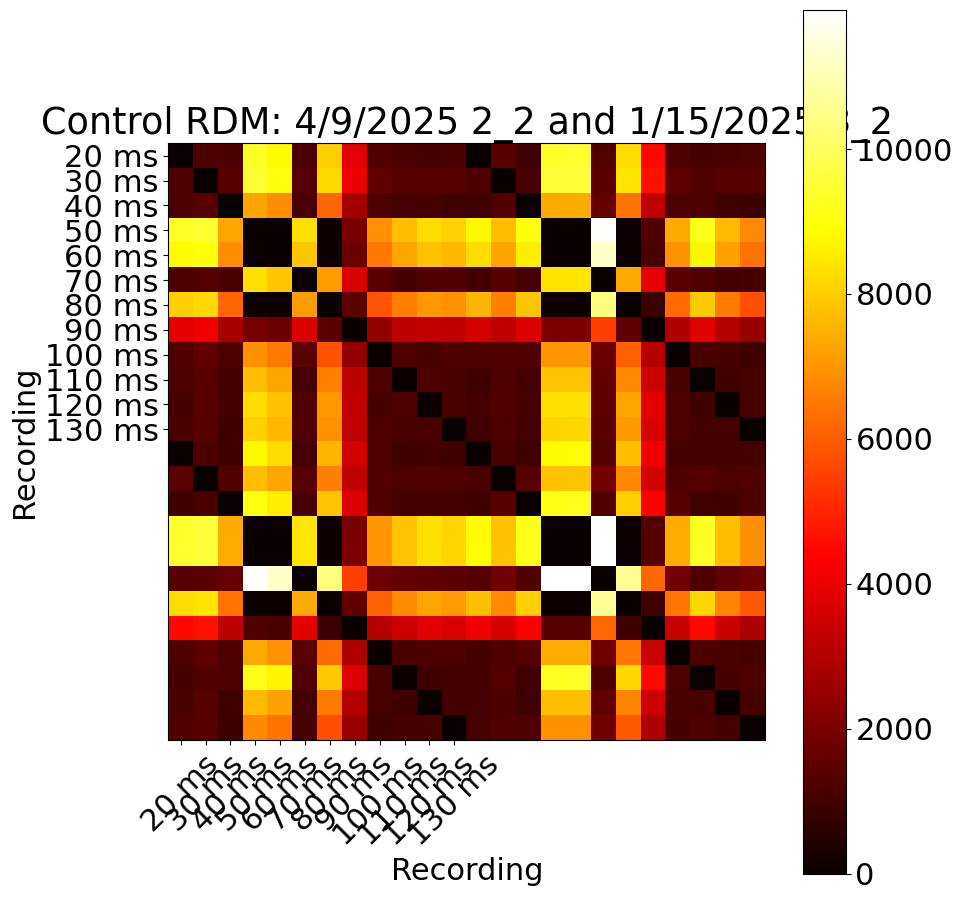

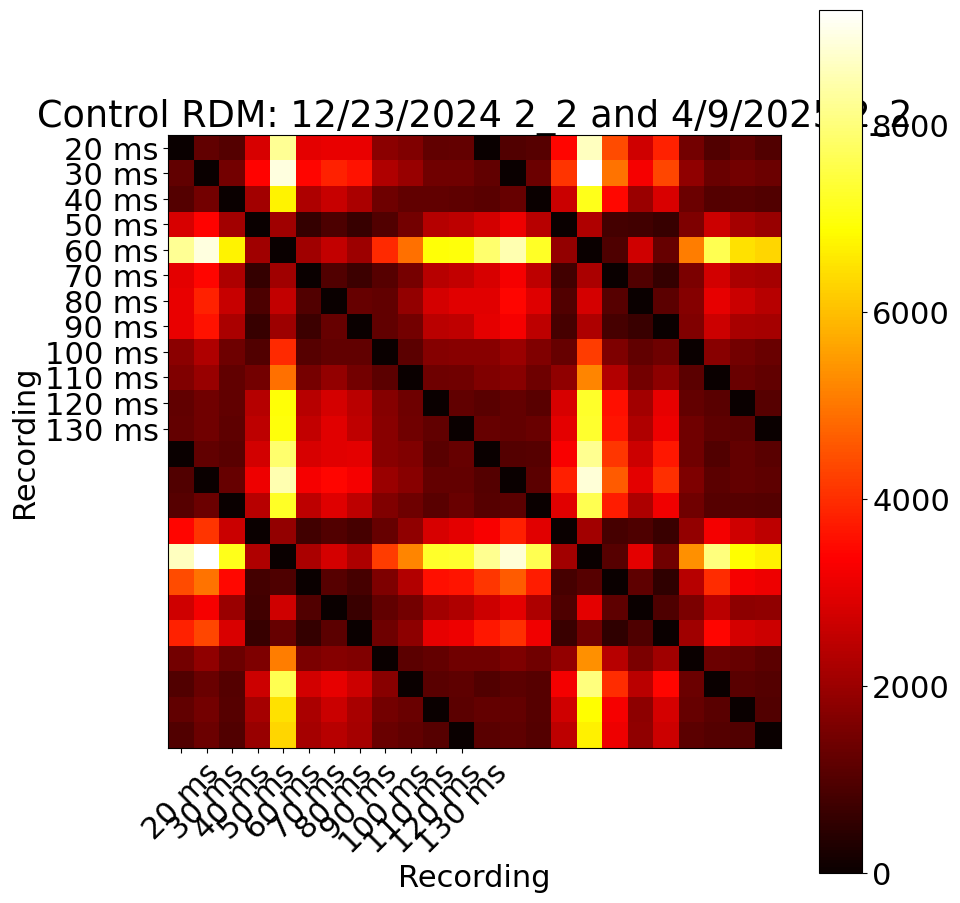

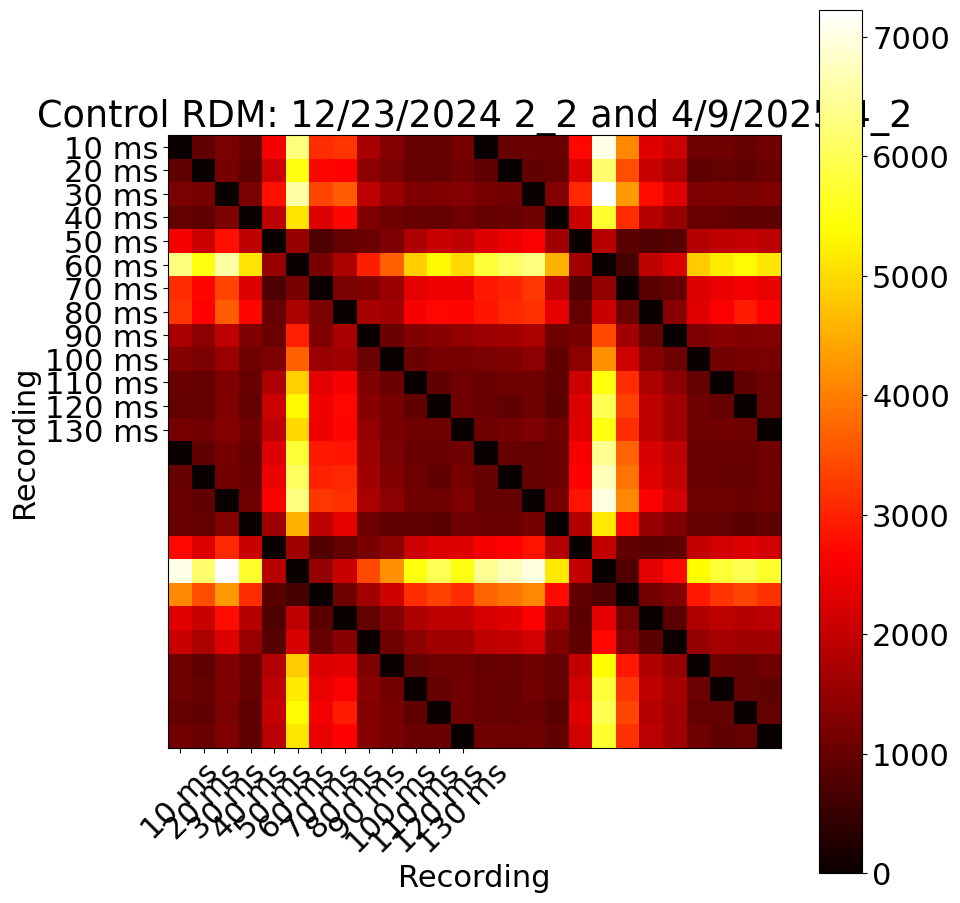

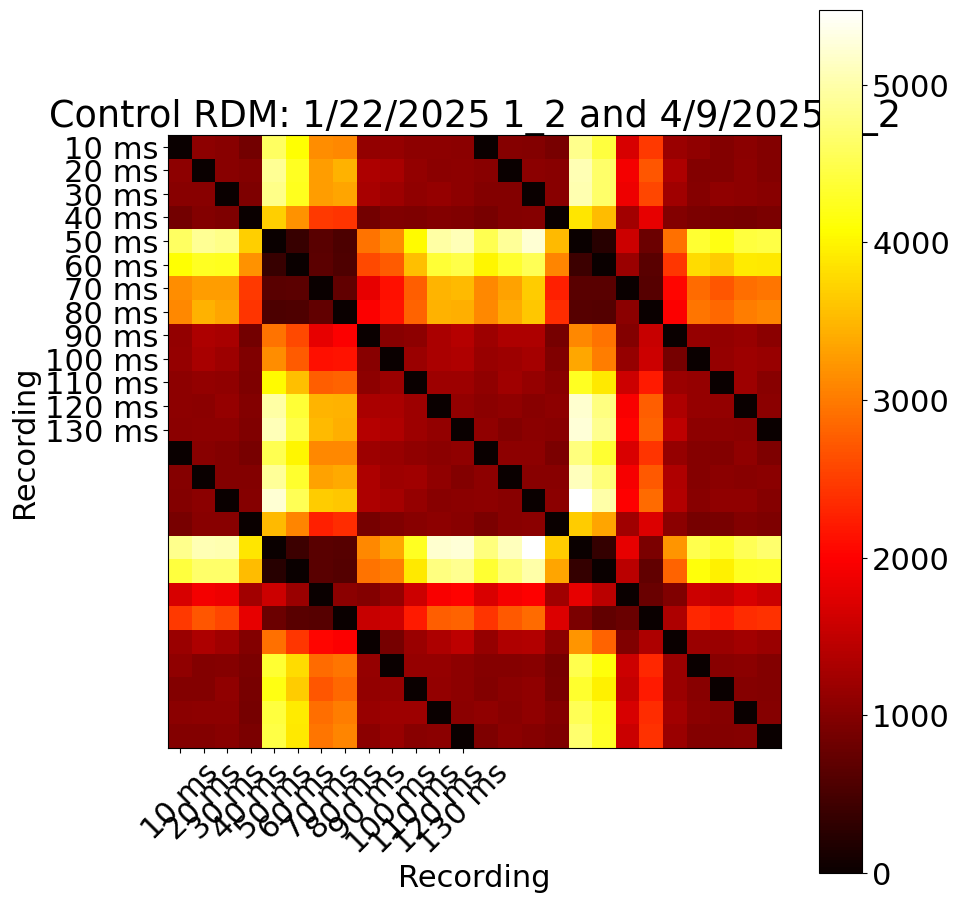

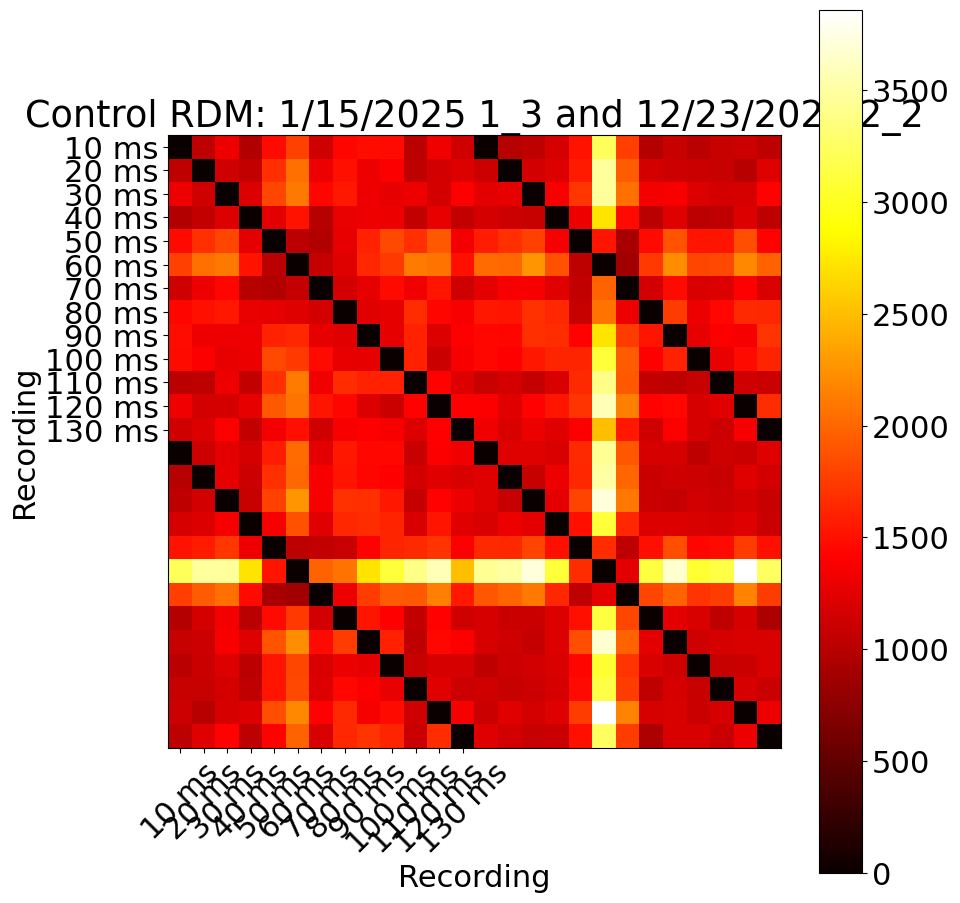

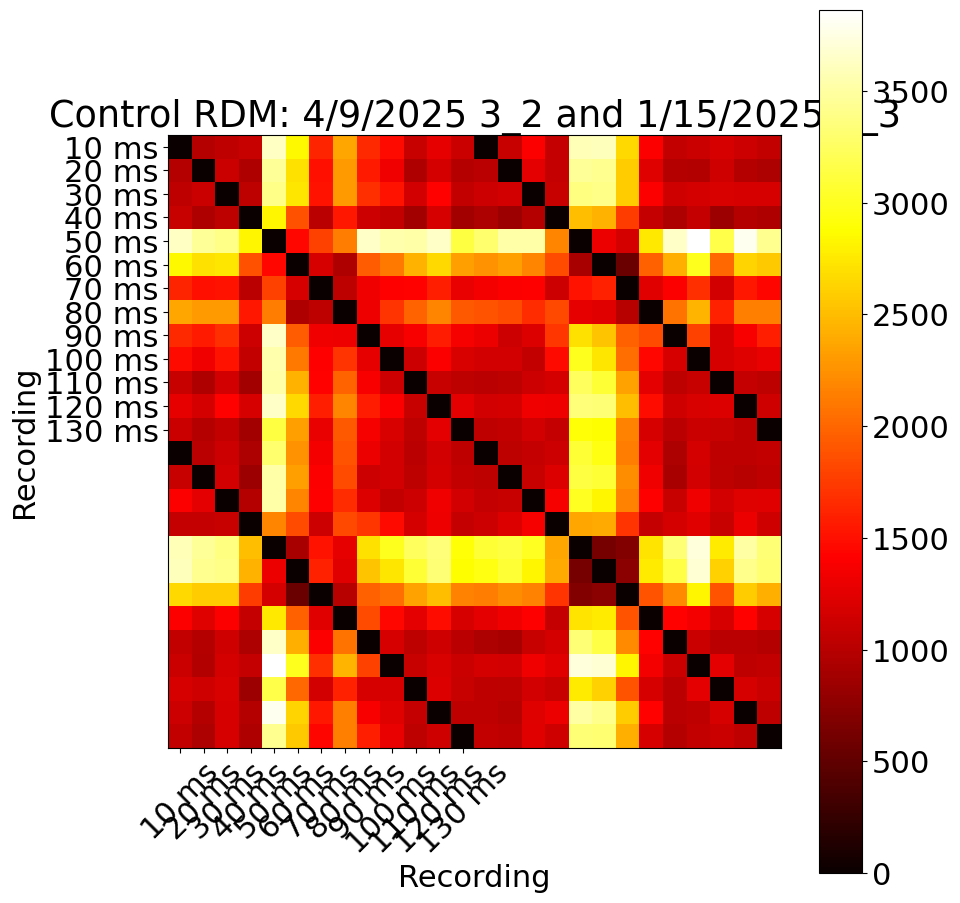

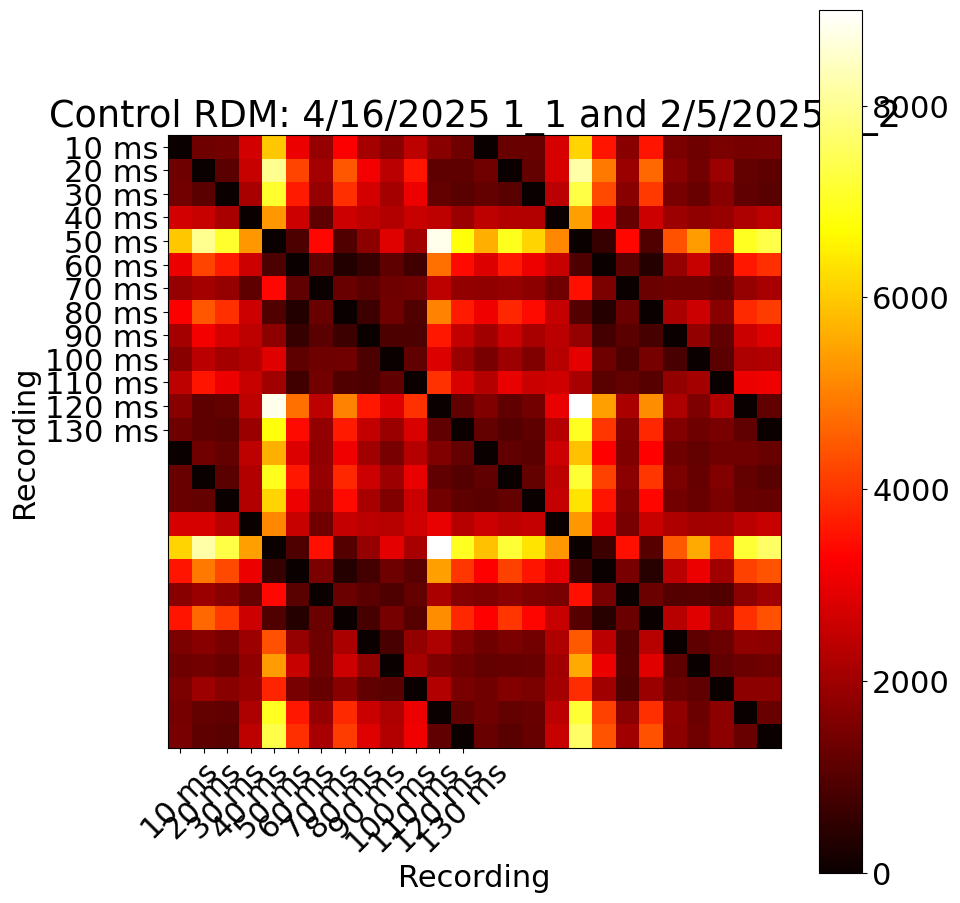

In [ ]:
# Control FCMs: use 2 barrels of same IPI and is_single_pulse_control,
# but different date, slice, and/or location.
# choose several examples and create the FCM and histogram for each.
# use the stored examples in trace_sets_dict to create the control examples.
control_rdm_distances = []
num_control_examples = 10
max_rows = 12
while num_control_examples > 0:
    # choose a random date, slice, and location from the trace_sets_dict
    date1 = random.choice(list(trace_sets_dict.keys()))
    slic_loc_id1 = random.choice(list(trace_sets_dict[date1].keys()))
    date2 = random.choice(list(trace_sets_dict.keys()))
    slic_loc_id2 = random.choice(list(trace_sets_dict[date2].keys()))

    # ensure they are not the same date, slice, and location
    while slic_loc_id1 == slic_loc_id2 and date1 == date2:
        date2 = random.choice(list(trace_sets_dict.keys()))
        slic_loc_id2 = random.choice(list(trace_sets_dict[date2].keys()))

    ipi_choices = list(trace_sets_dict[date1][slic_loc_id1].keys())
    ipi_choices = list(set(ipi_choices) & set(trace_sets_dict[date2][slic_loc_id2].keys()))
    if len(ipi_choices) == 0:
        print("No IPI choices for this date/slice/location pair")
        continue
    n_ipis = len(ipi_choices)
    fig, ax = plt.subplots(min(max_rows, n_ipis * 2), 3, figsize=(30, 10 * min(max_rows, n_ipis * 2)))
    i_ipi = -1
    control_corr_matrices = {}
    for ipi in ipi_choices:
        i_ipi += 1

        control_ppr_choices = list(trace_sets_dict[date1][slic_loc_id1][ipi].keys())
        control_ppr_choices = list(set(control_ppr_choices) &
            set(trace_sets_dict[date2][slic_loc_id2][ipi].keys()))

        for control_or_ppr_type in control_ppr_choices:

            i_plot = 2 * i_ipi + control_or_ppr_type
                
            try:
                barrels1 = trace_sets_dict[date1][slic_loc_id1][ipi][control_or_ppr_type]
                barrels2 = trace_sets_dict[date2][slic_loc_id2][ipi][control_or_ppr_type]
                traces1 = barrels1[1]
                traces2 = barrels2[1]
            except KeyError:
                print("one of the date/slice/locations does not have the IPI/control_or_ppr_type requested")
                continue

            # create the functional connectivity matrix
            fc = FunctionalConnectivityMatrix(measure_windows=m_windows)
            static_matrix = fc.compute_correlation(traces1, traces2,
                                        method='pearson', plot_rate=0.000, lag=optimal_lag)

            # store correlation matrix in the corr_matrices dict
            if ipi not in control_corr_matrices:
                control_corr_matrices[ipi] = {}
            control_corr_matrices[ipi][control_or_ppr_type] = static_matrix

            print("Static matrix shape: ", static_matrix.shape)

            # visualize the static matrix
            # make 2 subplots
            
            if i_plot < max_rows:
                ax[i_plot][0].imshow(static_matrix, cmap='hot', interpolation='nearest',
                    vmin=0, vmax=1)

                ax[i_plot][1].set_title(f"Control FC: {date1} {slic_loc_id1} Neighbor Barrel and "
                            f"{date2} {slic_loc_id2} Neighbor Barrel " + (f" for IPI {ipi} ms " if control_or_ppr_type == 0 else ""))

                
                # in the other subplot, show histogram of strengths of the connections
                ax[i_plot][1].hist(static_matrix.flatten(), bins=100, color='blue', alpha=0.5)
                ax[i_plot][1].set_xlabel('Correlation')
            
                # show random trace pairs (one from each barrel)
                baseline = 0
                for k in range(5):
                    i_rand = random.randint(0, len(traces1) - 1)
                    j_rand = random.randint(0, len(traces2) - 1)
                    ax[i_plot][2].plot(traces1[i_rand] + baseline, color='blue', alpha=0.5)
                    ax[i_plot][2].plot(traces2[j_rand] + baseline, color='red', alpha=0.5)
                    
                    # annotate the plot with the correlation value near the baseline value
                    # get the correlation value from the static_matrix
                    # the correlation value is the value at (i_rand, j_rand) in the static_matrix
                    corr = static_matrix[i_rand, j_rand]
                    ax[i_plot][2].annotate(f"Corr: {corr:.2f}", 
                                xy=(0, baseline), 
                                xytext=(0, baseline + 0.5),
                                arrowprops=dict(facecolor='black', shrink=0.05),
                                fontsize=12)
                    baseline += max(traces1[i_rand].max(), traces2[j_rand].max()) * 1.1
            
    if len(control_corr_matrices.keys()) == 0:
        print("No correlation matrices found")
        plt.close(fig)
        continue
    plt.savefig(f"{output_fig_dir}/{slic_loc_id}_"
                f"static_fc_control-xcorr_intrabarrel.png")
    #plt.show()
    plt.close(fig)

    # compute RDM for the control examples
    # The RDM is a square matrix of size n x n, where n is the number of pairs of (ipi, is_single_pulse_control).
    # The first n/2 values are the (ipi1, is_single_pulse_control1) values for which is_single_pulse_control == 0,
    # and the second n/2 values are the (ipi2, is_single_pulse_control2) values for which is_single_pulse_control == 1.
    # The RDM is a square matrix of size n x n, where n is the number of pairs of (ipi, is_single_pulse_control).
    # The first n/2 values are the (ipi1, is_single_pulse_control1) values for which is_single_pulse_control == 0,
    # and the second n/2 values are the (ipi2, is_single_pulse_control2) values for which is_single_pulse_control == 1.
    ipi_list = list(control_corr_matrices.keys())
    ipi_list.sort()
    rdm = np.zeros((len(ipi_list) * 2, len(ipi_list) * 2))

    for i_ipi in range(len(ipi_list)):
        ipi = ipi_list[i_ipi]
        for control_or_ppr_type in control_corr_matrices[ipi].keys():
            i_rdm = i_ipi + (len(ipi_list) * control_or_ppr_type)
            fc1 = control_corr_matrices[ipi][control_or_ppr_type]

            for j_ipi in range(i_ipi + 1, len(ipi_list)):
                ipi2 = ipi_list[j_ipi]
                for control_or_ppr_type2 in control_corr_matrices[ipi2].keys():
                    j_rdm = j_ipi + (len(ipi_list) * control_or_ppr_type2)
                    fc2 = control_corr_matrices[ipi2][control_or_ppr_type2]

                    # calculate the dissimilarity between the two matrices (sum of squared differences)
                    rdm[i_rdm][j_rdm] = np.sum((fc1 - fc2) ** 2)
                    rdm[j_rdm][i_rdm] = rdm[i_rdm][j_rdm]
    # show the RDM as a heatmap
    fig, ax = plt.subplots(figsize=(10, 10))
    plt.imshow(rdm, cmap='hot', interpolation='nearest', vmin=0, vmax=7000)
    plt.colorbar()
    plt.title(f"Control RDM: {date1} {slic_loc_id1} and {date2} {slic_loc_id2}")

    # label IPIs ticks where is_single_pulse_control == 0
    plt.xticks(np.arange(len(ipi_list)), 
                [f"{ipi} ms" for ipi in ipi_list], rotation=45)
    plt.yticks(np.arange(len(ipi_list)),
                [f"{ipi} ms" for ipi in ipi_list])
    plt.xlabel('Recording')
    plt.ylabel('Recording')
    plt.title(f"Control RDM: {date1} {slic_loc_id1} and {date2} {slic_loc_id2}")
    plt.tight_layout()
    formatted_date1 = date1.replace('/', '-')
    formatted_date2 = date2.replace('/', '-')
    plt.savefig(f"{output_fig_dir}/{formatted_date1}_{slic_loc_id1}_{formatted_date2}_{slic_loc_id2}_"
                f"rdm_control-xcorr_intrabarrel.png")
    #plt.show()
    control_rdm_distances.append(np.sum(rdm))
    num_control_examples -= 1

# save control_rdm_distances to a pickle file
with open(f"{output_fig_dir}/control_rdm_distances_intrabarrel.pkl", 'wb') as f:
    pickle.dump(control_rdm_distances, f)

In [12]:
# pull from pickle file
with open(f"{output_fig_dir}/control_rdm_distances_intrabarrel.pkl", 'rb') as f:
    control_rdm_distances = pickle.load(f)

t-statistic: -3.2139038391234114, p-value: 0.004166835909370033
The two groups are significantly different


C:\Users\jjudge3\AppData\Local\Temp\ipykernel_17896\404951744.py:29: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  ax.set_xticks([0, 1], ['Data', 'Control'])


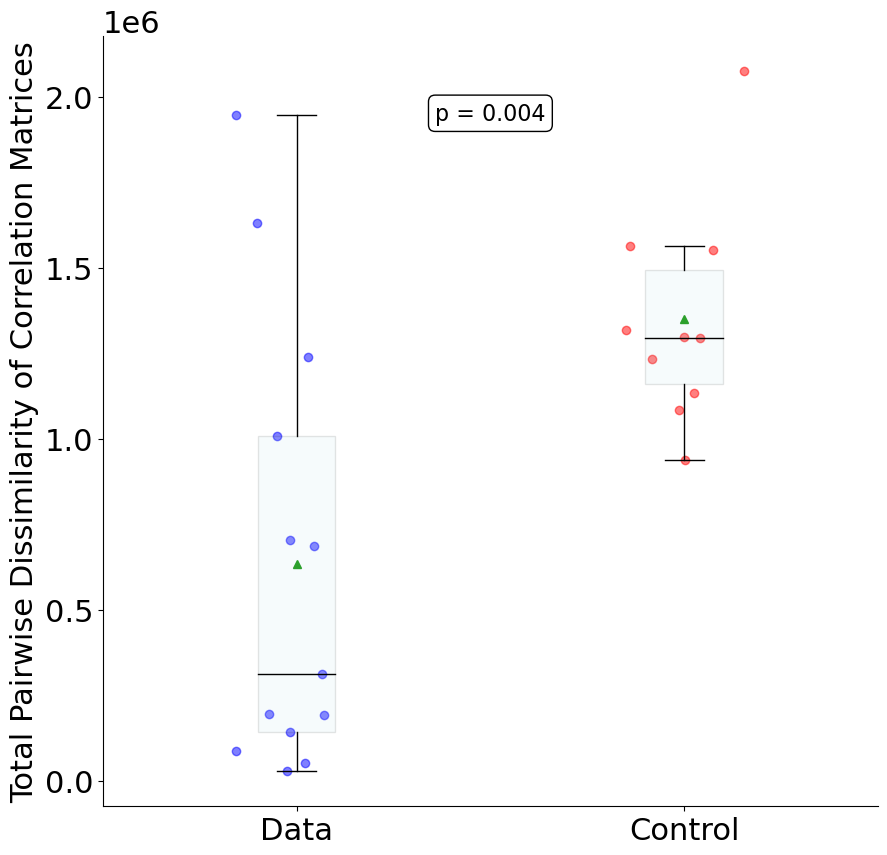

In [14]:
# scatter plot of the total_rdm_distances and control_rdm_distances
fig, ax = plt.subplots(figsize=(10, 10))


# add box and whisker plot for each group
# make boxplot transparent
ax.boxplot([total_rdm_distances[optimal_lag][1], control_rdm_distances], 
            positions=[0, 1], widths=0.2, patch_artist=True,
            boxprops=dict(facecolor='lightblue', alpha=0.1),
            showfliers=False,
            medianprops=dict(color='black'), showmeans=True)
            
x_jitter = np.random.normal(0, 0.1, len(total_rdm_distances[optimal_lag][1]))
x_jitter2 = np.random.normal(0, 0.1, len(control_rdm_distances)) + 1
ax.scatter(x_jitter, total_rdm_distances[optimal_lag][1], color='blue', alpha=0.5, label='Data')
ax.scatter(x_jitter2, control_rdm_distances, color='red', alpha=0.5, label='Control (scrambled)')

# use ttest_ind to compare the two groups
t_stat, p_val = ttest_ind(total_rdm_distances[optimal_lag][1], control_rdm_distances)
print(f"t-statistic: {t_stat}, p-value: {p_val}")
if p_val < 0.05:
    print("The two groups are significantly different")
    # mark the p-value on the plot
    ax.annotate(f"p = {p_val:.3f}", xy=(0.5, 0.9), xycoords='axes fraction',
                fontsize=16, ha='center', va='center', color='black',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))

ax.set_xlim(-0.5, 1.5)
ax.set_xticks([0, 1], ['Data', 'Control'])
ax.set_xticklabels(['Data', 'Control'])

# turn of spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_ylabel('Total Pairwise Dissimilarity of Correlation Matrices')
plt.savefig(f"{output_fig_dir}/total_rdm_distances_lag_{optimal_lag}_intrabarrel.png")
plt.show()
plt.close(fig)

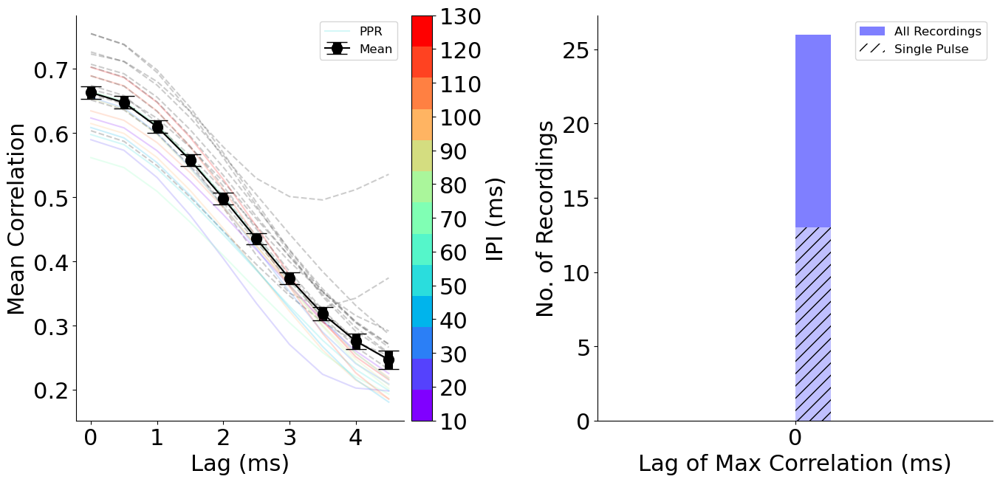

In [17]:
# use corr_matrices[ipi][control_or_ppr_type][lag] to plot mean correlation for each lag
# each (ipi, control_or_ppr_type) pair is a different color
# do not use total_rdm_distances[lag] for this plot, but rather the mean of the correlation matrices

# 2 subplots
fig, ax = plt.subplots(1, 2, figsize=(14, 7))

ipi_colors = cm.rainbow(np.linspace(0, 1, len(corr_matrices.keys())))
ipis_sorted = list(corr_matrices.keys())
ipis_sorted.sort()
ipi_color_map = {ipi: ipi_colors[i] for i, ipi in enumerate(ipis_sorted)}

lags_of_max_corr = []
lags_of_max_corr_single = []
avg_corr_trace = []
for ipi in corr_matrices.keys():
    for control_or_ppr_type in corr_matrices[ipi].keys():
        for i in range(len(corr_matrices[ipi][control_or_ppr_type][0])):
                if skip_home_barrel and i == 0:
                    continue
                
                mean_corr = [np.mean(np.abs(corr_matrices[ipi][control_or_ppr_type][lag][i]))
                                for lag in lags]

                # get the lag with the maximum correlation value
                i_max_corr = np.argmax(mean_corr)
                lags_of_max_corr.append(lags[i_max_corr])

                if control_or_ppr_type == 1:
                        lags_of_max_corr_single.append(lags[i_max_corr])

                # plot the mean correlation for each lag
                ipi_color = ipi_color_map[ipi]
                color = ipi_color if control_or_ppr_type == 0 else 'black'
                ax[0].plot(lags, mean_corr, label=
                        'Single Pulse' if control_or_ppr_type == 1 else  "PPR", color=color,
                        linestyle='--' if control_or_ppr_type == 1 else '-', alpha=0.2)
                mean_corr = np.array(mean_corr).reshape(-1, len(lags))
                for i_corr in range(mean_corr.shape[0]):
                        mean_corr_single = mean_corr[i_corr, :].reshape(1, -1)
                        avg_corr_trace.append(mean_corr_single)
        
# plot the mean correlation for each lag with error bars
avg_corr_trace = np.concatenate(avg_corr_trace, axis=0)
ax[0].errorbar(lags, np.mean(avg_corr_trace, axis=0), yerr=sem(avg_corr_trace, axis=0),
            capsize=10, elinewidth=8, marker='o', markersize=10, label=f"Mean", color='black',)

# legend only shows the first entry
handles = [h for i, h in enumerate(ax[0].get_legend_handles_labels()[0]) if i % 2 == 0]
labels = [l for i, l in enumerate(ax[0].get_legend_handles_labels()[1]) if i % 2 == 0]
ax[0].legend(handles=handles[1:2] + [handles[-1]],
            labels=labels[1:2] + [labels[-1]],
            loc='upper right', fontsize=12)

# add a color bar to the plot
# create a colormap from the ipi_color_map
cmap = cm.get_cmap('rainbow', len(ipis_sorted))
norm = plt.Normalize(0, len(ipis_sorted) - 1)
cbar = plt.colorbar(cm.ScalarMappable(cmap=cmap, norm=norm),
                ticks=range(len(ipis_sorted)),
                #ticks=ipis_sorted,
                label='IPI (ms)',
                orientation='vertical',
                pad=0.02,
                ax=ax[0])
cbar.ax.set_yticklabels(ipis_sorted)

# turn of spines
for i in range(2):
        ax[i].spines['top'].set_visible(False)
        ax[i].spines['right'].set_visible(False)

        ax[i].set_xticks([i for i in range(0, max_lag//2 * 2, 2)])
        ax[i].set_xticklabels([str(i) for i in range(0, max_lag // 2)])

ax[0].set_xlabel('Lag (ms)')
ax[1].set_xlabel('Lag of Max Correlation (ms)')


ax[0].set_xlabel('Lag (ms)')
ax[0].set_ylabel('Mean Correlation')


# right subplot is a histogram of lag_ofmax_corr
ax[1].hist(lags_of_max_corr, bins=max_lag, color='blue', alpha=0.5, label="All Recordings")

# hatched histogram for lags_of_max_corr_single
ax[1].hist(lags_of_max_corr_single, bins=max_lag, color='white', alpha=0.5,
            hatch='//', label='Single Pulse')
ax[1].legend(loc='upper right', fontsize=12)

ax[1].set_ylabel('No. of Recordings')

plt.tight_layout()
#ax.legend()
plt.savefig(f"{output_fig_dir}/mean_correlation_lags_intrabarrel.png")
plt.show()



No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
Date:  12/23/2024 Slice:  1 Location:  3
Avg corr shape:  (26, 100, 100)


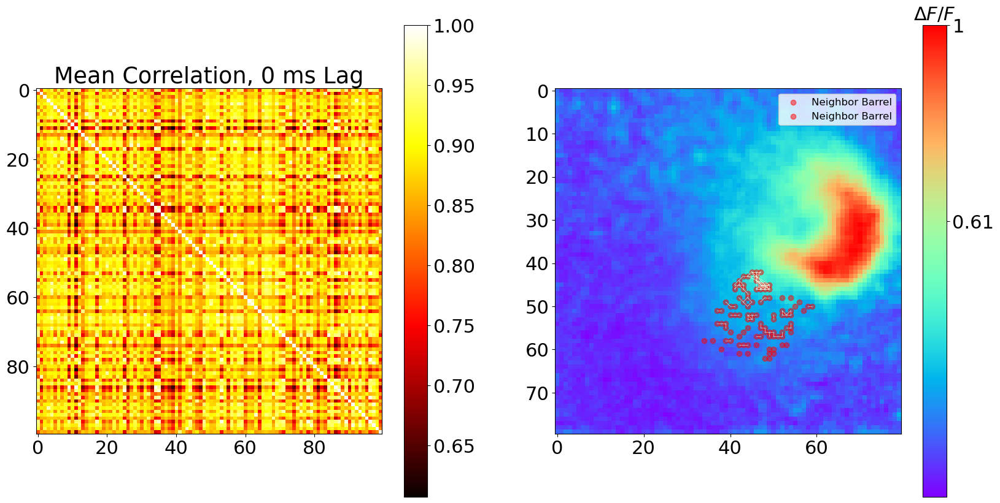

Date:  12/23/2024 Slice:  2 Location:  2
Avg corr shape:  (26, 100, 100)


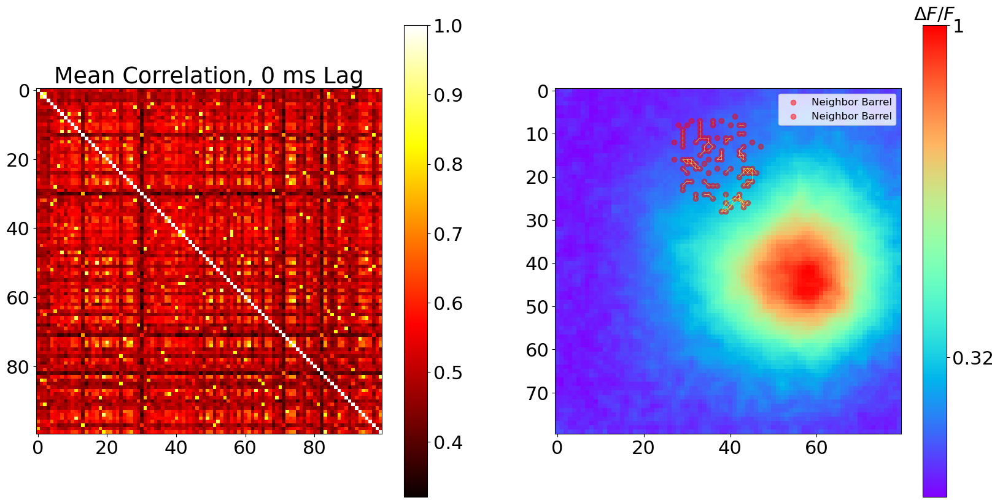

Date:  1/15/2025 Slice:  1 Location:  3
Avg corr shape:  (26, 100, 100)


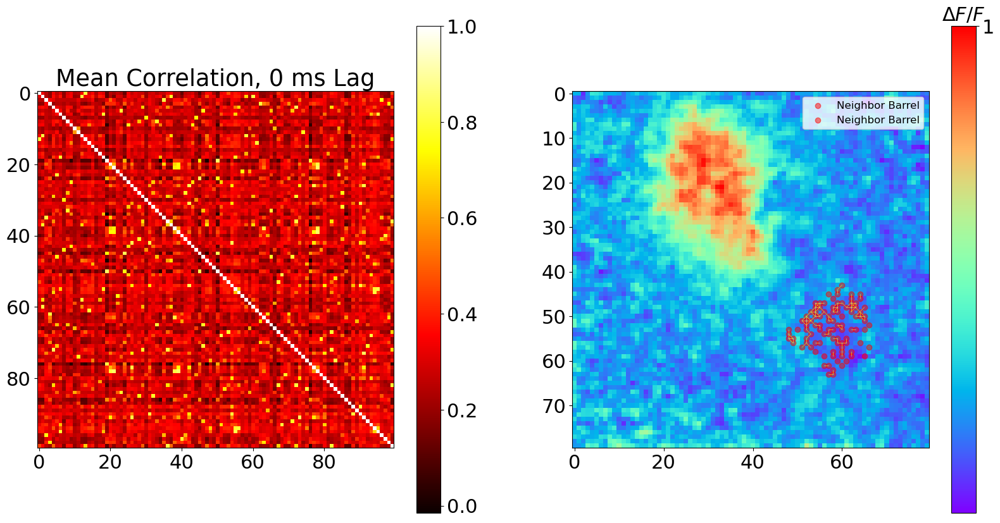

Date:  1/15/2025 Slice:  3 Location:  2
Avg corr shape:  (26, 100, 100)


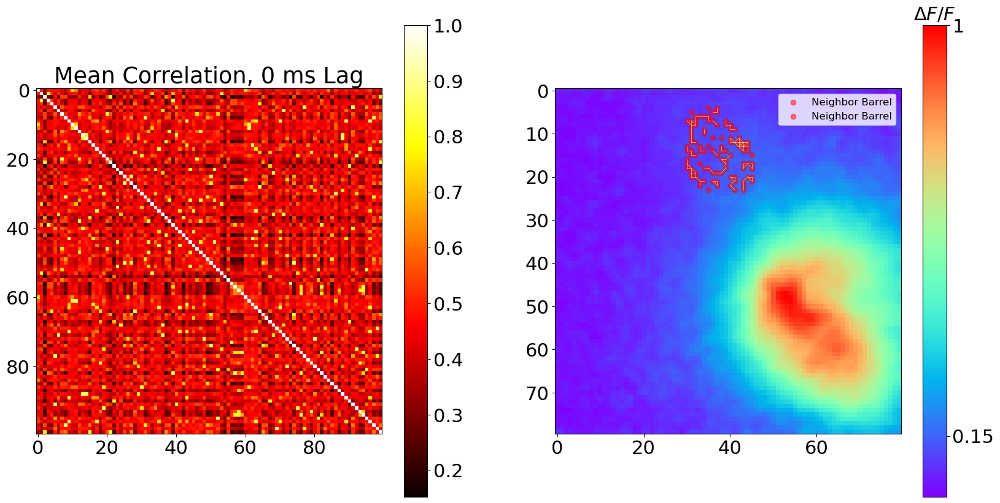

Date:  1/22/2025 Slice:  1 Location:  2
Avg corr shape:  (26, 100, 100)


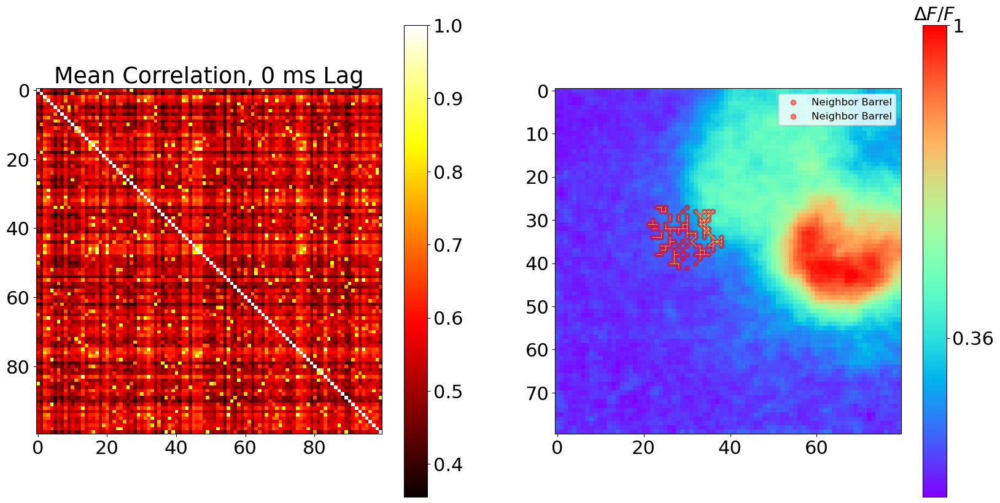

Date:  1/22/2025 Slice:  3 Location:  2
Avg corr shape:  (26, 100, 100)


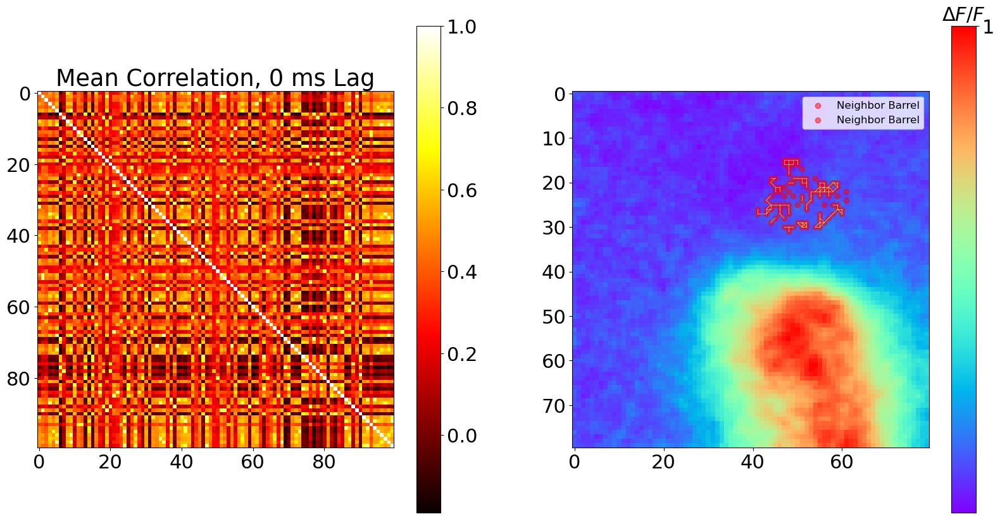

Date:  2/5/2025 Slice:  1 Location:  3
Avg corr shape:  (26, 100, 100)


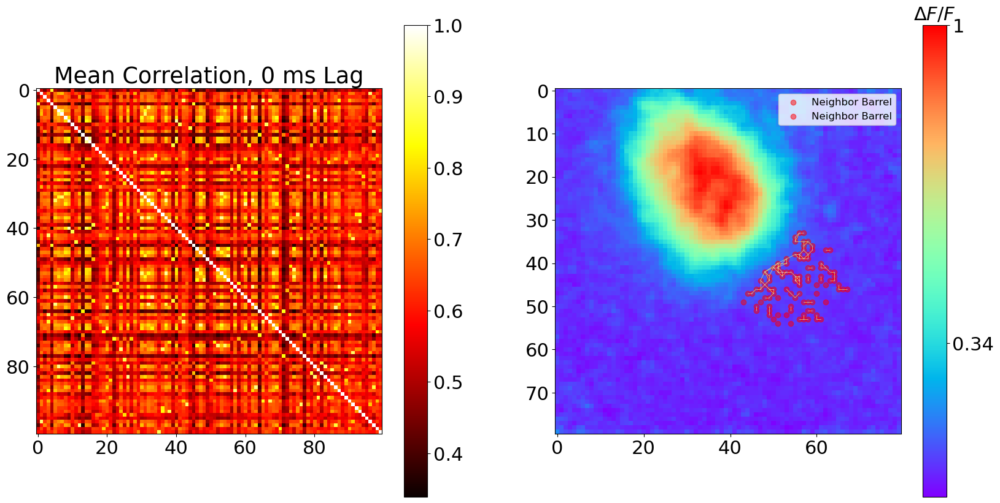

Date:  2/5/2025 Slice:  2 Location:  2
Avg corr shape:  (26, 100, 100)


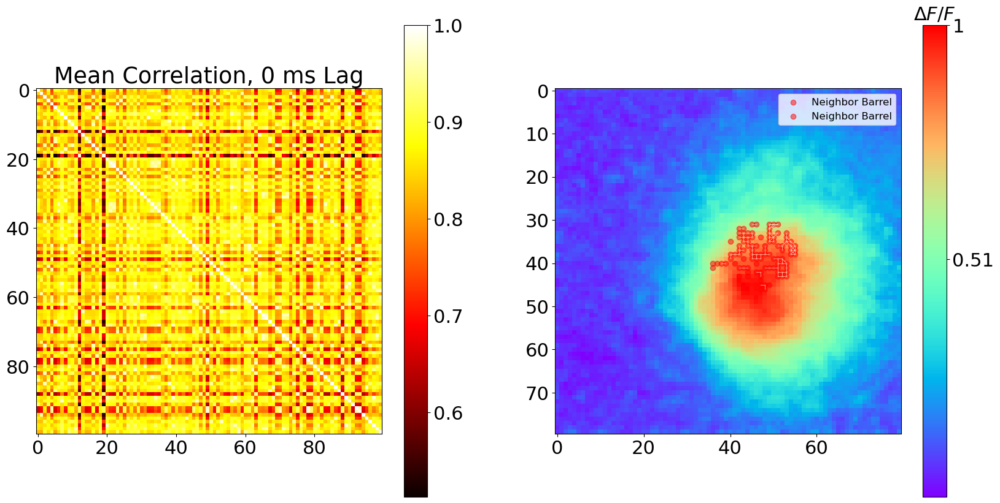

Date:  4/16/2025 Slice:  1 Location:  1
Avg corr shape:  (26, 100, 100)


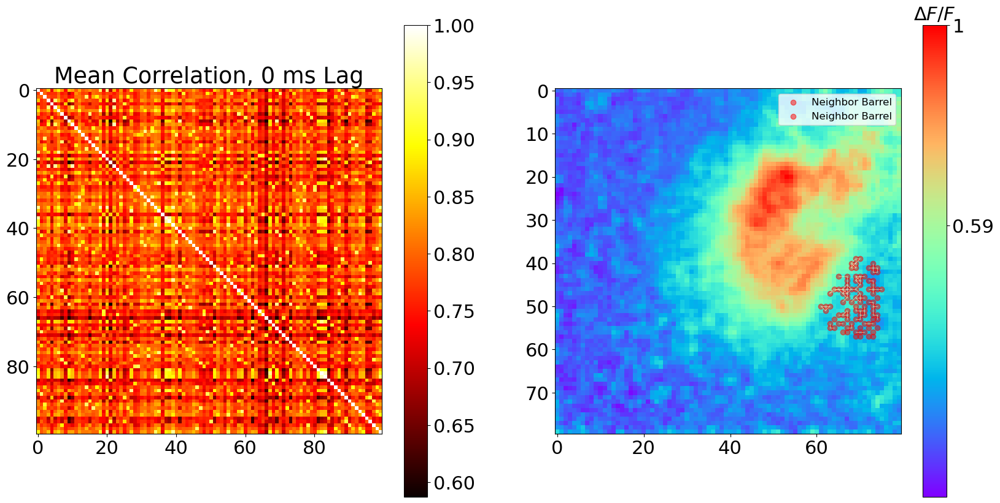

Date:  4/16/2025 Slice:  2 Location:  2
Avg corr shape:  (12, 100, 100)


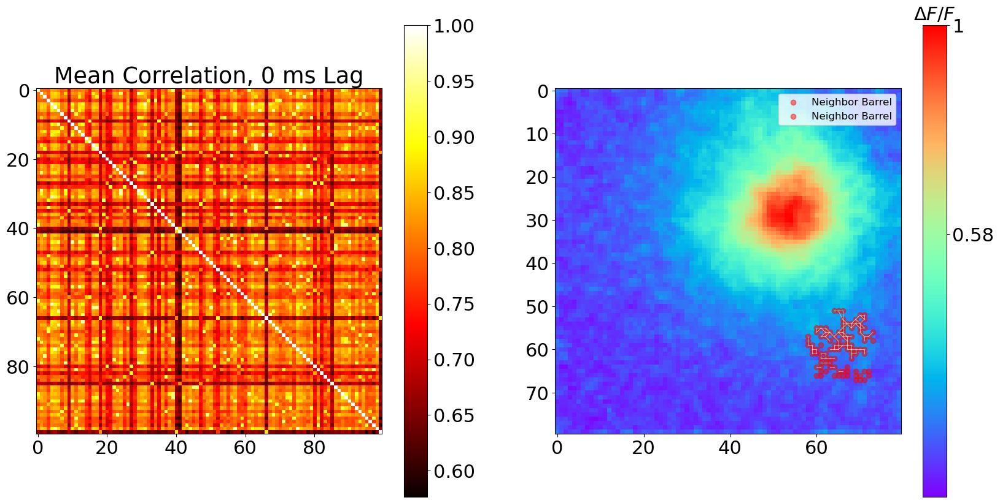

No corr_matrices_by_slice for this date/slice/location
Date:  4/9/2025 Slice:  1 Location:  2
Avg corr shape:  (16, 100, 100)


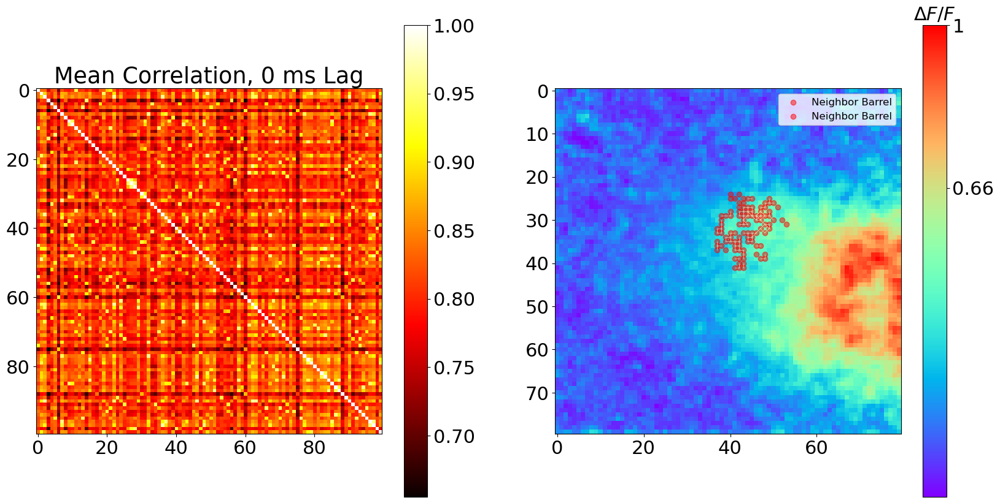

Date:  4/9/2025 Slice:  2 Location:  2
Avg corr shape:  (24, 100, 100)


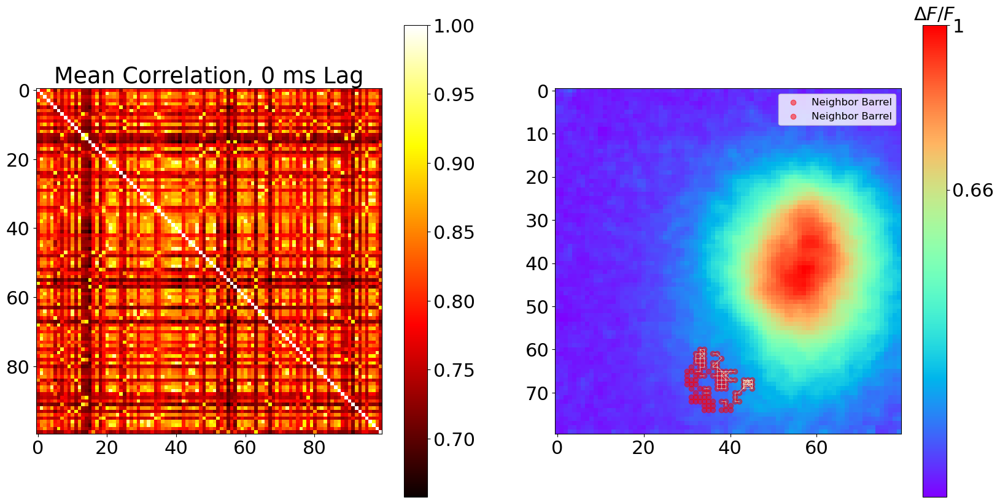

Date:  4/9/2025 Slice:  3 Location:  2
Avg corr shape:  (26, 100, 100)


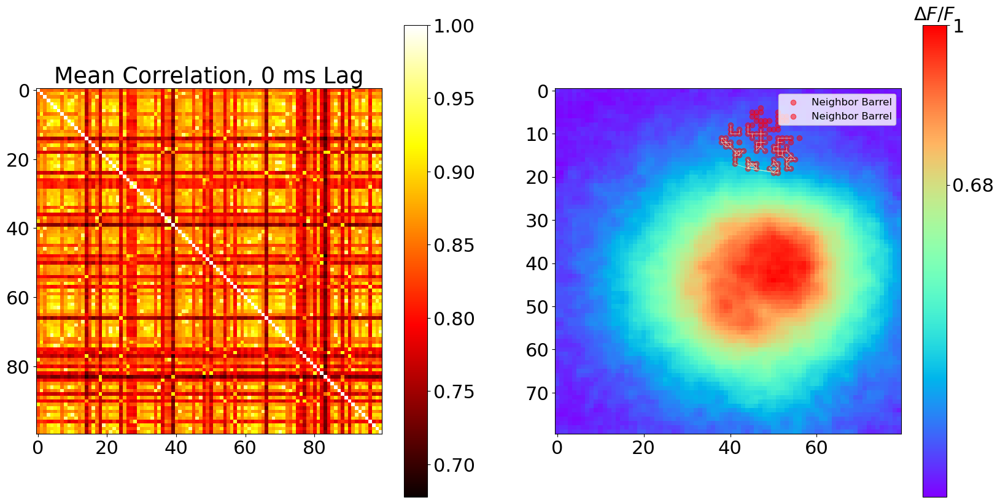

Date:  4/9/2025 Slice:  4 Location:  2
Avg corr shape:  (26, 100, 100)


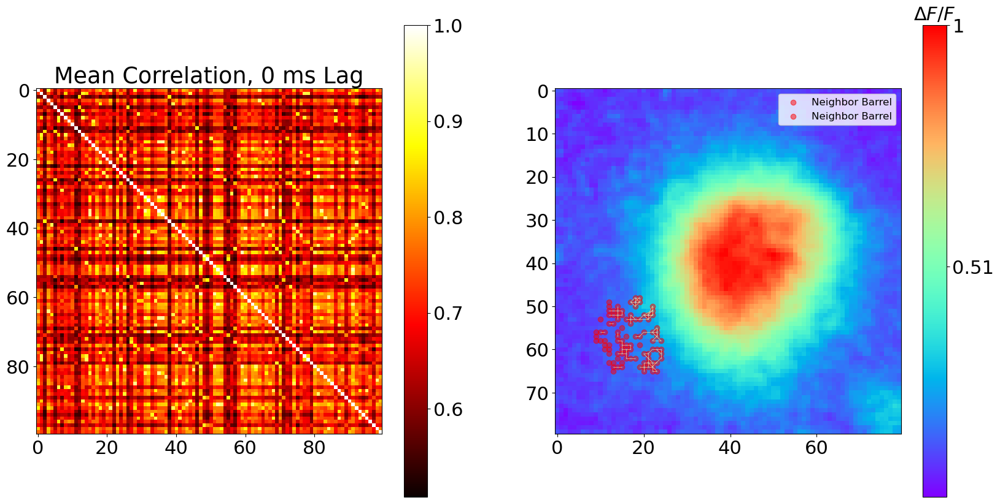

In [18]:
# Now use ROI_File and read the location of the ROIs using ROIFileReader
# Also read in the amp_array from the ppr_df and use that as the image to plot the ROIs locations on.
# The roi file is stored in a column in the ppr_df called 'ROI_File'
# The amp_array is stored in a column in the ppr_df called 'amp_array'

optimal_lag = 0  # based on the previous plot, this is the lag with the highest correlation
def read_array_file(filename): 
    data_arr = pd.read_csv(filename,
                                 sep='\t',
                                 header=None,
                                 names=['Index',  'Values'])
    return np.array(data_arr['Values']).reshape((80, 80))

distance_vs_corr = {}
node_degree_dist = {}
for date in ppr_df['Date'].unique():
    date_df = ppr_df[ppr_df['Date'] == date]
    if date not in corr_matrices_by_slice:
        print("No corr_matrices_by_slice for this date")
        continue
    for slic in date_df['Slice'].unique():
        slic_df = date_df[date_df['Slice'] == slic]
        for loc in slic_df['Location'].unique():
            loc_df = slic_df[slic_df['Location'] == loc]
            slic_loc_id = f"{slic}_{loc}"
            if slic_loc_id not in corr_matrices_by_slice[date]:
                print("No corr_matrices_by_slice for this date/slice/location")
                continue

            if date not in node_degree_dist:
                node_degree_dist[date] = {}
            if slic_loc_id not in node_degree_dist[date]:
                node_degree_dist[date][slic_loc_id] = {0: {},
                                                       1: {}} # 0 for barrel 0, 1 for barrel 1
            if date not in distance_vs_corr:
                distance_vs_corr[date] = {}
            if slic_loc_id not in distance_vs_corr[date]:
                distance_vs_corr[date][slic_loc_id] =  {'distance': [], 'corr': []}    

            print("Date: ", date, "Slice: ", slic, "Location: ", loc)

            ppr_barrel_subset = ppr_barrel_df[(ppr_barrel_df['Date'] == date) &
                    (ppr_barrel_df['Slice'] == slic) &
                    (ppr_barrel_df['Location'] == loc)]
            if len(ppr_barrel_subset) == 0:
                print("No ppr_barrel_df for this date/slice/location")
                continue
            
            # look up the amp_array in ppr_barrel_df
            amp_array = ppr_barrel_subset['amp_array'].values[0]
            amp_array = read_array_file(amp_array)

            # get roi_file for this recording
            roi_file_barrel_1 = loc_df[loc_df['ROI_Set'].str.contains('rand_1')]['ROI_File'].values[0]

            # read the roi file (barrel 1)
            rois_1 = ROIFileReader(roi_file_barrel_1).get_roi_list()
            rois_1 = [LaminarROI(r, input_diode_numbers=True)
                    for r in rois_1]
            rois_points1 = [roi.get_points() for roi in rois_1]
            
            # now get the correlation matrix for this date/slice/location
            avg_corr = []
            # corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][lag][i]
            for ipi in corr_matrices_by_slice[date][slic_loc_id].keys():
                for control_or_ppr_type in corr_matrices_by_slice[date][slic_loc_id][ipi].keys():
                    try:
                        avg_corr.append(corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][optimal_lag])
                    except IndexError:
                        print("IndexError: ", ipi, control_or_ppr_type, optimal_lag, i_slice)
                        print('len(corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][optimal_lag]): ',
                            len(corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][optimal_lag])) # 
                        continue
            avg_corr = np.array([ac[1] for ac in avg_corr])
            avg_corr = np.array(avg_corr).reshape(-1, 100, 100)
            print("Avg corr shape: ", avg_corr.shape)
            avg_corr = np.mean(avg_corr, axis=0)

            if avg_corr.shape[0] < 10:
                print("Avg corr shape is too small: ", avg_corr.shape)
                continue

            # plot the amp_array and overlay the ROIs. 2 subplots
            fig, ax = plt.subplots(1, 2, figsize=(20, 10))
            ax[1].imshow(amp_array, cmap='rainbow', interpolation='nearest')

            # colorbar for the amp_array
            cbar = plt.colorbar(ax[1].imshow(amp_array, cmap='rainbow',
                     interpolation='nearest', vmin=np.min(amp_array), 
                     vmax=np.max(amp_array)), ax=ax[1])

            cbar.set_ticks([np.min(amp_array), np.max(amp_array)])
            cbar.set_ticklabels([str(round(np.min(amp_array), 2)), 
                                str(round(np.max(amp_array), 2))])
            cbar.ax.set_title(r'$\Delta F/F$', fontsize=22)            
            
            # plot the ROIs
            for roi in rois_points1:
                ax[1].scatter(roi[0][0], roi[0][1], color='red', alpha=0.5, label='Neighbor Barrel')
            
            handles = [h for i, h in enumerate(ax[1].get_legend_handles_labels()[0]) if i % 2 == 0]
            labels = [l for i, l in enumerate(ax[1].get_legend_handles_labels()[1]) if i % 2 == 0]
            ax[1].legend(handles=[handles[0], handles[-1]], labels=[labels[0], labels[-1]],
                         loc='upper right', fontsize=12)

            # percentile threshold the avg_corr matrix to remove low values
            percentile_threshold = 0.97
            threshold = np.percentile(avg_corr, percentile_threshold * 100)

            for i_1, roi_1 in enumerate(rois_points1):
                for i_2 in range(i_1 + 1, len(rois_points1)):
                    roi_2 = rois_points1[i_2]
                    # draw a line between the two ROIs, 
                    # with the color of the correlation value
                    corr = avg_corr[i_1, i_2]
                    x0, y0 = roi_1[0][0], roi_1[0][1]
                    x1, y1 = roi_2[0][0], roi_2[0][1]

                    # track these nodes' degrees (weighted by correlation value)
                    key_roi1 = f"{x0}_{y0}"
                    # sum that node's row in the avg_corr matrix
                    node_degree_dist[date][slic_loc_id][1][key_roi1] = np.mean(list(avg_corr[i_1, 0:i_1]) + list(avg_corr[i_1, i_1 + 1:]))

                    # track the distribution of edge distances and correlation values
                    distance_vs_corr[date][slic_loc_id]['distance'].append(np.sqrt((x0 - x1) ** 2 + (y0 - y1) ** 2))
                    distance_vs_corr[date][slic_loc_id]['corr'].append(corr)

                    if corr < threshold:
                        continue
                    
                    color = plt.cm.hot(corr)
                    # plot the line between the two ROIs with outline on line
                    ax[1].plot([x0, x1], [y0, y1], color=color, linewidth=0.4)

            # plot the avg corr matrix on the left
            ax[0].imshow(avg_corr, cmap='hot', interpolation='nearest',
                    vmin=np.min(avg_corr), vmax=1)
            ax[0].set_title(f"Mean Correlation, {optimal_lag} ms Lag")

            plt.colorbar(ax[0].imshow(avg_corr, cmap='hot', interpolation='nearest',
                    vmin=np.min(avg_corr), vmax=1), ax=ax[0])
            # label colorbar with correlation values
            cbar.set_ticks([np.min(avg_corr), 1])
            cbar.set_ticklabels([str(round(np.min(avg_corr), 2)), 
                                str(1)])
            formatted_date = date.replace('/', '-')
            plt.savefig(f"{output_fig_dir}/{formatted_date}_{slic_loc_id}_"
                        f"static_fc_percentile_{str(int(percentile_threshold * 100))}-corr-rois_intrabarrel.png")
            plt.show()



In [19]:
corr_matrices_by_slice.keys()

dict_keys(['12/23/2024', '1/15/2025', '1/22/2025', '2/5/2025', '4/16/2025', '4/9/2025'])

In [20]:
node_degree_dist

{'12/23/2024': {'1_3': {0: {},
   1: {'52_48': 0.8754296647949662,
    '39_58': 0.8502512276569135,
    '57_51': 0.8721606614739582,
    '47_54': 0.8833589613930302,
    '43_49': 0.9000537743599932,
    '43_56': 0.8648207386376245,
    '54_51': 0.8879960111725191,
    '38_54': 0.8741316273669452,
    '46_52': 0.8937783436493127,
    '45_42': 0.8243023288546703,
    '38_51': 0.883764560293383,
    '47_42': 0.7909108396926555,
    '43_46': 0.8899917756654784,
    '50_61': 0.8195088886205447,
    '37_54': 0.8675739330934189,
    '44_52': 0.8950851325774596,
    '41_52': 0.8876070875305975,
    '46_44': 0.8433813555826919,
    '39_49': 0.8926791935190362,
    '42_57': 0.8594497305027544,
    '50_56': 0.8782906607154872,
    '39_55': 0.8689792106509387,
    '55_50': 0.8838010497209899,
    '40_56': 0.8736126039009097,
    '50_53': 0.8955467910980546,
    '49_45': 0.8302177028294123,
    '44_61': 0.8288023822838819,
    '42_52': 0.8914490822352441,
    '56_49': 0.8685352676529637,
    '40_52

Date: 12/23/2024, Slice/Location: 1_3
[0.8754296647949662, 0.8502512276569135, 0.8721606614739582, 0.8833589613930302, 0.9000537743599932, 0.8648207386376245, 0.8879960111725191, 0.8741316273669452, 0.8937783436493127, 0.8243023288546703, 0.883764560293383, 0.7909108396926555, 0.8899917756654784, 0.8195088886205447, 0.8675739330934189, 0.8950851325774596, 0.8876070875305975, 0.8433813555826919, 0.8926791935190362, 0.8594497305027544, 0.8782906607154872, 0.8689792106509387, 0.8838010497209899, 0.8736126039009097, 0.8955467910980546, 0.8302177028294123, 0.8288023822838819, 0.8914490822352441, 0.8685352676529637, 0.8847385814283876, 0.8483220912640873, 0.8851959565035735, 0.8704192409912949, 0.8396331392125862, 0.8251440928647612, 0.8407194376527821, 0.839630113455902, 0.8704687896094366, 0.8419642084613757, 0.8078937098713421, 0.8838833886318589, 0.8182016871951241, 0.8875767299896054, 0.8717666586111097, 0.8833900499184154, 0.872997422431555, 0.8398986256422886, 0.8231320356696105, 0.88

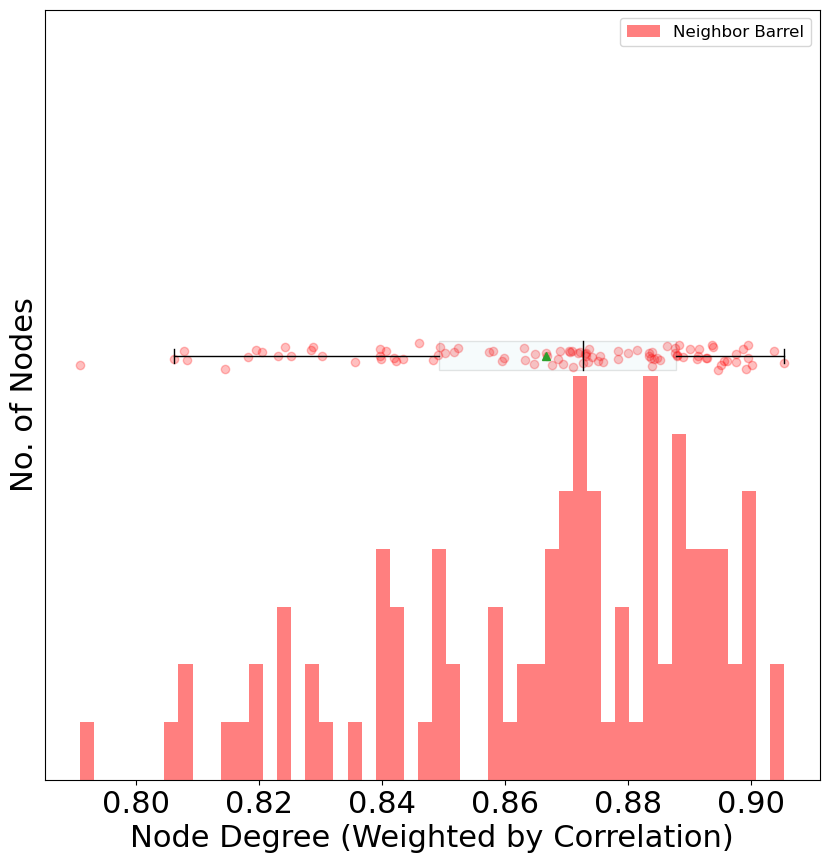

Date: 12/23/2024, Slice/Location: 2_2
[0.5091905934223047, 0.49742513006613026, 0.5074904781716756, 0.47541248821934995, 0.5346789740840073, 0.533365625991018, 0.5036963470109475, 0.5326506680330751, 0.511196433421614, 0.53211908960484, 0.5628779519573925, 0.5558924628060348, 0.5340557399604838, 0.46036708259032555, 0.5415506617100223, 0.5222641031439552, 0.550523539363926, 0.5561216798561274, 0.5235443611570942, 0.5497646513318154, 0.567749519524444, 0.5511741417566103, 0.5282099119331954, 0.5543285429994307, 0.475861255027536, 0.532476604711107, 0.5686500350564959, 0.5728698566237831, 0.5304832751111419, 0.49104096638760814, 0.41684647512762113, 0.5159424544819033, 0.5144455316964446, 0.5384996064931038, 0.5213216266596831, 0.5067559324037779, 0.5287731083440209, 0.5486895428569767, 0.5395311735940399, 0.5480856972876242, 0.5526645849946726, 0.5235175194044743, 0.5541378902833086, 0.5192179588989564, 0.5380742015584442, 0.5159220678044534, 0.507670145180457, 0.5312157154808573, 0.475

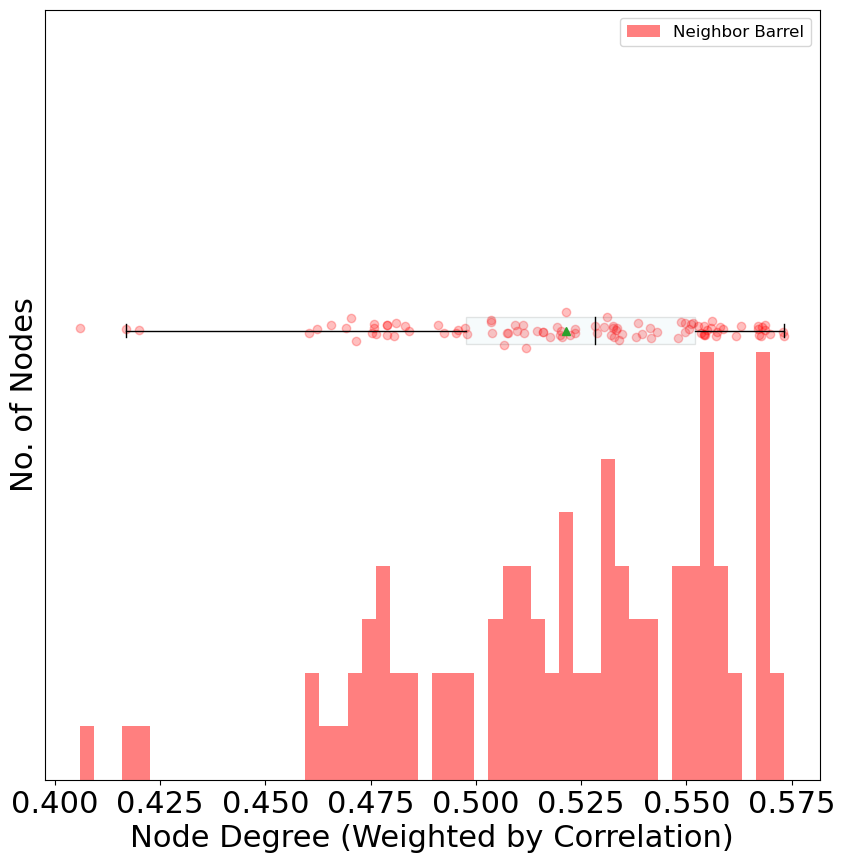

Date: 1/15/2025, Slice/Location: 1_3
[0.2796130192776784, 0.3089714863763997, 0.31245910775055624, 0.3082423619418653, 0.31441969291063454, 0.30712588485798087, 0.31777003481798943, 0.2425066960612102, 0.3157939238225802, 0.3064008664197262, 0.24610050935756947, 0.28397999483966263, 0.30447719268271145, 0.2812091450893174, 0.3071919590115095, 0.3410234592255919, 0.24640957411408743, 0.28835291573153876, 0.3073952398175599, 0.252207369369903, 0.3435789220619499, 0.29935988186683504, 0.3057166306946299, 0.29185446869608106, 0.2850072167700262, 0.3290200202256679, 0.3542647458366536, 0.294095701592283, 0.31049463825862594, 0.3210709957415025, 0.2550479625212433, 0.3495602237777652, 0.32184001689547914, 0.2999892039203478, 0.27280533203117935, 0.31346987968902507, 0.3165574367945472, 0.31486625523942835, 0.3219729389228837, 0.32755889423664, 0.2822291470566586, 0.31684580403629253, 0.3560291099470283, 0.29954142732403144, 0.2563589450201627, 0.27814913686373666, 0.30258841531515335, 0.2929

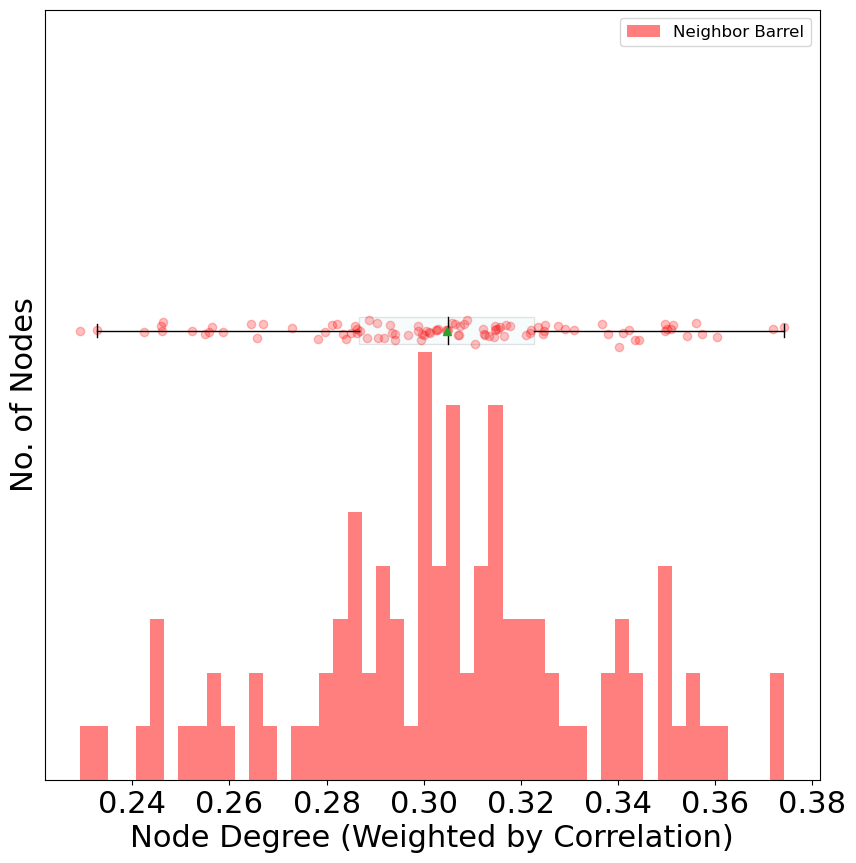

Date: 1/15/2025, Slice/Location: 3_2
[0.4604494540489346, 0.4367379399819908, 0.3827608461883591, 0.42084627791114076, 0.4239574413314518, 0.4695553366438407, 0.43153241137017523, 0.4639940896389203, 0.4359077122489728, 0.48143544565512214, 0.4508849556173939, 0.4480827551120558, 0.4509312292074302, 0.46448717304294396, 0.45229314287871497, 0.4224013541579564, 0.4610815628073679, 0.47447878328485893, 0.4207086615556973, 0.46378377332343584, 0.444831312757043, 0.4013053615806044, 0.38591870709028936, 0.4461882244975738, 0.4276027797487335, 0.43436157156124555, 0.4652015895001469, 0.43481148664441344, 0.4424503386211834, 0.4598927712906382, 0.47409094679655983, 0.4159040108165115, 0.4417795609511808, 0.4400740246977564, 0.4491297978201017, 0.4766787042225401, 0.4271976688125656, 0.39743183545192606, 0.43874606803622646, 0.4125083264184001, 0.4709648896410603, 0.47057514441099046, 0.38727090926925767, 0.48337225978408643, 0.4428201365563191, 0.4663571590231412, 0.4263956636298243, 0.45401

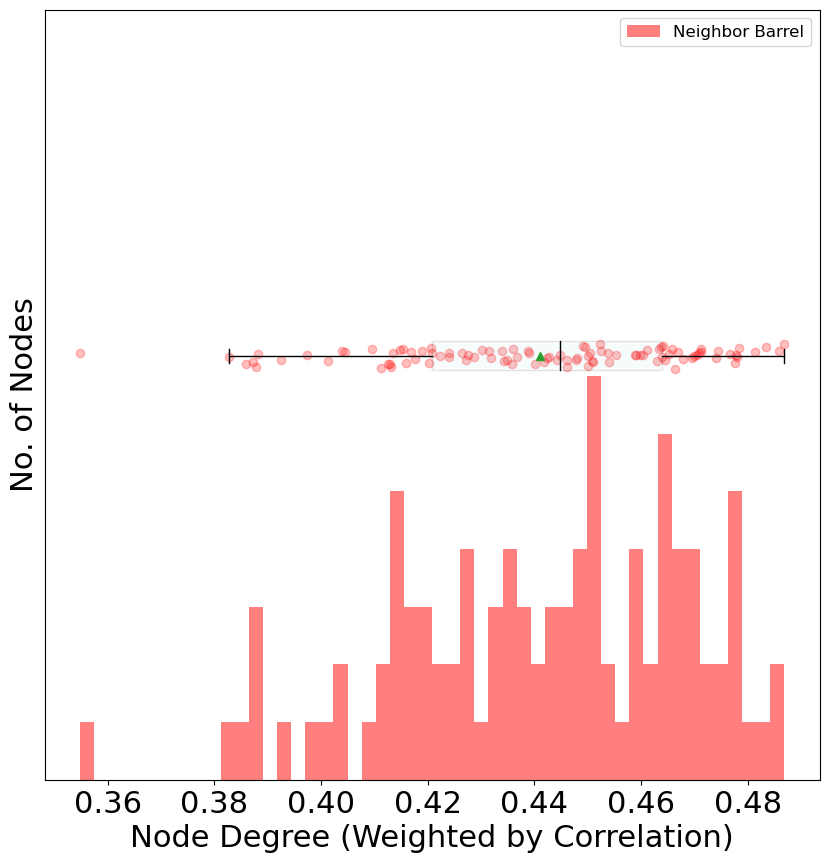

Date: 1/22/2025, Slice/Location: 1_2
[0.5427701690199872, 0.46376351266960475, 0.6277102777599579, 0.5949624125481195, 0.555197501839186, 0.49084260553680087, 0.5481316889883644, 0.49454453348745336, 0.5861769817658393, 0.508083116786737, 0.5296573022577307, 0.5307552076065281, 0.5364012622309021, 0.6154280274668004, 0.5338828637981315, 0.5763121684423166, 0.5673233587920216, 0.6029586859691366, 0.4886235453838791, 0.5645865026389492, 0.6304589404770475, 0.5316415014090045, 0.5346877267935335, 0.5778902359240529, 0.5804921176745061, 0.5546077257897012, 0.5030481163130205, 0.5442000619178179, 0.5014599379588531, 0.5965768898390647, 0.5444405997439112, 0.5962615666369885, 0.6375158950058041, 0.588553081495142, 0.5036232374289115, 0.5647941687627785, 0.496886882566468, 0.5490404361745949, 0.5726867643316906, 0.5640125363613108, 0.5359442417659369, 0.5064868055897617, 0.6138433228094482, 0.614148309976032, 0.5199948300277328, 0.6217084307920452, 0.6010905635752815, 0.6187206915418918, 0.54

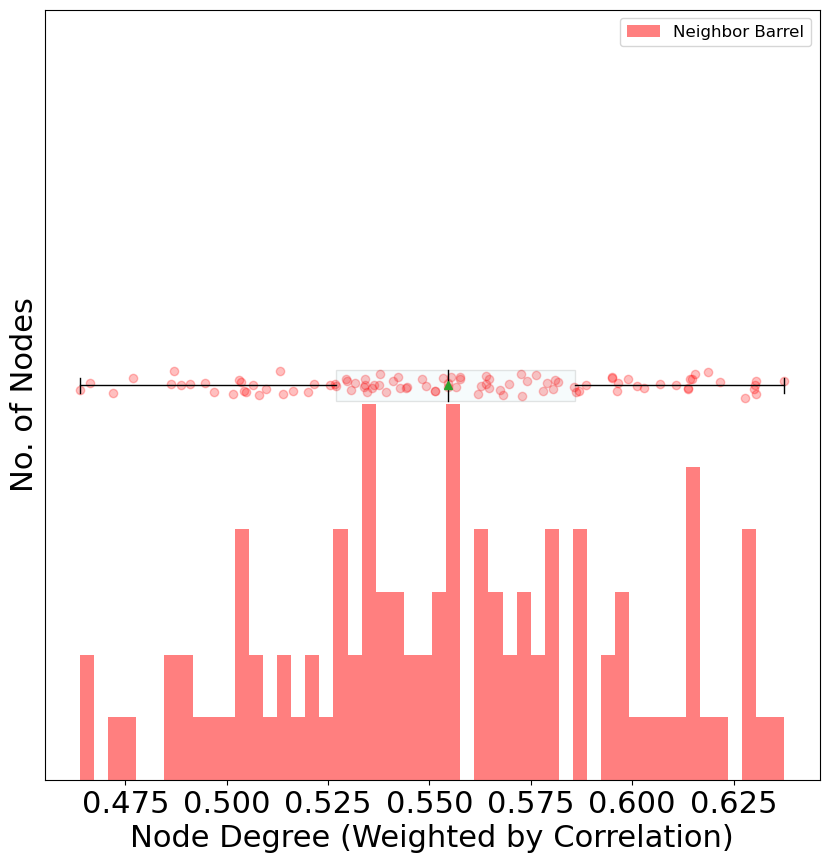

Date: 1/22/2025, Slice/Location: 3_2
[0.34198456696965196, 0.38407271330141735, 0.3543521920741051, 0.3462322169531106, 0.3140596540954273, 0.3583922012526569, 0.15995897347808655, 0.1864270804285488, 0.36747631344324283, 0.36439954656579454, 0.31469709100569354, 0.33296272929582826, 0.3099176880628736, 0.20010881784706464, 0.31385617988089065, 0.19215559661062356, 0.3774787877884241, 0.33567869216672336, 0.21810533857944306, 0.3892646691467927, 0.24816070409838722, 0.3241598558326242, 0.3433146353151083, 0.34151984573127625, 0.3427105007449371, 0.2524246877994126, 0.36060359010291565, 0.34565028043625096, 0.3524761888975017, 0.23996435133115251, 0.35407870707983097, 0.16796413654440903, 0.33664784693802885, 0.3424626568205301, 0.3531458254247576, 0.36544430310096343, 0.344622985336361, 0.3524034328864981, 0.19743143694912516, 0.2955753563056129, 0.3543495223404805, 0.34644732025906727, 0.37564465329244834, 0.2856878702288403, 0.3381700414400642, 0.33945434147993414, 0.2309389261977176

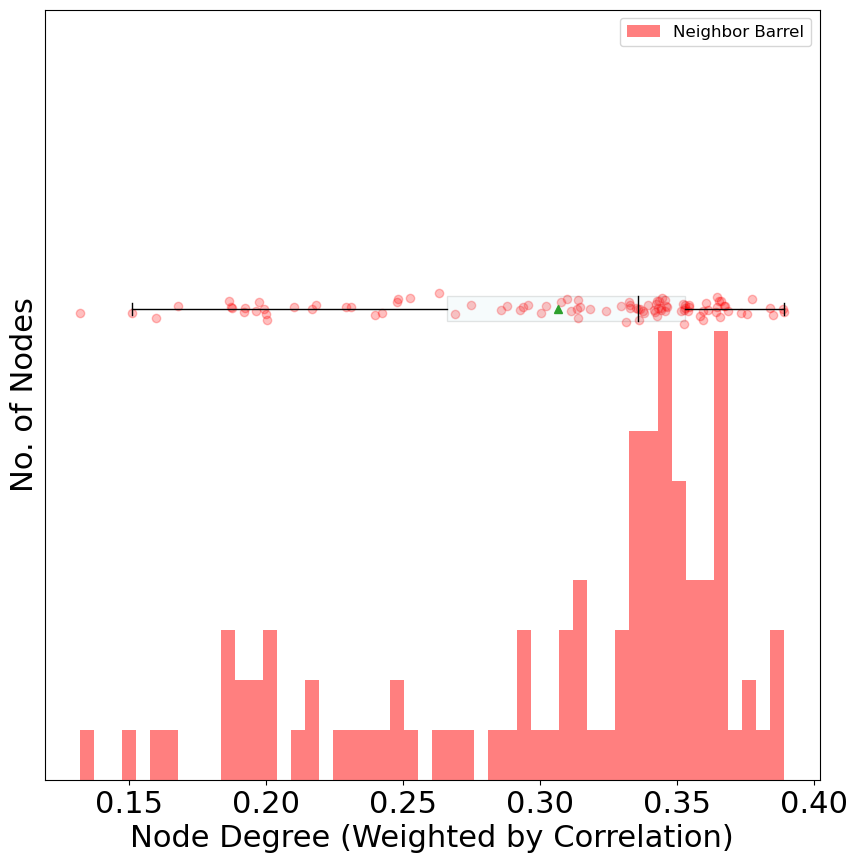

Date: 2/5/2025, Slice/Location: 1_3
[0.49195089470882836, 0.6307391191253617, 0.5944193646496676, 0.6473354304473307, 0.5090554936482257, 0.6650101473867381, 0.6484997312758918, 0.6333860194838488, 0.6423082489456697, 0.6041462834960402, 0.5826759749423804, 0.5757443030725703, 0.6050624944733244, 0.4737827267356188, 0.6170636162804404, 0.6034815899641114, 0.5471474470454282, 0.5559873814204456, 0.6107054676076596, 0.6241707446439121, 0.652488519132207, 0.5931789150923753, 0.500006098280813, 0.5866314679946595, 0.6561701715887635, 0.5796938888862105, 0.6501187561838847, 0.5416666379021832, 0.6312633584095797, 0.5657736298822742, 0.6483861885043811, 0.62462183237061, 0.6659042134111041, 0.6507287584487863, 0.6272721701525724, 0.5782315490091604, 0.625552147741985, 0.6545877357719408, 0.6233710585172991, 0.5297972397076754, 0.6150322348463844, 0.584630702727071, 0.6449222530388696, 0.6249137936243424, 0.5462086340350362, 0.4983963345513819, 0.5957780426175283, 0.6579302729415522, 0.608551

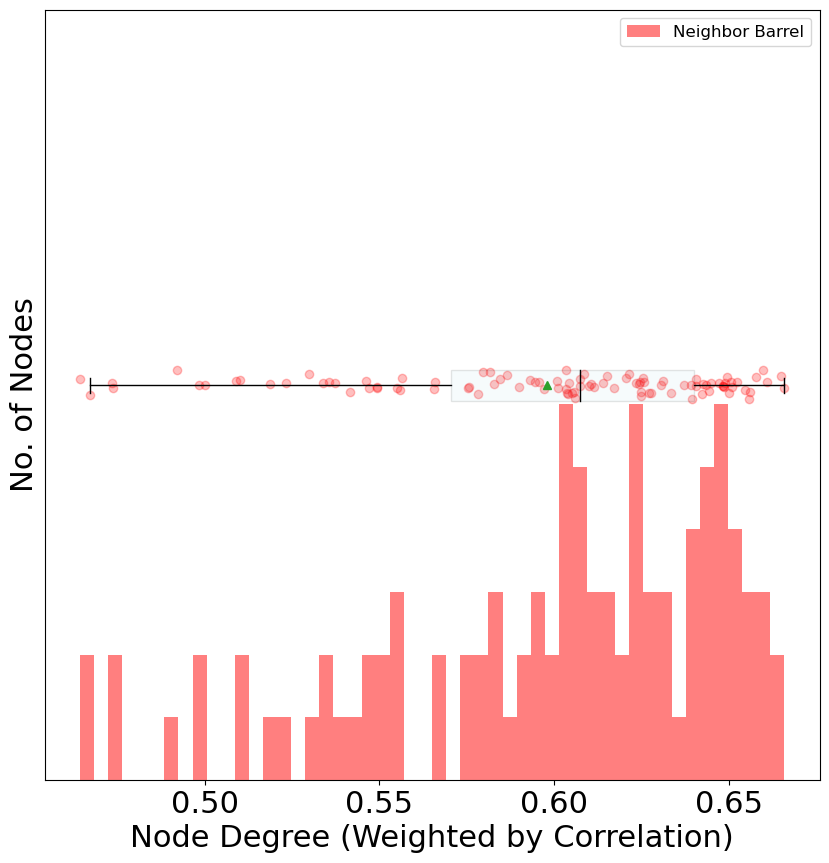

Date: 2/5/2025, Slice/Location: 2_2
[0.8208762544645809, 0.8185198299986844, 0.861064928582463, 0.8436217519723295, 0.8449355939248131, 0.8198140721530717, 0.8454603843230118, 0.8849463066901272, 0.8396996897283534, 0.8711376434694831, 0.8588282104405208, 0.8778860874907164, 0.7134945538149345, 0.8539361224344604, 0.8191701342977482, 0.8233829430806671, 0.8524328366460615, 0.828390058029214, 0.8835976803712493, 0.6921811340322805, 0.8753305353753463, 0.848822130664827, 0.844353399594939, 0.8603506899156422, 0.8441305534592697, 0.8388283979054887, 0.8675094890066544, 0.875866114222217, 0.8731889801801156, 0.8695042736258317, 0.8534820713326452, 0.8632628736783432, 0.8405768812282672, 0.8458250790763834, 0.8603122915129967, 0.8509223068003388, 0.8558386235696032, 0.8441202536613585, 0.8728901788153579, 0.8678988345226427, 0.8813179772989389, 0.8643727179190942, 0.8742711371891716, 0.8493954327392953, 0.8470177991218365, 0.8648948282689529, 0.8818387497456867, 0.8281532381179928, 0.865371

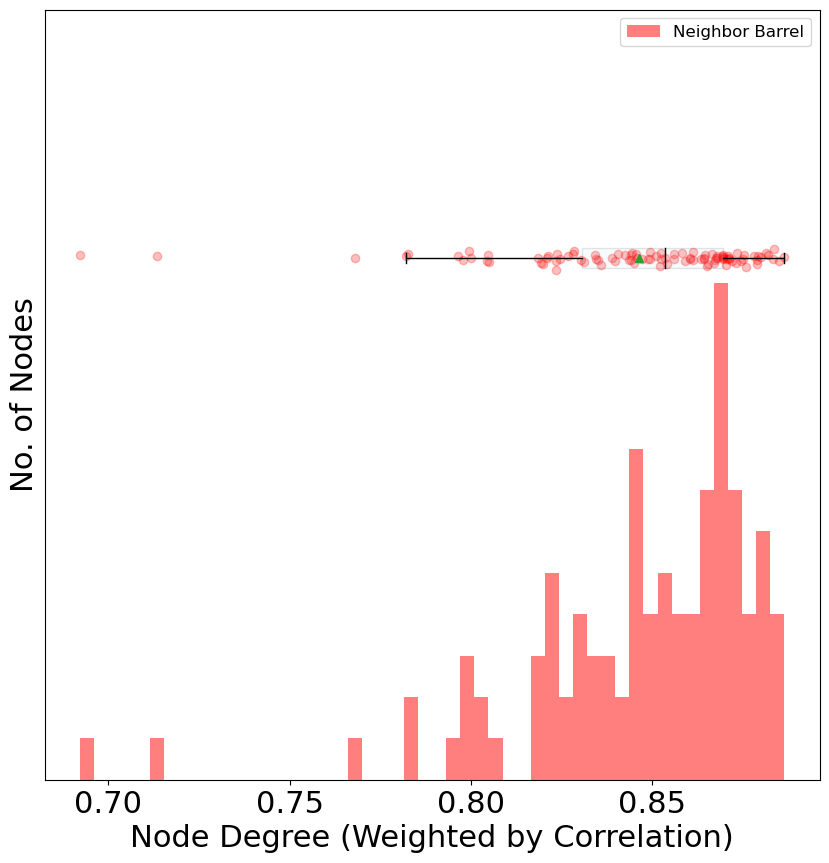

Date: 4/16/2025, Slice/Location: 1_1
[0.8089602715192749, 0.7792621446504288, 0.790211301053398, 0.7959878023475333, 0.7479764802682667, 0.7942845263392317, 0.8183732874598347, 0.7735808554730333, 0.7559215145409268, 0.7569477509497147, 0.7777184452427514, 0.7865932324866933, 0.8163302232312339, 0.7877106803176522, 0.7877864225920226, 0.7647986810090361, 0.7888812544129938, 0.7884056420520251, 0.8217001405500404, 0.7429621656107015, 0.8127322256621872, 0.7276739012050689, 0.7870795887031257, 0.7639166783975241, 0.8023360932041828, 0.7523585285643517, 0.7792080231644867, 0.8028728218581056, 0.7649672132277987, 0.7734037870896067, 0.8052411534535641, 0.8095885154115299, 0.7817681552526744, 0.8002006717686938, 0.8189450635891582, 0.8073177758841708, 0.7417243059935458, 0.8008373301497491, 0.783952799395456, 0.8254331893528934, 0.7996934630086324, 0.7682587729148016, 0.7905194989801837, 0.7863805232137798, 0.7974815355813034, 0.8118238628450386, 0.7822754786029913, 0.7761091702942832, 0.75

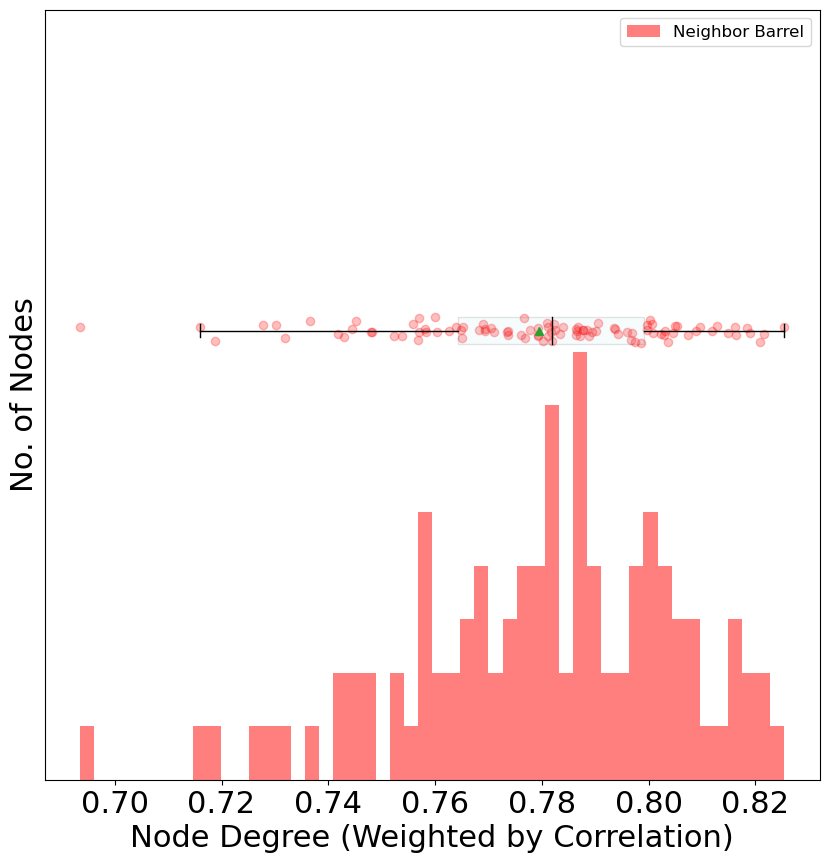

Date: 4/16/2025, Slice/Location: 2_2
[0.7917099673553407, 0.8115729281246763, 0.7990007155655908, 0.7665655115429381, 0.8254466356086965, 0.8253934712139017, 0.814254818365396, 0.7746657989343025, 0.7927041212834066, 0.696441721582977, 0.8040874346687081, 0.7834925745856112, 0.8115365683172749, 0.8038780651947628, 0.7603075130402659, 0.7345377261642664, 0.8023347326306002, 0.8033074293494338, 0.7093703987046897, 0.7786659526451561, 0.7246474911895294, 0.7247456508596558, 0.7953660704594125, 0.7957667912786873, 0.8096087339585271, 0.7600548597426795, 0.7918717585625084, 0.7028468857296539, 0.7520774234865153, 0.8102418999243761, 0.81485478862598, 0.8188087893256478, 0.7852624299000204, 0.7083033916189244, 0.7876018856673618, 0.7261363262619203, 0.7988741033285813, 0.7488045587438132, 0.78988336210794, 0.7951992995875958, 0.6742896733846816, 0.6440188843145656, 0.8092574965127055, 0.7857493582891417, 0.8108069334464335, 0.7804263263308238, 0.7953196281421046, 0.7305992129375396, 0.768682

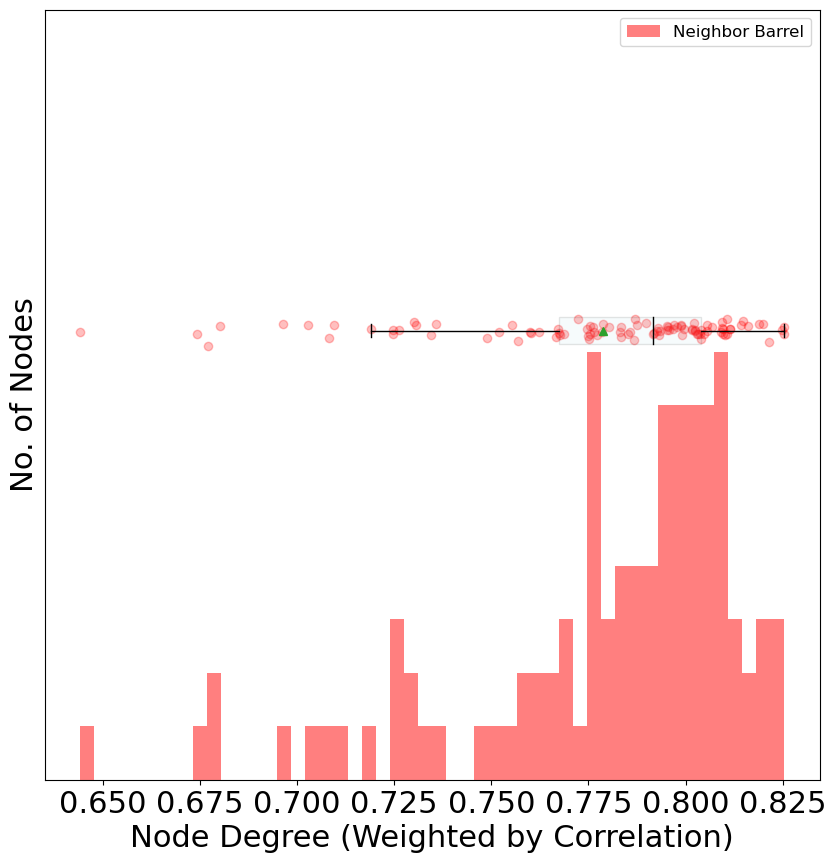

Date: 4/9/2025, Slice/Location: 1_2
[0.8140058806099123, 0.8396969148830159, 0.8467005212465555, 0.7655336323165628, 0.8021019769343285, 0.8310793741682981, 0.7467887920481497, 0.8403540391484493, 0.7930199532529096, 0.8089022907259953, 0.8162408641109089, 0.8213242304051489, 0.8117336187876054, 0.8256690880219913, 0.7798130955200129, 0.827080592715821, 0.7950099693478014, 0.7893104864666195, 0.8066309133838155, 0.8295682361127393, 0.8062694364165879, 0.8109593845306379, 0.8448824006149865, 0.7933403709853347, 0.8270699758337718, 0.7907725665209725, 0.7941364058727804, 0.8030230827169783, 0.8051811148017535, 0.8252211283723315, 0.7843615327473236, 0.7943555272952508, 0.8404250486833463, 0.7825491148849212, 0.7826242917347298, 0.8193019159939456, 0.8398208816323922, 0.8243940792250923, 0.8007343637017347, 0.8133556945395557, 0.7806423088198606, 0.7889547667461381, 0.8207760032137369, 0.8077130588536254, 0.7883101212326806, 0.8194066949420483, 0.8413935766443069, 0.7956872017269083, 0.83

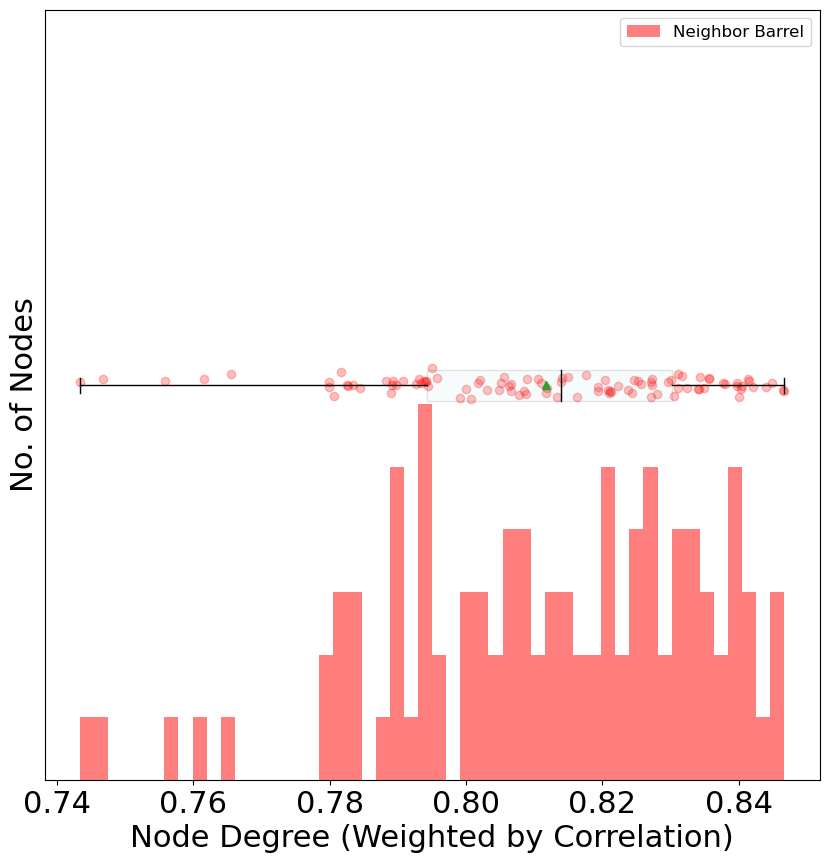

Date: 4/9/2025, Slice/Location: 2_2
[0.7815707128572332, 0.817201901507793, 0.8222156749197574, 0.7946723972486208, 0.8235366596413567, 0.7670738950230562, 0.7901077984007383, 0.7664892850453959, 0.8048584735679383, 0.7677770129544276, 0.8250203728795091, 0.7490966954624138, 0.8253713329452382, 0.7508438212293675, 0.7361388664709619, 0.7225788128090478, 0.7813624405891821, 0.8271601460694497, 0.747794673784042, 0.7902824309604768, 0.8213399087454138, 0.825133325306331, 0.8249086132702622, 0.8182008064399015, 0.7663112095991689, 0.7632687909939492, 0.8318573307264776, 0.8011326139543209, 0.8280077537003617, 0.7820574413566769, 0.8232443742813818, 0.824525770820102, 0.8272022940825474, 0.8262059768504556, 0.7794187736869728, 0.7991136257556494, 0.8253838292320897, 0.8222943384054909, 0.8220947172556153, 0.8201702693365136, 0.8239997151158335, 0.8072638325037875, 0.7853831676014978, 0.8073393828121885, 0.8083425541173019, 0.8171662567812648, 0.8224488128685541, 0.797628588423812, 0.752586

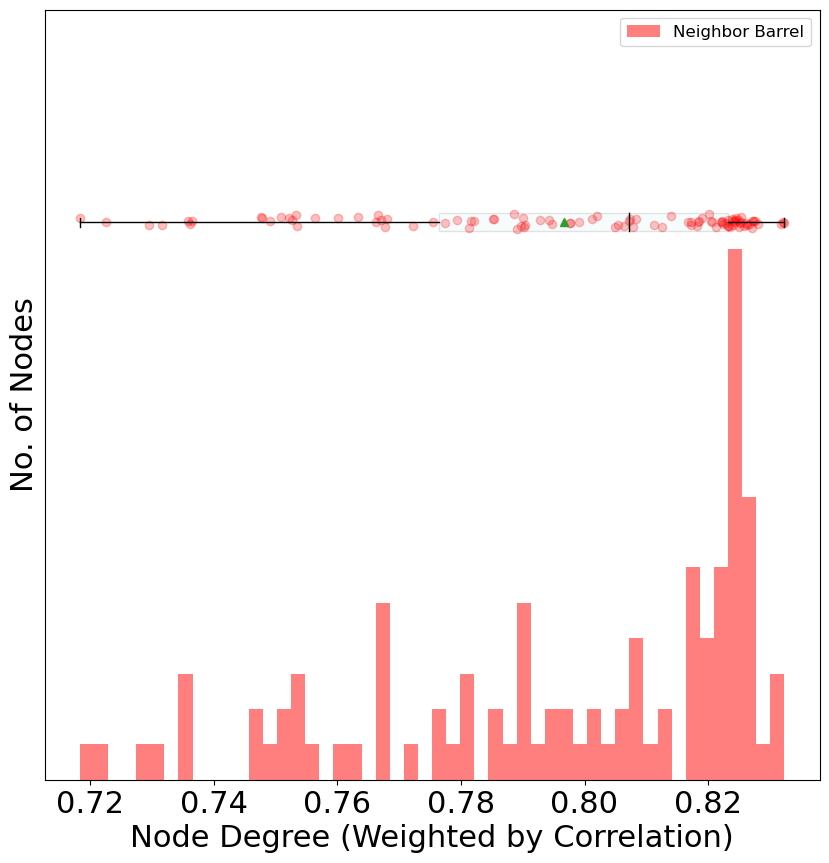

Date: 4/9/2025, Slice/Location: 3_2
[0.8304749223464168, 0.856758462630959, 0.841861518571645, 0.8568736424895435, 0.8625538141897772, 0.8613714490732062, 0.8665238855397642, 0.8401655517640598, 0.8609538384012754, 0.8572092192117508, 0.8604675430999715, 0.8481048061557199, 0.8456337257438031, 0.8573876880256059, 0.7649229342009314, 0.8187331601269746, 0.8554497308751482, 0.8353630845005681, 0.7760892362055531, 0.8574083296402905, 0.8495215797613039, 0.8583528774368719, 0.8654391131384387, 0.8571438395354011, 0.7796645730844906, 0.85946387681928, 0.8070403020948284, 0.8093484767368613, 0.8063723055355314, 0.8585253708827014, 0.8511654198969302, 0.8574649016909948, 0.8576657240249255, 0.8587643011876697, 0.8239622520879962, 0.858637676255085, 0.7857427083426344, 0.829298121537121, 0.8222888006571706, 0.7437821273836177, 0.8499030159591267, 0.8524158342060796, 0.8558773573039614, 0.8556648660726713, 0.8601422055142728, 0.8204372002741128, 0.8479170723525767, 0.8525727188139328, 0.7963315

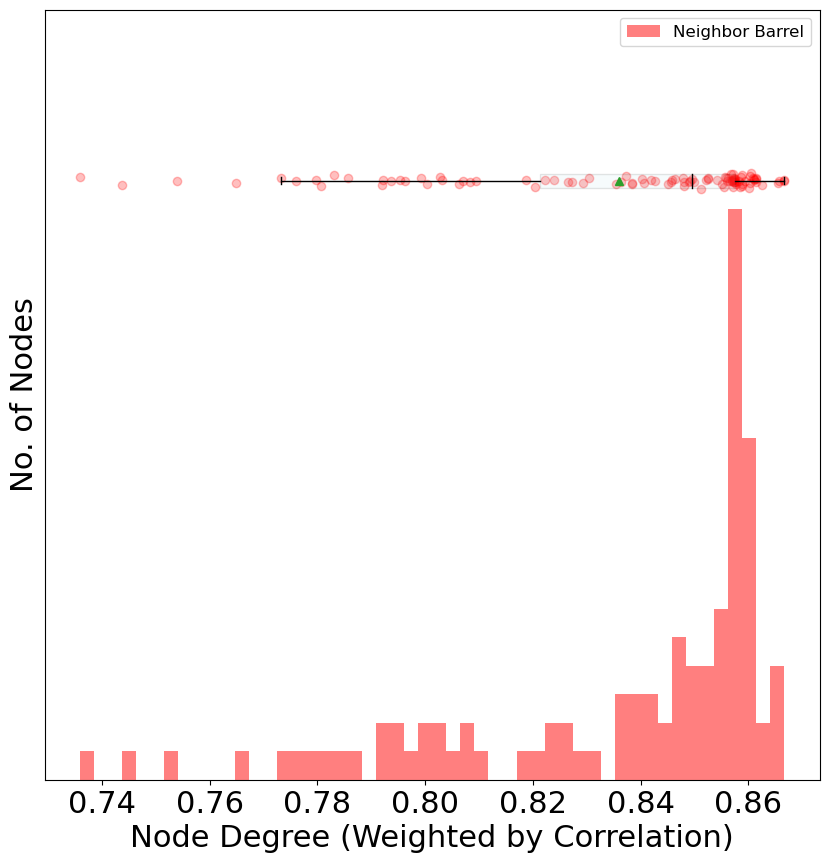

Date: 4/9/2025, Slice/Location: 4_2
[0.7406749306579048, 0.6991563260302017, 0.5946824987908249, 0.7404132284918334, 0.6952620325708573, 0.6123731634706098, 0.692739840776265, 0.6532896790789898, 0.7020208455011367, 0.671743029975902, 0.691484844602693, 0.6118423741268831, 0.6124827288397099, 0.7047900413973504, 0.6909066584668022, 0.7287192133452005, 0.6724920776361804, 0.755637283022695, 0.7182612892621325, 0.693542690489643, 0.7329966886187608, 0.7356790312547479, 0.6028796254774149, 0.7602887690533997, 0.68102415894241, 0.7385003564578496, 0.605695793375019, 0.6621509016779855, 0.7433400526398237, 0.6777996845863058, 0.6645642197721116, 0.7380000878420094, 0.7481139130854473, 0.6583038803976976, 0.7049886266736981, 0.7315910242967264, 0.73103394588166, 0.7480277945202746, 0.5985073170074013, 0.7106721473230811, 0.7526235303721741, 0.6933379788143034, 0.7307334525161372, 0.7550024366919593, 0.7094834765791528, 0.7312231518154483, 0.6174780848204545, 0.7552688171576439, 0.64834854566

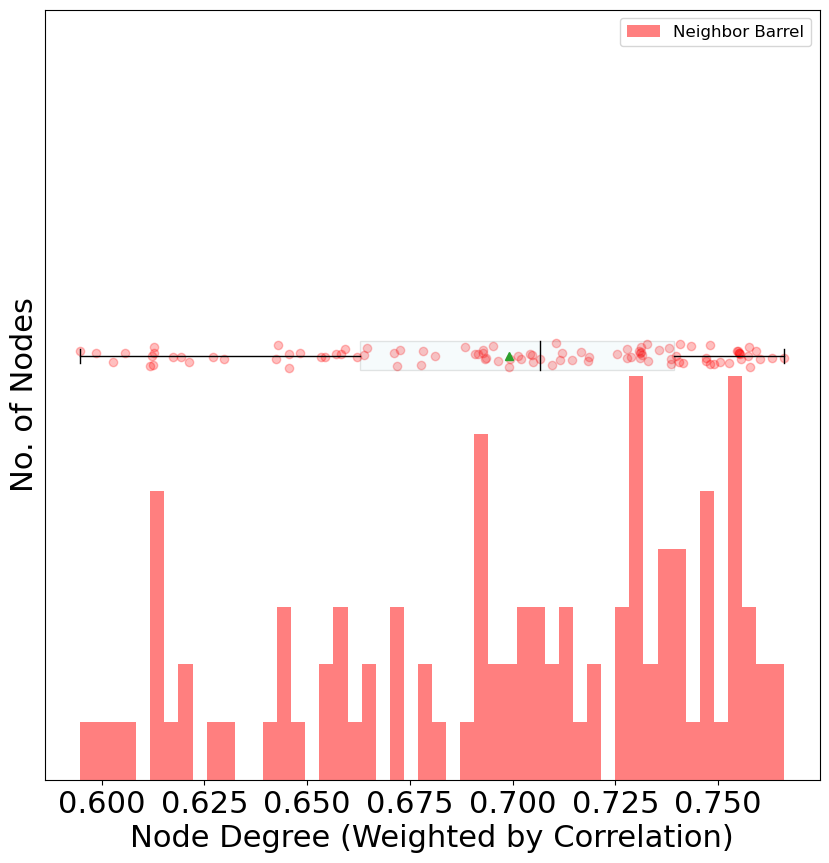

In [21]:
for date in node_degree_dist.keys():
    for slic_loc_id in node_degree_dist[date].keys():
        print(f"Date: {date}, Slice/Location: {slic_loc_id}")
        # plot the distribution of node degrees
        fig, ax = plt.subplots(figsize=(10, 10))
        #ax.set_xlim(0, 1)

        print(list(node_degree_dist[date][slic_loc_id][1].values()))

        ax.hist(list(node_degree_dist[date][slic_loc_id][1].values()),
                    bins=50, histtype='bar',
                    color='red', alpha=0.5, label='Neighbor Barrel',)
        plot_ylim = ax.get_ylim()[1]

        # plot scatter points for each node degree
        y_jitter = np.random.normal(0, 0.1, len(node_degree_dist[date][slic_loc_id][1].values()))
        ax.scatter(list(node_degree_dist[date][slic_loc_id][1].values()),
                    y_jitter + plot_ylim, color='red', alpha=0.25)

        # add horizontal boxplots 
        ax.boxplot([ 
                    list(node_degree_dist[date][slic_loc_id][1].values())],
                    positions=[ plot_ylim], 
                            widths=0.5, patch_artist=True,
                    boxprops=dict(facecolor='lightblue', alpha=0.1),
                    showfliers=False,
                    medianprops=dict(color='black'), showmeans=True, vert=False)

        ax.set_ylim(0, plot_ylim + 6)
        ax.legend(loc='upper right', fontsize=12)
        ax.set_yticks([])

        ax.set_xlabel('Node Degree (Weighted by Correlation)')
        ax.set_ylabel('No. of Nodes')
        date_formatted = date.replace('/', '-')
        plt.savefig(f"{output_fig_dir}/{date_formatted}_{slic_loc_id}_"
                    f"node_degree_distribution_barrel_percentile{str(int(percentile_threshold * 100))}_intrabarrel.png")
        plt.show()

Date: 12/23/2024, Slice/Location: 1_3
Slope: -0.0015169133099523328, Intercept: 0.9548276575433352, R^2: 0.5019380617478326, p-value: 0.0, Std Err: 2.1481397377387238e-05


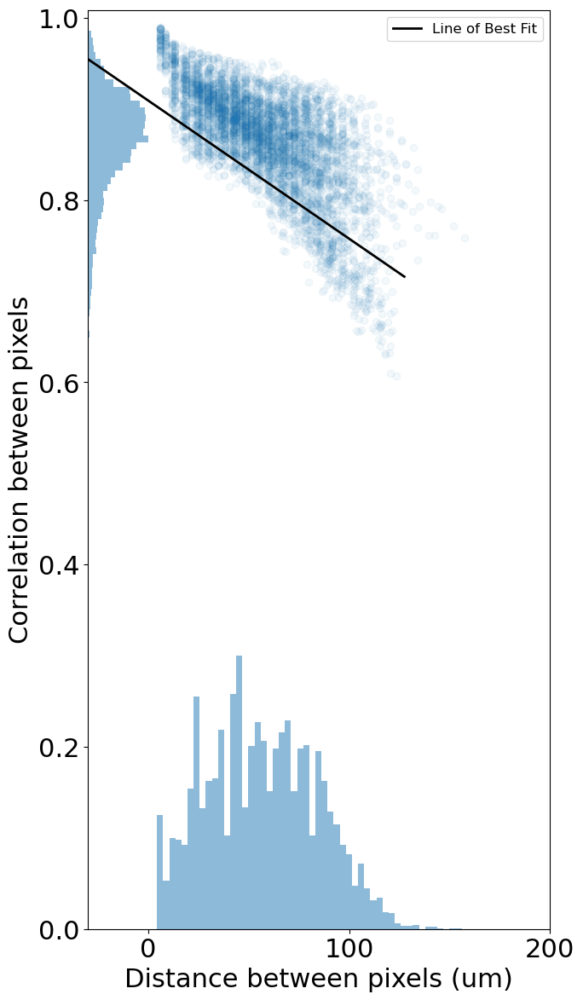

Date: 12/23/2024, Slice/Location: 2_2
Slope: -0.001568512062473757, Intercept: 0.6177762605479893, R^2: 0.311565395125738, p-value: 0.0, Std Err: 3.314589543164825e-05


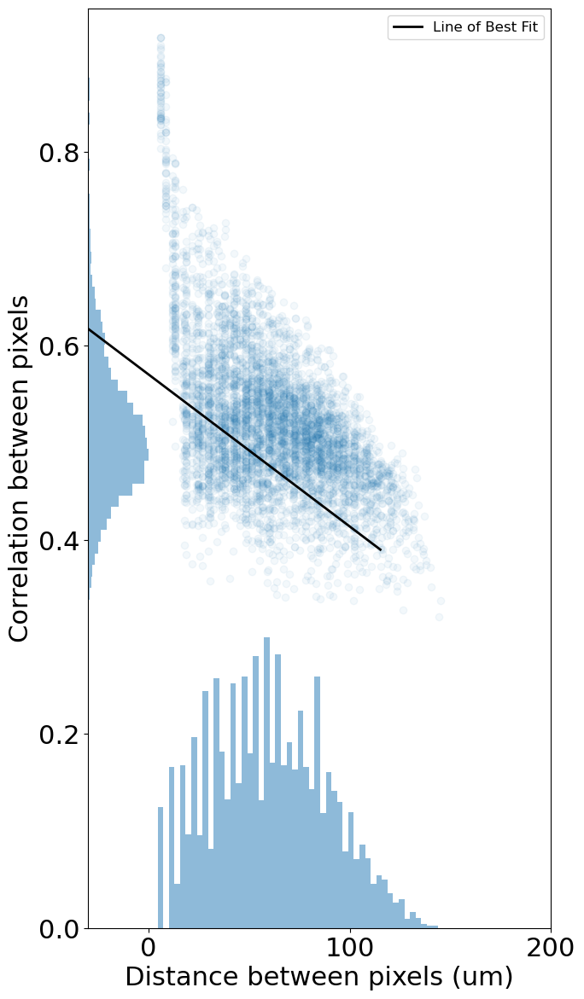

Date: 1/15/2025, Slice/Location: 1_3
Slope: -0.0031892215999362325, Intercept: 0.46460782326370575, R^2: 0.48402734607898906, p-value: 0.0, Std Err: 4.681103510383302e-05


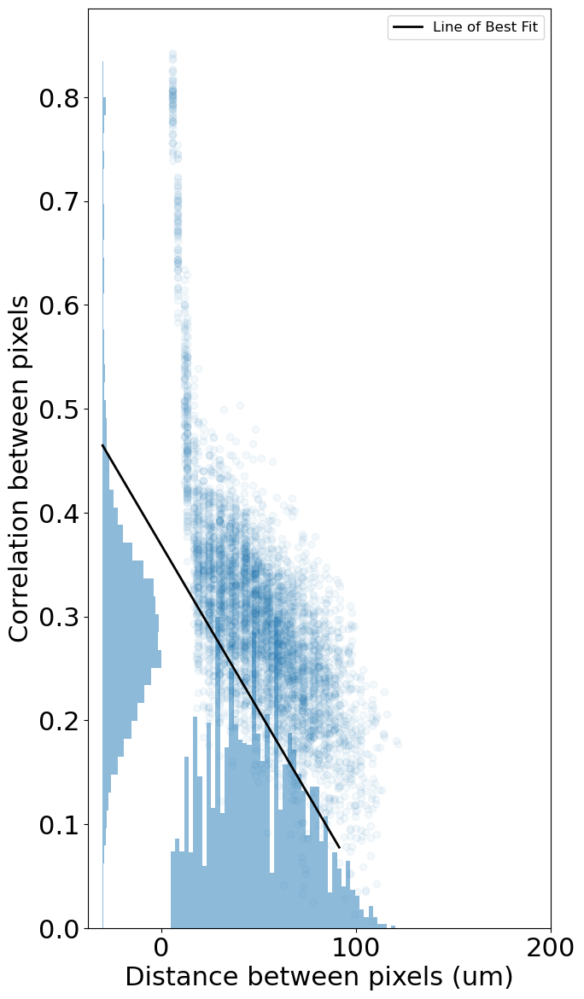

Date: 1/15/2025, Slice/Location: 3_2
Slope: -0.0029391001717621857, Intercept: 0.5999579532740951, R^2: 0.5639226245911356, p-value: 0.0, Std Err: 3.674274179401888e-05


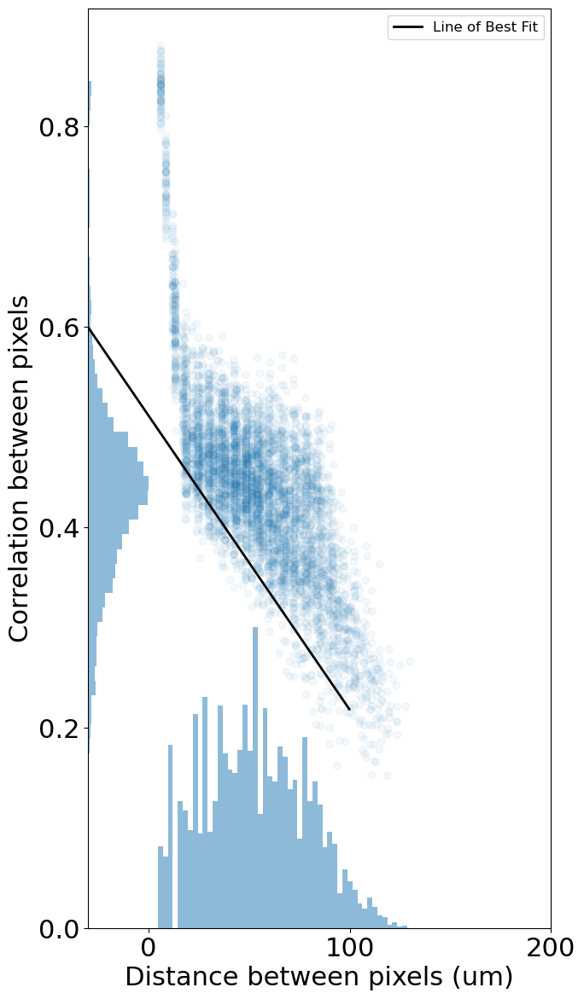

Date: 1/22/2025, Slice/Location: 1_2
Slope: -0.0018922118781342172, Intercept: 0.6388838763300829, R^2: 0.20517880720101342, p-value: 4.62262363201962e-249, Std Err: 5.294480922594511e-05


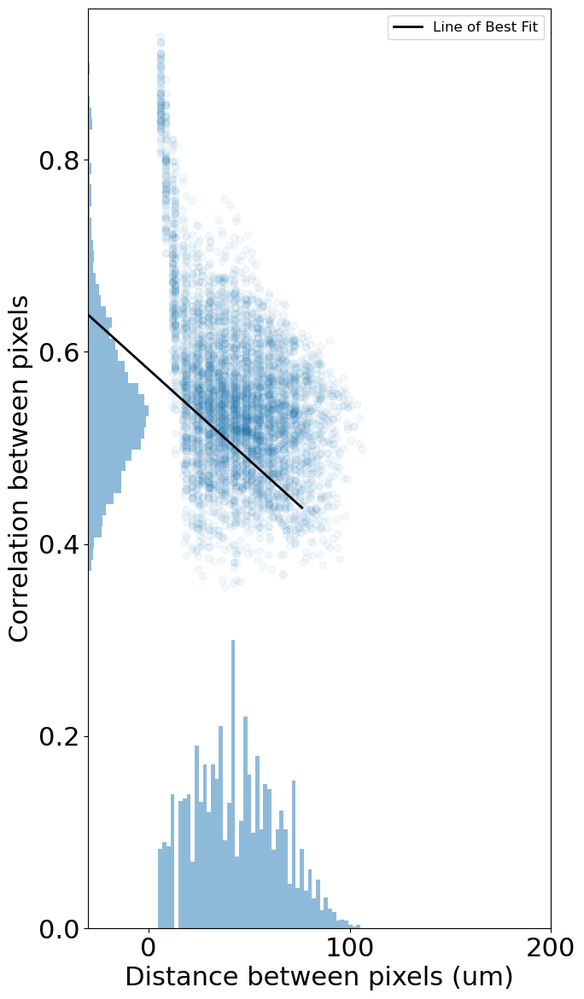

Date: 1/22/2025, Slice/Location: 3_2
Slope: -0.006824967137067372, Intercept: 0.651090571392142, R^2: 0.5297069929176694, p-value: 0.0, Std Err: 9.142229651126626e-05


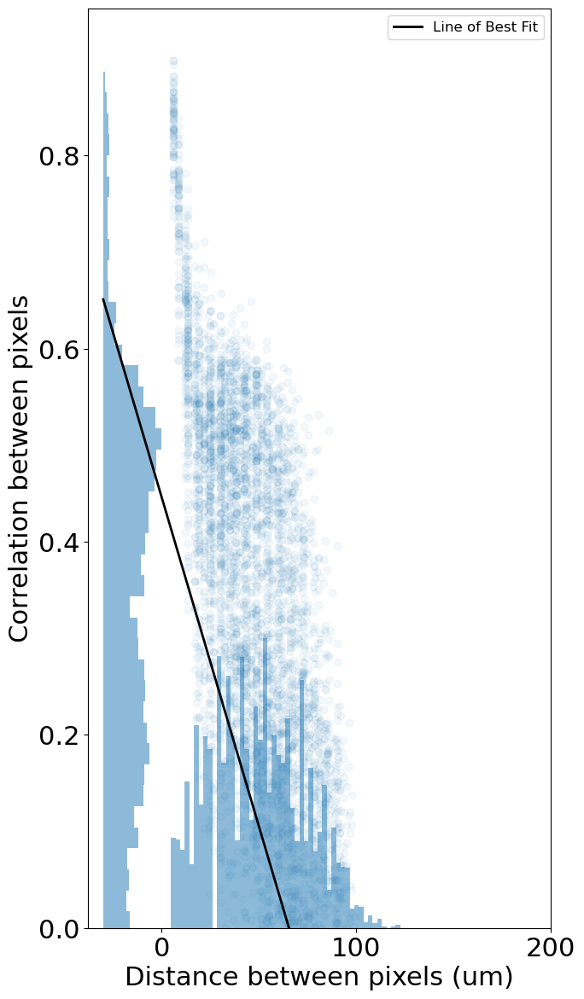

Date: 2/5/2025, Slice/Location: 1_3
Slope: -0.0021994816497863247, Intercept: 0.7280448095375751, R^2: 0.381321648864944, p-value: 0.0, Std Err: 3.982834185431415e-05


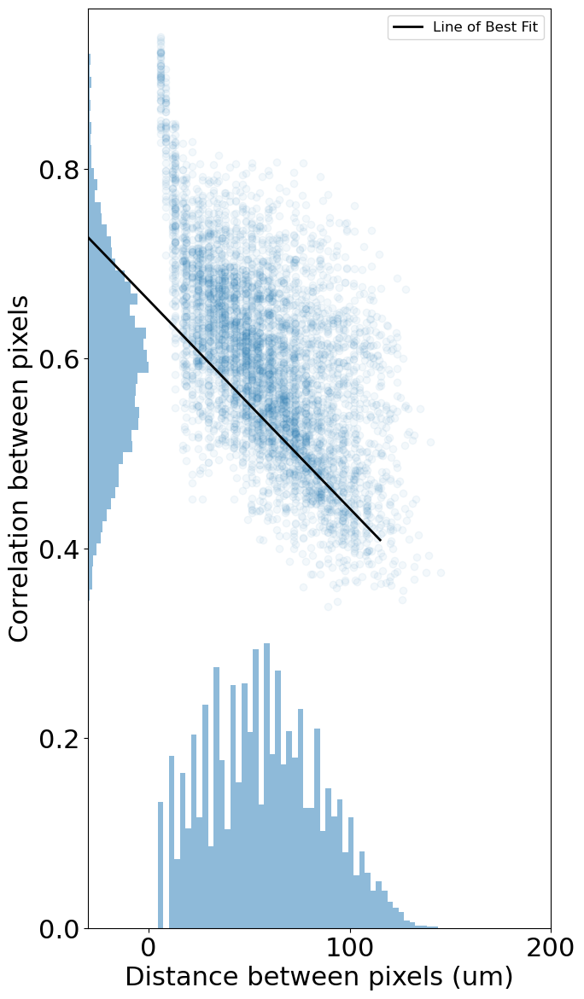

Date: 2/5/2025, Slice/Location: 2_2
Slope: -0.001866306568898931, Intercept: 0.9322433607121641, R^2: 0.3291519267965972, p-value: 0.0, Std Err: 3.787756278099231e-05


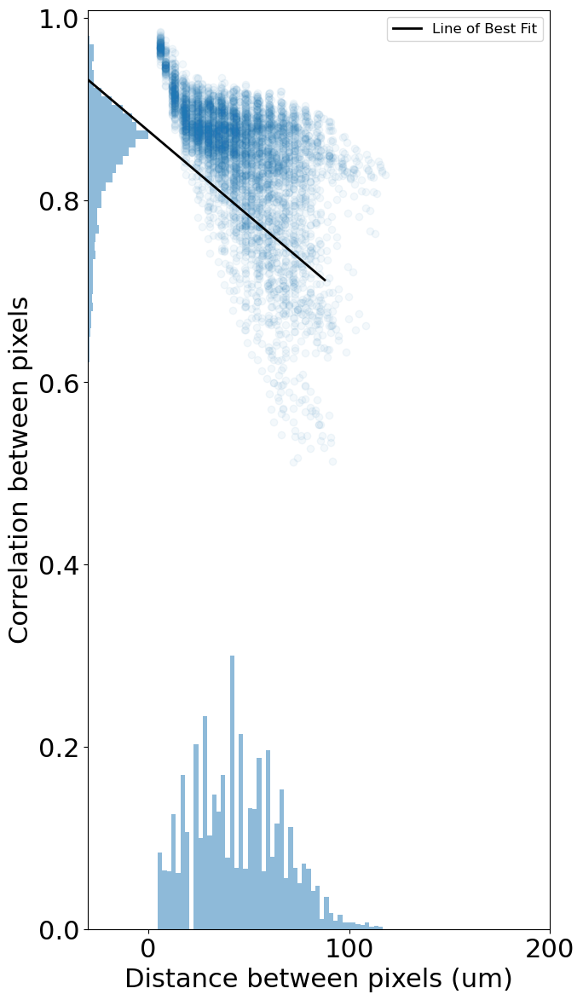

Date: 4/16/2025, Slice/Location: 1_1
Slope: -0.0018291262125185806, Intercept: 0.8639660343047842, R^2: 0.5197881521087105, p-value: 0.0, Std Err: 2.499378763326538e-05


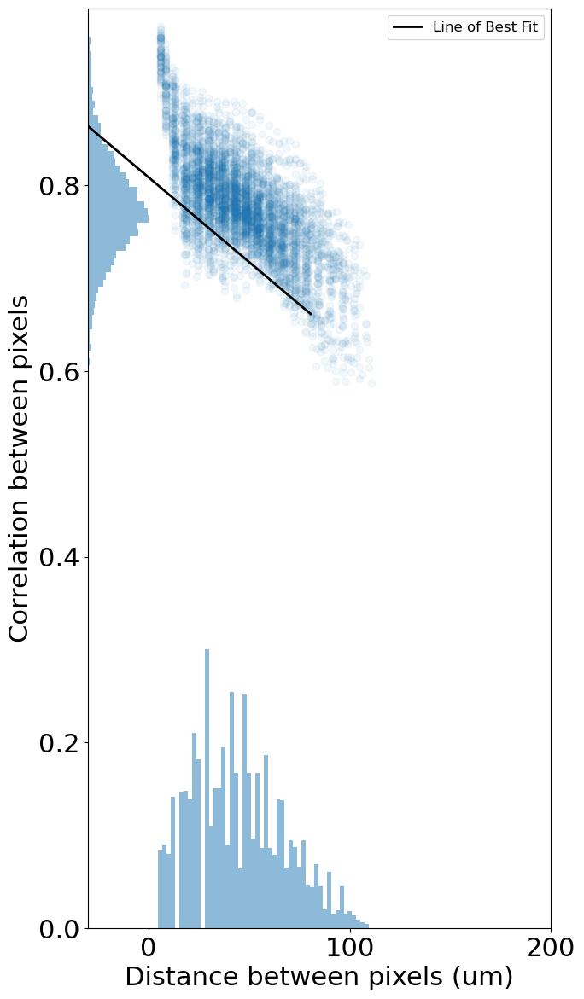

Date: 4/16/2025, Slice/Location: 2_2
Slope: -0.001348717618267968, Intercept: 0.8389582700416741, R^2: 0.19682333810240463, p-value: 8.126827596384732e-238, Std Err: 3.8732312660828523e-05


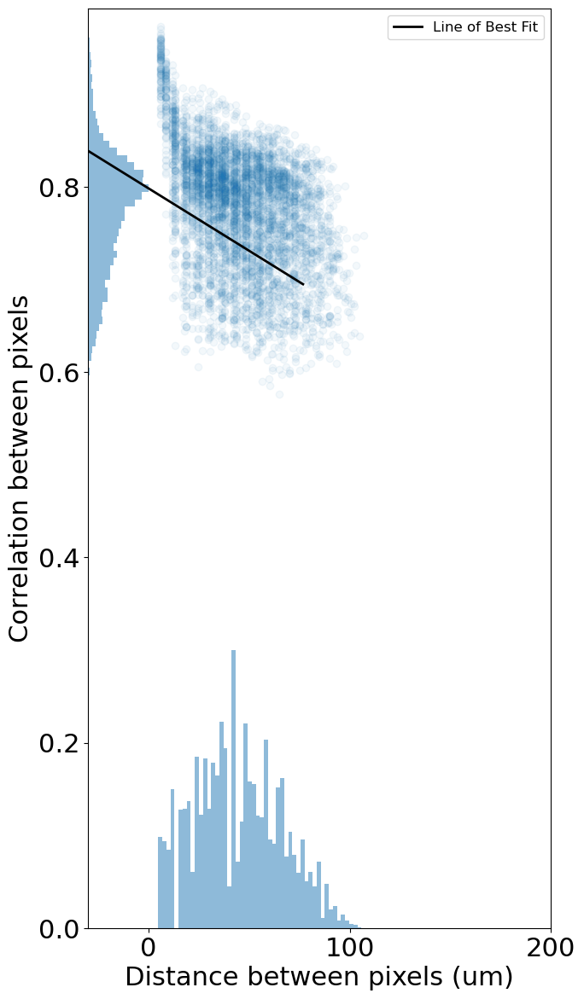

Date: 4/9/2025, Slice/Location: 1_2
Slope: -0.0015350949428567494, Intercept: 0.881034928645598, R^2: 0.5322755516760178, p-value: 0.0, Std Err: 2.0457246198349394e-05


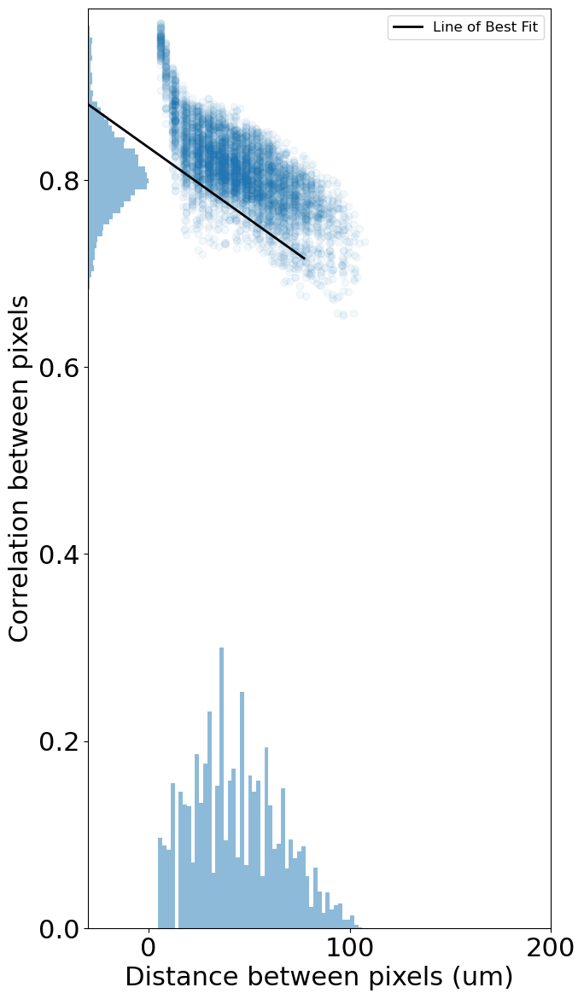

Date: 4/9/2025, Slice/Location: 2_2
Slope: -0.001533050962087897, Intercept: 0.8602630623631493, R^2: 0.25994474838909387, p-value: 0.0, Std Err: 3.677335844488449e-05


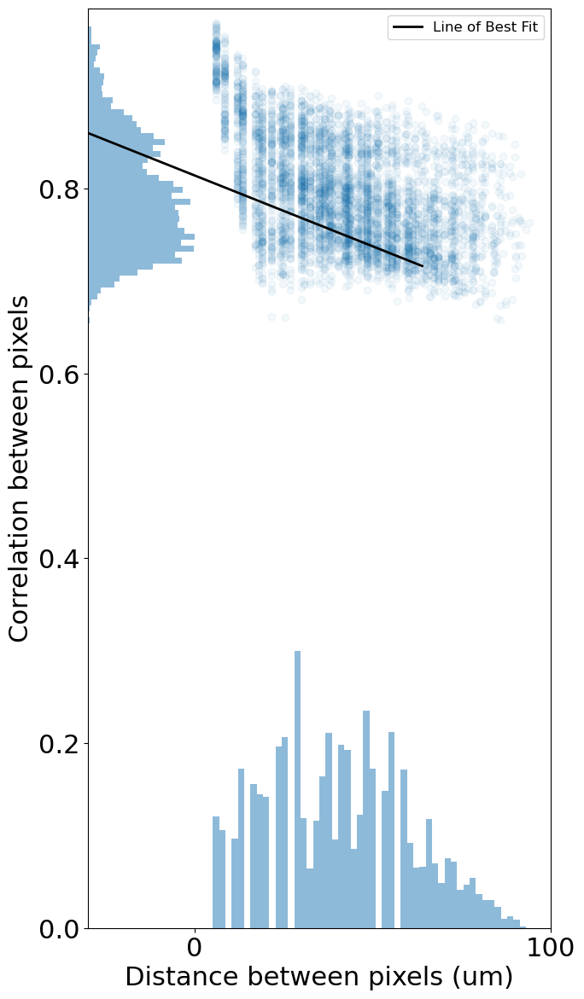

Date: 4/9/2025, Slice/Location: 3_2
Slope: -0.0008271116766321756, Intercept: 0.8743300210317668, R^2: 0.11655035406023967, p-value: 2.368970752864224e-135, Std Err: 3.2373034374900905e-05


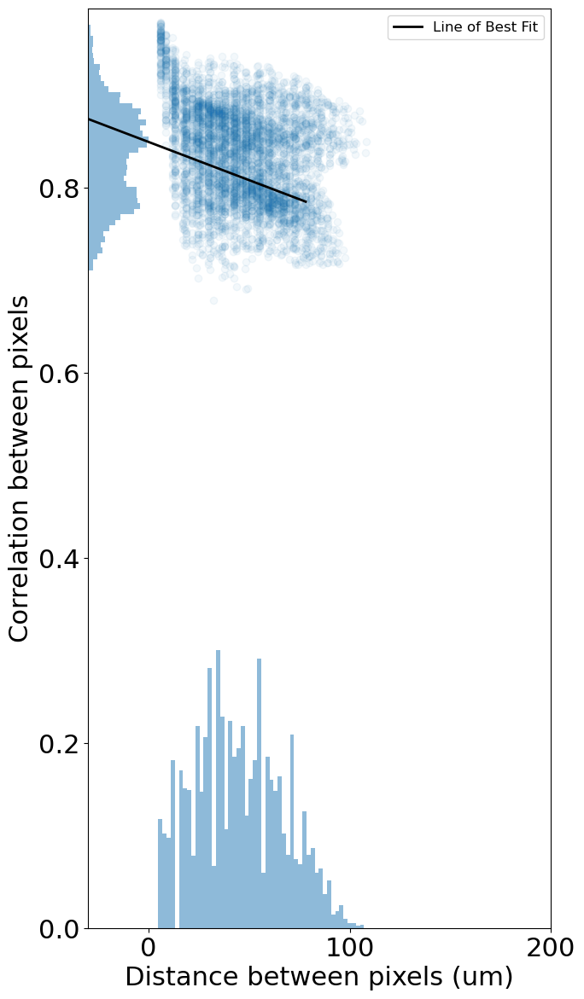

Date: 4/9/2025, Slice/Location: 4_2
Slope: -0.001499672759721347, Intercept: 0.7734672625247564, R^2: 0.1666125309106949, p-value: 4.157246201213209e-198, Std Err: 4.7681653754944534e-05


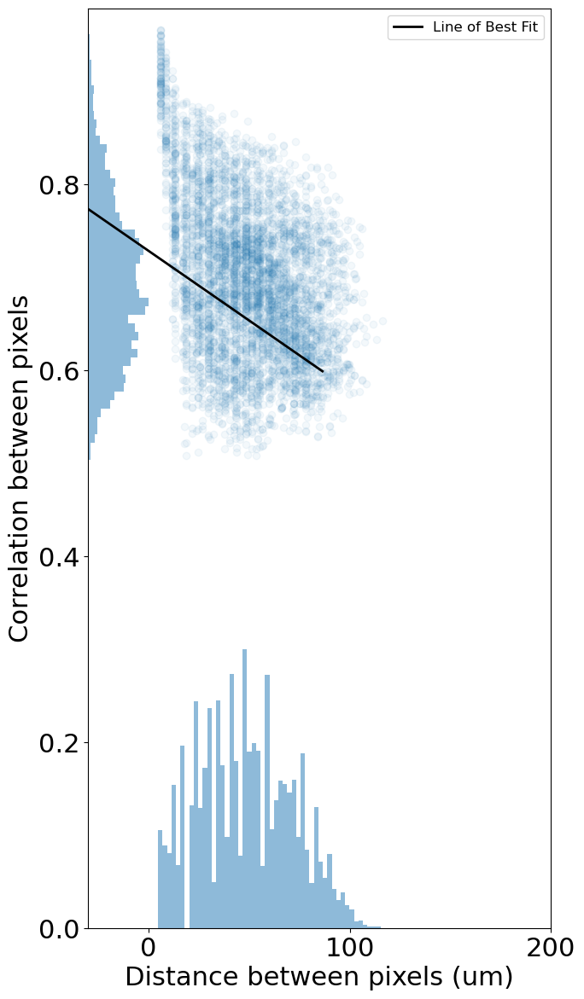

In [22]:
# Scatter plot of distance vs correlation in left subplot
x_shift = 30 # spacing for horizontal histogram
for date in distance_vs_corr.keys():
    for slic_loc_id in distance_vs_corr[date].keys():
        print(f"Date: {date}, Slice/Location: {slic_loc_id}")
        #distance_vs_corr[date][slic_loc_id]['distance'] = np.array(distance_vs_corr[date][slic_loc_id]['distance'])
        #distance_vs_corr[date][slic_loc_id]['corr'] = np.array(distance_vs_corr[date][slic_loc_id]['corr'])

        # plot the scatter plot
        fig, ax = plt.subplots(1, 1, figsize=(7, 14))
        ax.scatter(np.array(distance_vs_corr[date][slic_loc_id]['distance']) * um_per_px + x_shift, 
                    distance_vs_corr[date][slic_loc_id]['corr'], alpha=0.05)
        ax.set_xlabel('Distance between pixels (um)')
        ax.set_ylabel('Correlation between pixels')

        # get plot ylim
        plot_ylim = ax.get_ylim()[1]

        # add a histogram of the number of points at each distance
        counts, bins, _ = plt.hist(np.array(distance_vs_corr[date][slic_loc_id]['distance']) * um_per_px + x_shift, bins=50, alpha=0)
        # Normalize bin heights
        max_count = max(counts)
        normalized_counts = counts / max_count * 0.3  # Scale to [0, 0.3]
        ax.bar(bins[:-1], normalized_counts, width=np.diff(bins), color='tab:blue', alpha=0.5)

        # add a horizontal histogram of the number of points at each correlation value
        counts_corr, bins_corr, _ = plt.hist(distance_vs_corr[date][slic_loc_id]['corr'], bins=50, alpha=0)
        # Normalize bin heights
        max_count_corr = max(counts_corr)
        normalized_counts_corr = counts_corr / max_count_corr * 30
        ax.barh(bins_corr[:-1], normalized_counts_corr, height=np.diff(bins_corr), color='tab:blue', alpha=0.5)


        # add a line of best fit
        z = np.polyfit(np.array(distance_vs_corr[date][slic_loc_id]['distance']) * um_per_px, 
                        distance_vs_corr[date][slic_loc_id]['corr'], 1)
        p = np.poly1d(z)
        x_fit = np.linspace(0, max(distance_vs_corr[date][slic_loc_id]['distance']) * um_per_px, 100)
        ax.plot(x_fit, p(x_fit), color='black', linewidth=2, label='Line of Best Fit')
        ax.legend(loc='upper right', fontsize=12)
        # linear regression metrics
        slope, intercept, r_value, p_value, std_err = linregress(
            np.array(distance_vs_corr[date][slic_loc_id]['distance']) * um_per_px, 
            distance_vs_corr[date][slic_loc_id]['corr'])
        print(f"Slope: {slope}, Intercept: {intercept}, R^2: {r_value**2}, p-value: {p_value}, Std Err: {std_err}")

        ax.set_ylim(0, plot_ylim)
        ax.set_xticks(np.arange(x_shift, max(distance_vs_corr[date][slic_loc_id]['distance']) * um_per_px + 100 + x_shift, 100))
        ax.set_xticklabels([str(int(i)) for i in np.arange(0, max(distance_vs_corr[date][slic_loc_id]['distance']) * um_per_px + 100, 100)])
        plt.show()

#distance_vs_corr = {'distance': [], 'corr': []}


In [23]:
# corr and distance cutoffs for each date/slice/location
cutoff_file = 'C:/Users/jjudge3/Desktop/Data/px_correlation/PPR_corr_dist_cutoffs_intrabarrel.csv'
cutoff_df = pd.read_csv(cutoff_file)
cutoff_df

,Date,Slice_Loc,Correlation_cutoff_max,Distance_cutoff,Correlation_cutoff_min
0,12/23/2024,1_3,0.95,20,0.855
1,12/23/2024,2_2,0.65,20,0.585
2,1/15/2025,1_3,0.45,20,0.405
3,1/15/2025,3_2,0.60,20,0.540
4,1/22/2025,1_2,0.70,20,0.630
5,1/22/2025,3_2,0.60,20,0.540
6,2/5/2025,1_3,0.80,20,0.720
7,2/5/2025,2_2,0.94,20,0.846
8,4/16/2025,1_1,0.94,20,0.846
9,4/16/2025,2_2,0.90,20,0.810


No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
Date:  12/23/2024 Slice:  1 Location:  3
Avg corr shape:  (26, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.9316691276886383


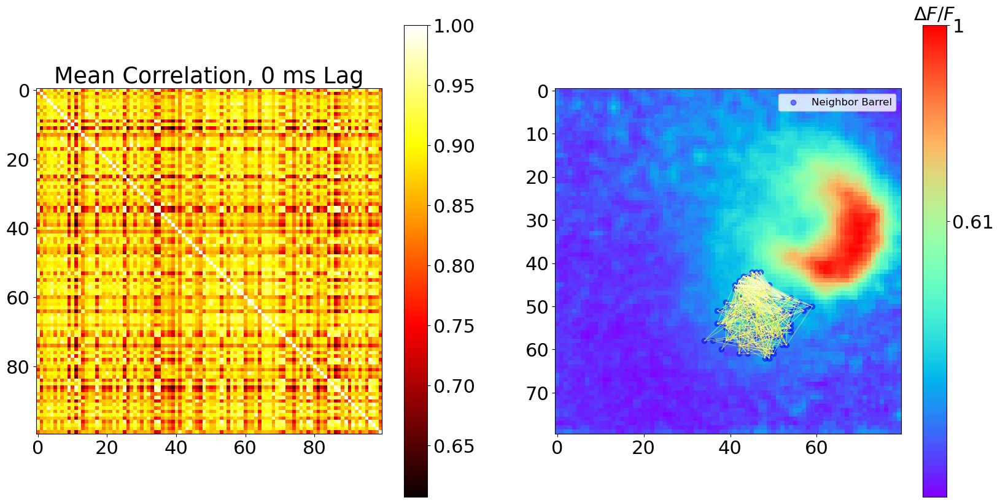

Date:  12/23/2024 Slice:  2 Location:  2
Avg corr shape:  (26, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.6253551465694392


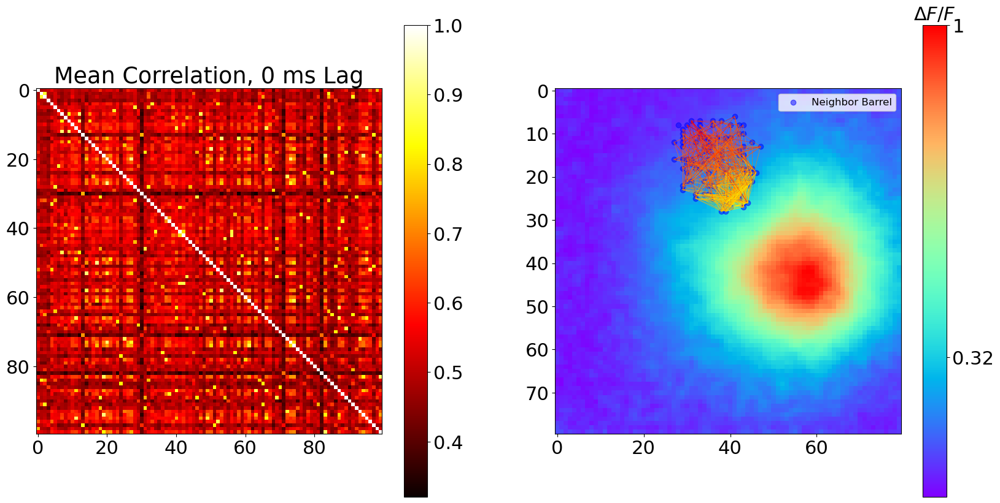

Date:  1/15/2025 Slice:  1 Location:  3
Avg corr shape:  (26, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.4160153159938711


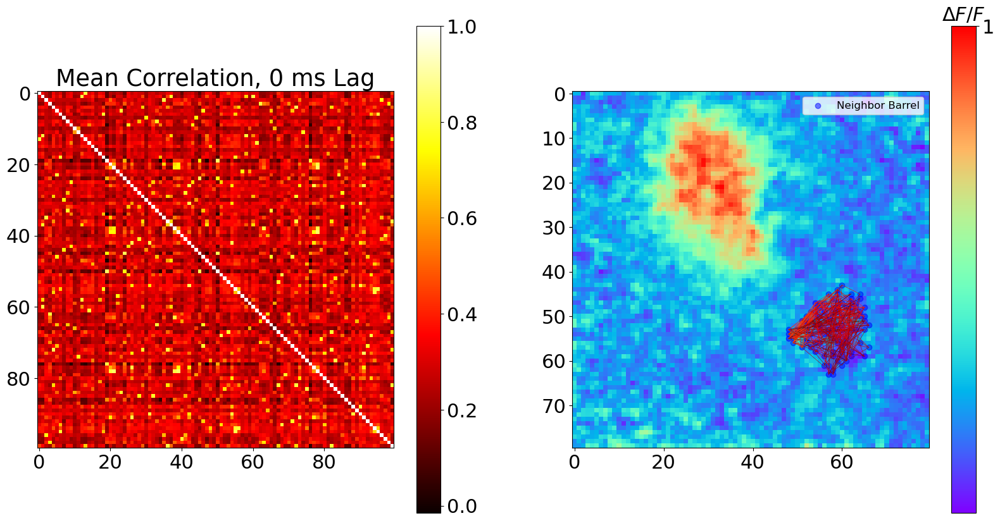

Date:  1/15/2025 Slice:  3 Location:  2
Avg corr shape:  (26, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.54065320535322


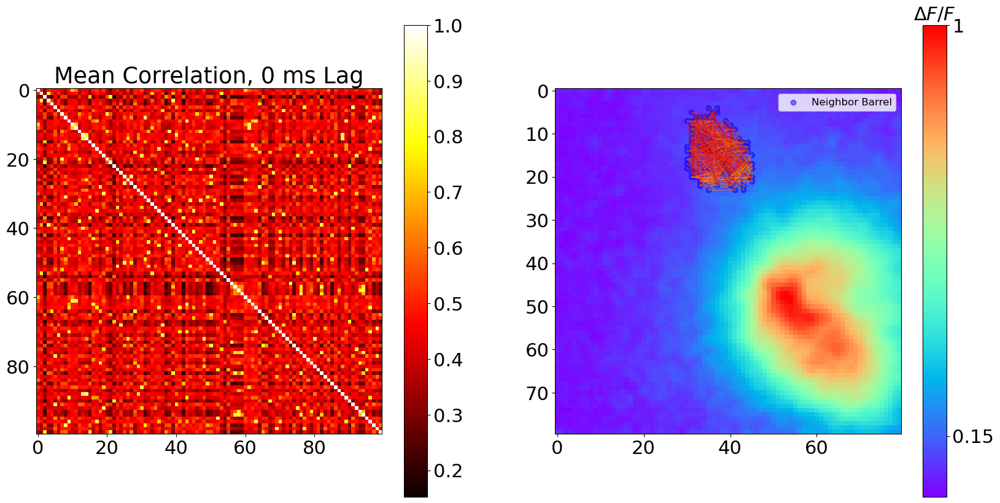

Date:  1/22/2025 Slice:  1 Location:  2
Avg corr shape:  (26, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.6630329225155048


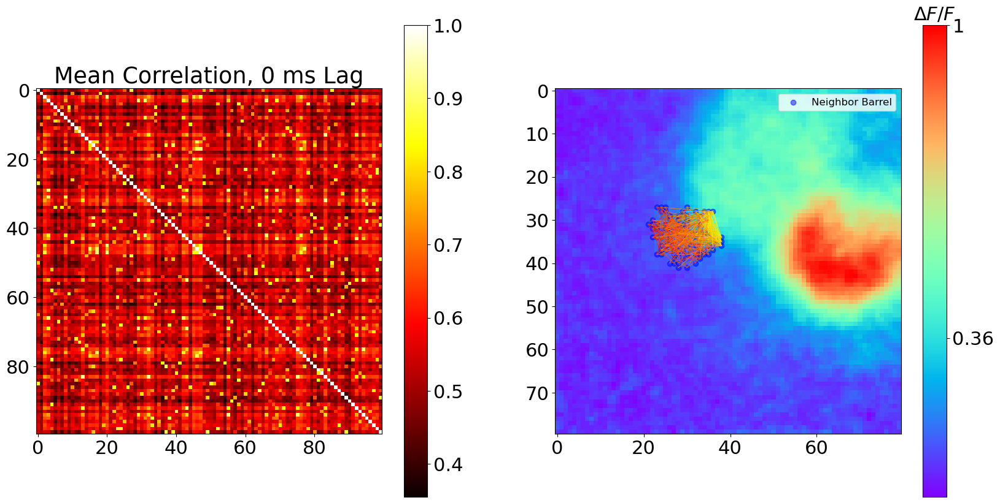

Date:  1/22/2025 Slice:  3 Location:  2
Avg corr shape:  (26, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.5773166578856238


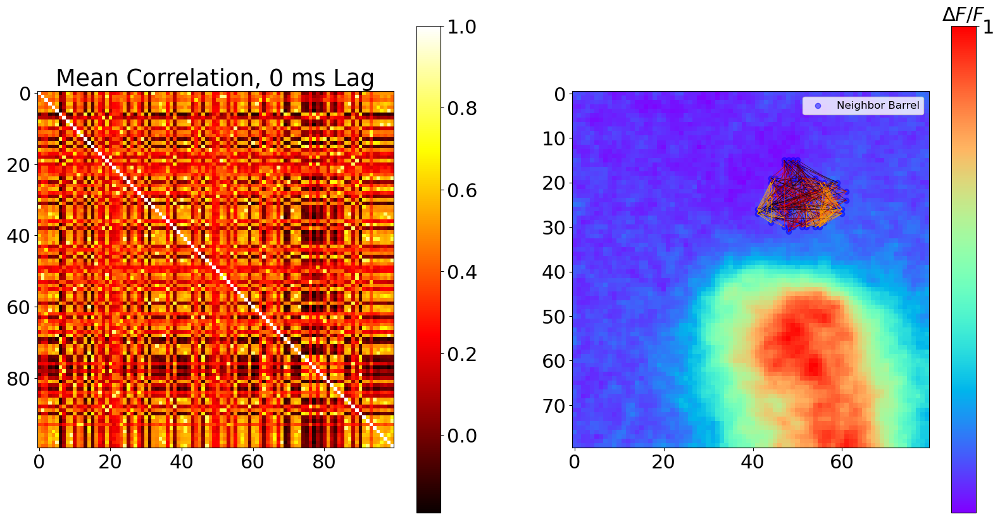

Date:  2/5/2025 Slice:  1 Location:  3
Avg corr shape:  (26, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.7288686387876031


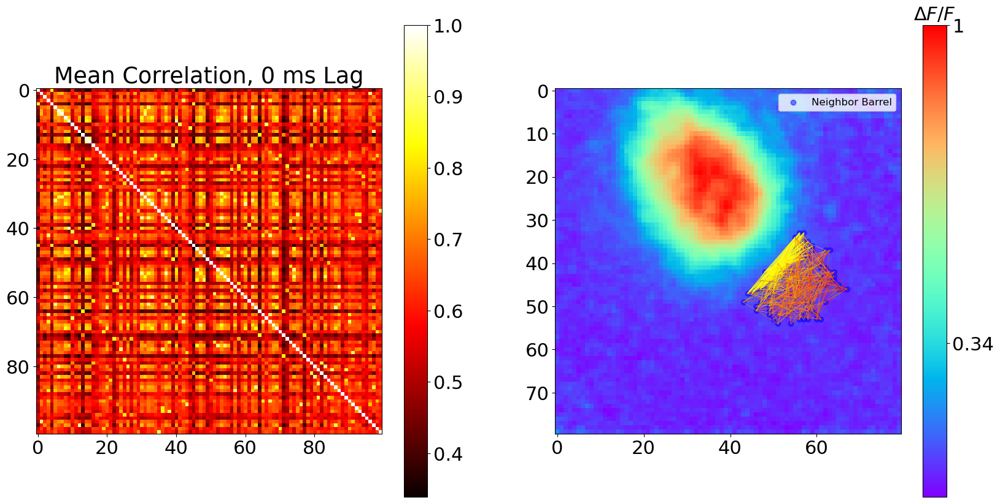

Date:  2/5/2025 Slice:  2 Location:  2
Avg corr shape:  (26, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.9143357241783642


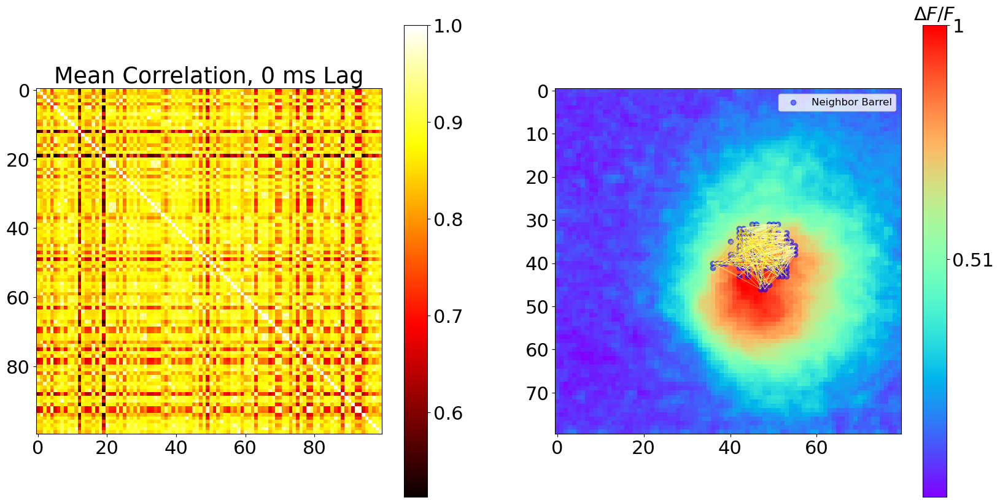

Date:  4/16/2025 Slice:  1 Location:  1
Avg corr shape:  (26, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.8553517577127914


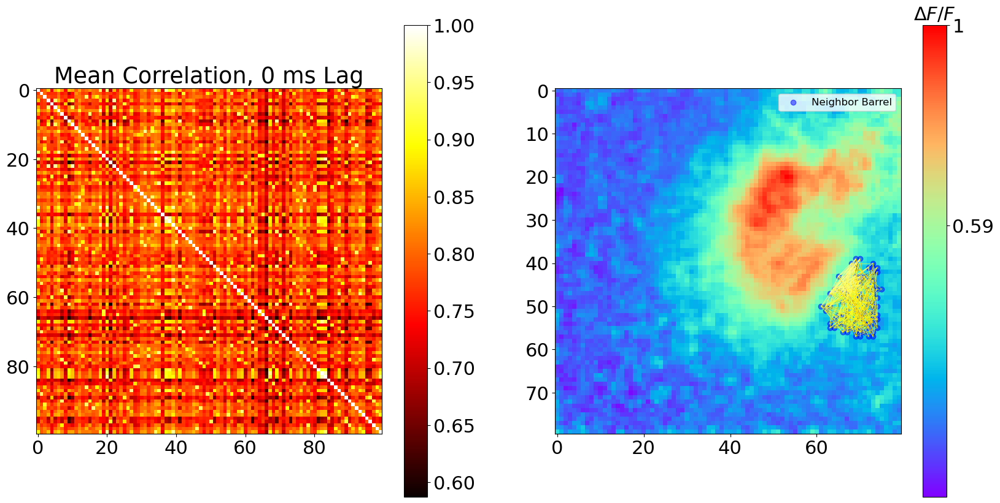

Date:  4/16/2025 Slice:  2 Location:  2
Avg corr shape:  (12, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.8531978954686148


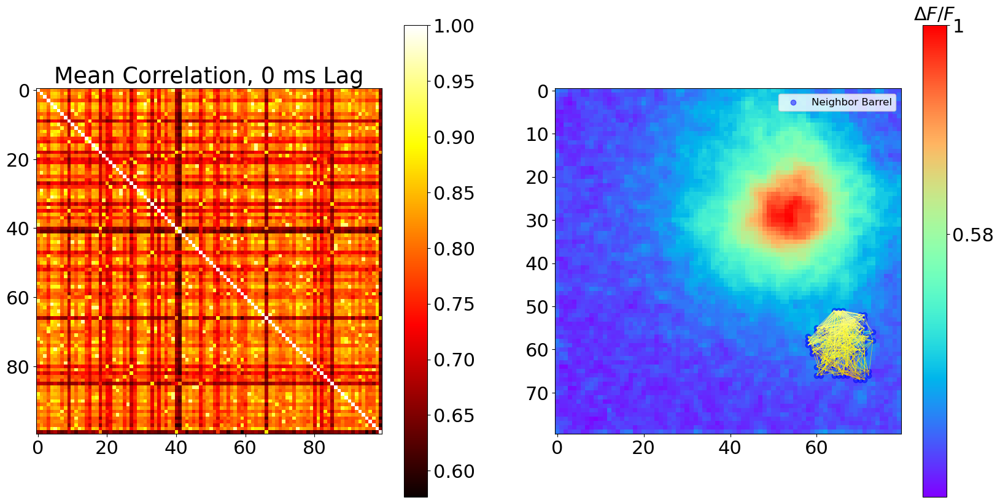

No corr_matrices_by_slice for this date/slice/location
Date:  4/9/2025 Slice:  1 Location:  2
Avg corr shape:  (16, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.8691125867040119


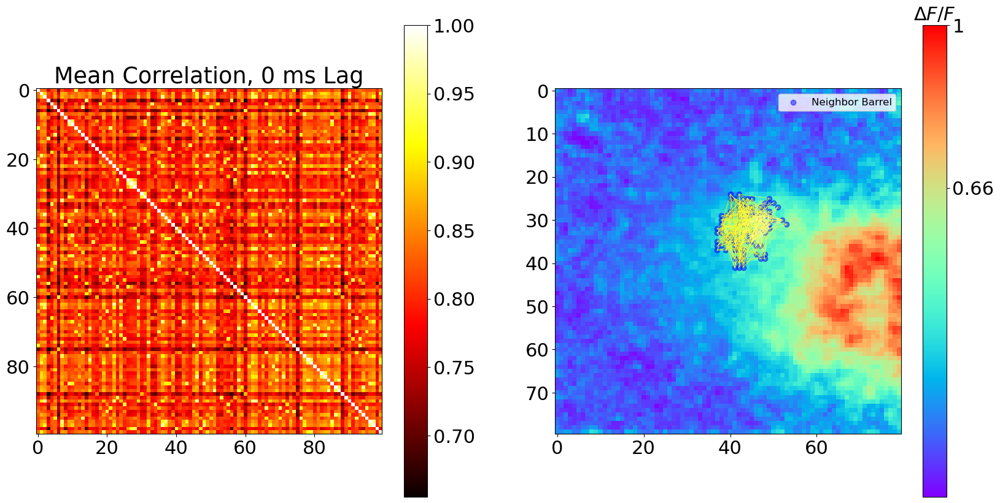

Date:  4/9/2025 Slice:  2 Location:  2
Avg corr shape:  (24, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.8800733885747438


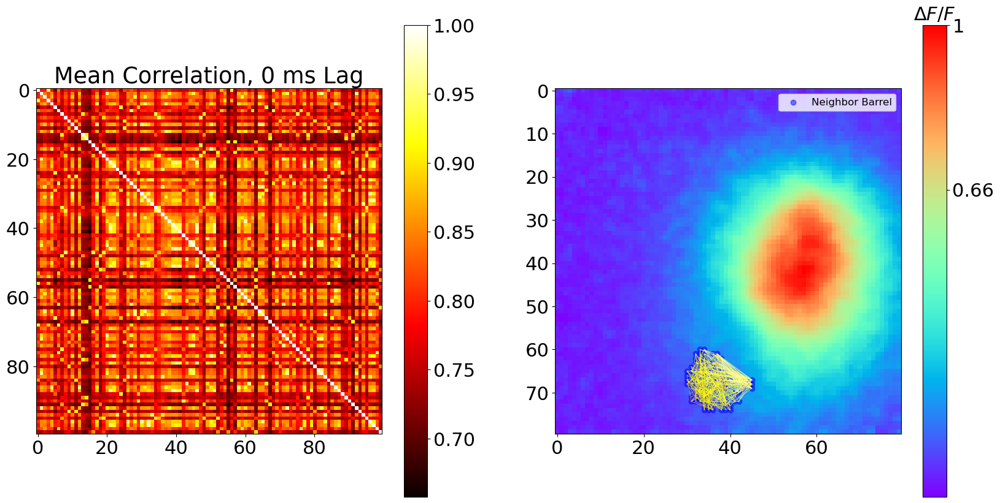

Date:  4/9/2025 Slice:  3 Location:  2
Avg corr shape:  (26, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.903932888929134


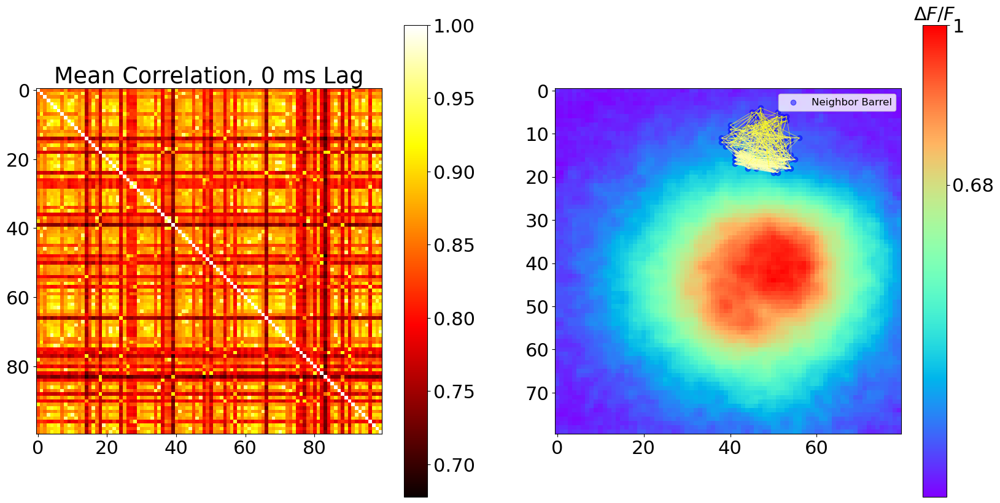

Date:  4/9/2025 Slice:  4 Location:  2
Avg corr shape:  (26, 100, 100)
Distance cutoff: 20, Correlation cutoff: 0.820540756937213


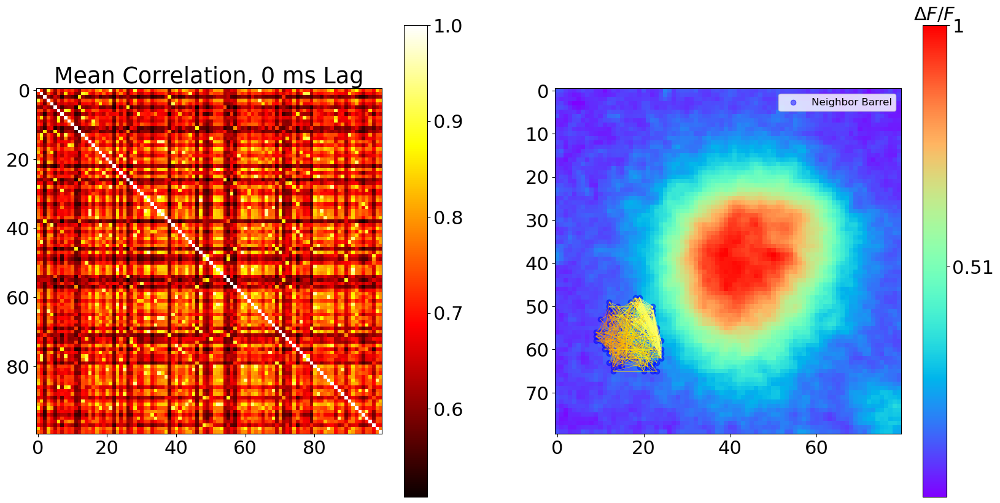

In [24]:
# Plot the correlation distances but
# now with the cutoffs applied
distance_vs_corr_cutoff = {}
node_degree_dist_cutoff = {}

for date in ppr_df['Date'].unique():
    date_df = ppr_df[ppr_df['Date'] == date]
    if date not in corr_matrices_by_slice:
        print("No corr_matrices_by_slice for this date")
        continue
    for slic in date_df['Slice'].unique():
        slic_df = date_df[date_df['Slice'] == slic]
        for loc in slic_df['Location'].unique():
            loc_df = slic_df[slic_df['Location'] == loc]
            slic_loc_id = f"{slic}_{loc}"
            if slic_loc_id not in corr_matrices_by_slice[date]:
                print("No corr_matrices_by_slice for this date/slice/location")
                continue
            if date not in distance_vs_corr_cutoff:
                distance_vs_corr_cutoff[date] = {}
            if slic_loc_id not in distance_vs_corr_cutoff[date]:
                distance_vs_corr_cutoff[date][slic_loc_id] =  {'distance': [], 'corr': []}
            if date not in node_degree_dist_cutoff:
                node_degree_dist_cutoff[date] = {}
            if slic_loc_id not in node_degree_dist_cutoff[date]:
                node_degree_dist_cutoff[date][slic_loc_id] = {0: {},
                                                               1: {}}

            print("Date: ", date, "Slice: ", slic, "Location: ", loc)

            ppr_barrel_subset = ppr_barrel_df[(ppr_barrel_df['Date'] == date) &
                    (ppr_barrel_df['Slice'] == slic) &
                    (ppr_barrel_df['Location'] == loc)]
            if len(ppr_barrel_subset) == 0:
                print("No ppr_barrel_df for this date/slice/location")
                continue
            
            # look up the amp_array in ppr_barrel_df
            amp_array = ppr_barrel_subset['amp_array'].values[0]
            amp_array = read_array_file(amp_array)

            # get roi_file for this recording
            roi_file_barrel_1 = loc_df[loc_df['ROI_Set'].str.contains('rand_1')]['ROI_File'].values[0]
            
            # read the roi file (barrel 1)
            rois_1 = ROIFileReader(roi_file_barrel_1).get_roi_list()
            rois_1 = [LaminarROI(r, input_diode_numbers=True)
                    for r in rois_1]
            rois_points1 = [roi.get_points() for roi in rois_1]
            
            # now get the correlation matrix for this date/slice/location
            avg_corr = []
            for ipi in corr_matrices_by_slice[date][slic_loc_id].keys():
                for control_or_ppr_type in corr_matrices_by_slice[date][slic_loc_id][ipi].keys():
                    try:
                        avg_corr.append(corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][optimal_lag])
                    except IndexError:
                        print("IndexError: ", ipi, control_or_ppr_type, optimal_lag, i_slice)
                        print('len(corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][optimal_lag]): ',
                            len(corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][optimal_lag]))
                        continue
            avg_corr = np.array([ac[1] for ac in avg_corr])
            avg_corr = np.array(avg_corr).reshape(-1, 100, 100)
            print("Avg corr shape: ", avg_corr.shape)
            avg_corr = np.mean(avg_corr, axis=0)
            
            if avg_corr.shape[0] < 10:
                print("Avg corr shape is too small: ", avg_corr.shape)
                continue

            # plot the amp_array and overlay the ROIs. 2 subplots
            fig, ax = plt.subplots(1, 2, figsize=(20, 10))
            ax[1].imshow(amp_array, cmap='rainbow', interpolation='nearest')

            # colorbar for the amp_array
            cbar = plt.colorbar(ax[1].imshow(amp_array, cmap='rainbow',
                     interpolation='nearest', vmin=np.min(amp_array), 
                     vmax=np.max(amp_array)), ax=ax[1])

            cbar.set_ticks([np.min(amp_array), np.max(amp_array)])
            cbar.set_ticklabels([str(round(np.min(amp_array), 2)), 
                                str(round(np.max(amp_array), 2))])
            cbar.ax.set_title(r'$\Delta F/F$', fontsize=22)            
            
            # plot the ROIs
            for roi in rois_points1:
                ax[1].scatter(roi[0][0], roi[0][1], color='blue', alpha=0.5, label='Neighbor Barrel')
            
            handles = [h for i, h in enumerate(ax[1].get_legend_handles_labels()[0]) if i % 2 == 0]
            labels = [l for i, l in enumerate(ax[1].get_legend_handles_labels()[1]) if i % 2 == 0]
            ax[1].legend(handles=[handles[0]], labels=[labels[0]],
                         loc='upper right', fontsize=12)

            # percentile threshold the avg_corr matrix to remove low values
            subset_df = cutoff_df[(cutoff_df['Date'] == date) &
                                    (cutoff_df['Slice_Loc'] == slic_loc_id)]
            if subset_df.empty:
                print(f"No cutoff values for date {date} and slice/location {slic}")
                continue
            dist_cutoff = subset_df['Distance_cutoff'].values[0]

            # perecentile cutoff for the correlation values that are above the distance cutoff
            percentile_threshold = 0.9
            corr_cutoff = np.percentile(avg_corr, percentile_threshold * 100)
            print(f"Distance cutoff: {dist_cutoff}, Correlation cutoff: {corr_cutoff}")

            for i_1, roi_1 in enumerate(rois_points1):
                for i_2 in range(i_1 + 1, len(rois_points1)):
                    roi_2 = rois_points1[i_2]

                    corr = avg_corr[i_1, i_2]
                    x0, y0 = roi_1[0][0], roi_1[0][1]
                    x1, y1 = roi_2[0][0], roi_2[0][1]

                    # track these nodes' degrees (weighted by correlation value)
                    key_roi1 = f"{x0}_{y0}"

                    # track the distribution of edge distances and correlation values
                    px_dist = np.sqrt((x0 - x1) ** 2 + (y0 - y1) ** 2)

                    if px_dist * um_per_px < dist_cutoff:
                        continue
                    if corr < corr_cutoff:
                        if random.random() > 0.06:
                            continue

                    # sum that node's row in the avg_corr matrix
                    node_degree_dist_cutoff[date][slic_loc_id][1][key_roi1] = np.mean(list(avg_corr[i_1, :i_1]) + list(avg_corr[i_1, i_1 + 1:]))

                    # track the distribution of edge distances and correlation values
                    distance_vs_corr_cutoff[date][slic_loc_id]['distance'].append(px_dist)
                    distance_vs_corr_cutoff[date][slic_loc_id]['corr'].append(corr)
                    
                    color = plt.cm.hot(corr)
                    # plot the line between the two ROIs with outline on line
                    ax[1].plot([x0, x1], [y0, y1], color=color, linewidth=0.4)

            # plot the avg corr matrix on the left
            ax[0].imshow(avg_corr, cmap='hot', interpolation='nearest',
                    vmin=np.min(avg_corr), vmax=1)
            ax[0].set_title(f"Mean Correlation, {optimal_lag} ms Lag")

            plt.colorbar(ax[0].imshow(avg_corr, cmap='hot', interpolation='nearest',
                    vmin=np.min(avg_corr), vmax=1), ax=ax[0])
            # label colorbar with correlation values
            cbar.set_ticks([np.min(avg_corr), 1])
            cbar.set_ticklabels([str(round(np.min(avg_corr), 2)), 
                                str(1)])
            formatted_date = date.replace('/', '-')
            plt.savefig(f"{output_fig_dir}/{formatted_date}_{slic_loc_id}_"
                        f"static_fc_cutoff_corr-rois_intrabarrel.png")
            plt.show()



Date: 12/23/2024, Slice/Location: 1_3
[0.8754296647949662, 0.8502512276569135, 0.8721606614739582, 0.8833589613930302, 0.9000537743599932, 0.8648207386376245, 0.8879960111725191, 0.8741316273669452, 0.8937783436493127, 0.8243023288546703, 0.883764560293383, 0.7909108396926555, 0.8899917756654784, 0.8195088886205447, 0.8675739330934189, 0.8950851325774596, 0.8876070875305975, 0.8433813555826919, 0.8926791935190362, 0.8594497305027544, 0.8782906607154872, 0.8689792106509387, 0.8838010497209899, 0.8736126039009097, 0.8955467910980546, 0.8302177028294123, 0.8288023822838819, 0.8914490822352441, 0.8685352676529637, 0.8847385814283876, 0.8483220912640873, 0.8851959565035735, 0.8704192409912949, 0.8396331392125862, 0.8251440928647612, 0.8407194376527821, 0.839630113455902, 0.8704687896094366, 0.8419642084613757, 0.8078937098713421, 0.8838833886318589, 0.8182016871951241, 0.8875767299896054, 0.8717666586111097, 0.8833900499184154, 0.872997422431555, 0.8398986256422886, 0.8231320356696105, 0.88

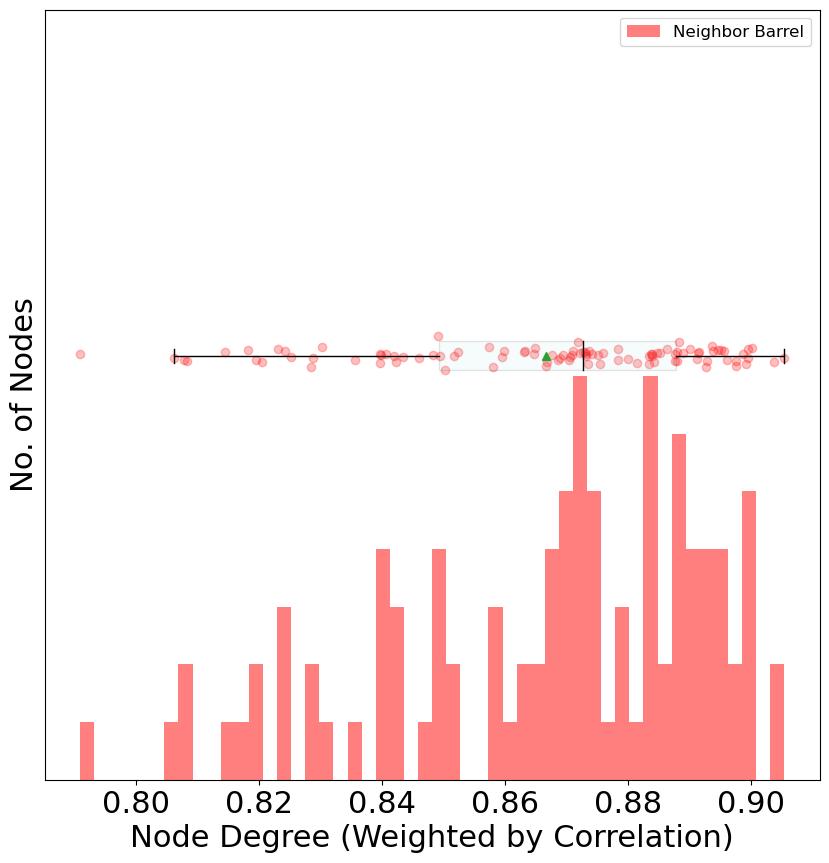

Date: 12/23/2024, Slice/Location: 2_2
[0.5091905934223047, 0.49742513006613026, 0.5074904781716756, 0.47541248821934995, 0.5346789740840073, 0.533365625991018, 0.5036963470109475, 0.5326506680330751, 0.511196433421614, 0.53211908960484, 0.5628779519573925, 0.5558924628060348, 0.5340557399604838, 0.46036708259032555, 0.5415506617100223, 0.5222641031439552, 0.550523539363926, 0.5561216798561274, 0.5235443611570942, 0.5497646513318154, 0.567749519524444, 0.5511741417566103, 0.5282099119331954, 0.5543285429994307, 0.475861255027536, 0.532476604711107, 0.5686500350564959, 0.5728698566237831, 0.5304832751111419, 0.49104096638760814, 0.41684647512762113, 0.5159424544819033, 0.5144455316964446, 0.5384996064931038, 0.5213216266596831, 0.5067559324037779, 0.5287731083440209, 0.5486895428569767, 0.5395311735940399, 0.5480856972876242, 0.5526645849946726, 0.5235175194044743, 0.5541378902833086, 0.5192179588989564, 0.5380742015584442, 0.5159220678044534, 0.507670145180457, 0.5312157154808573, 0.475

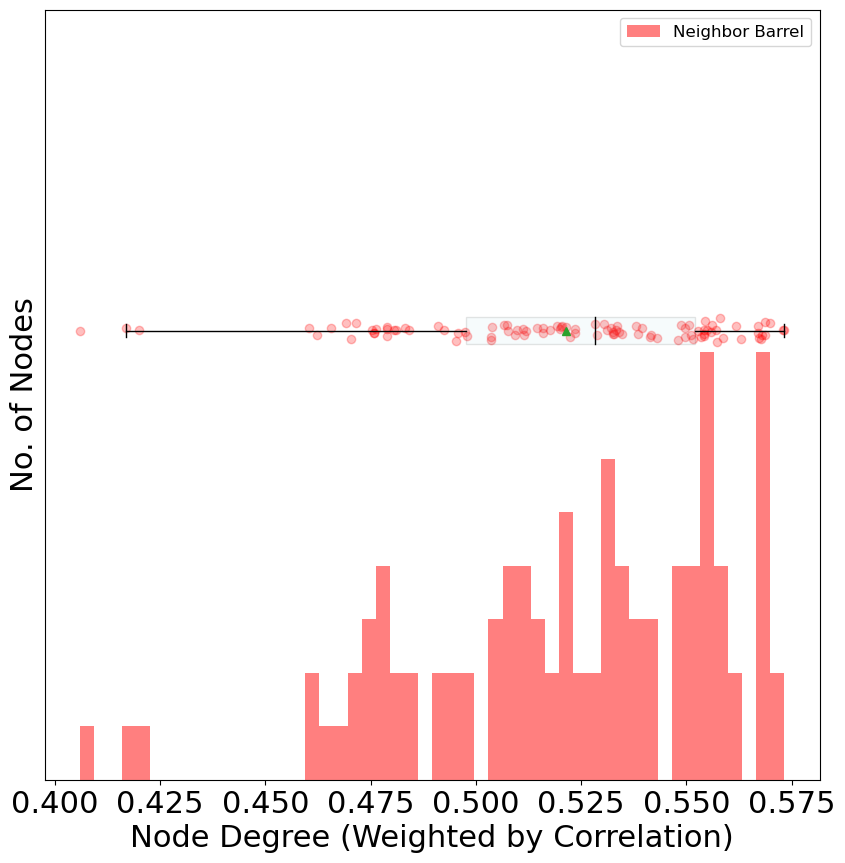

Date: 1/15/2025, Slice/Location: 1_3
[0.2796130192776784, 0.3089714863763997, 0.31245910775055624, 0.3082423619418653, 0.31441969291063454, 0.30712588485798087, 0.31777003481798943, 0.2425066960612102, 0.3157939238225802, 0.3064008664197262, 0.24610050935756947, 0.28397999483966263, 0.30447719268271145, 0.2812091450893174, 0.3071919590115095, 0.3410234592255919, 0.24640957411408743, 0.28835291573153876, 0.3073952398175599, 0.252207369369903, 0.3435789220619499, 0.29935988186683504, 0.3057166306946299, 0.29185446869608106, 0.2850072167700262, 0.3290200202256679, 0.3542647458366536, 0.294095701592283, 0.31049463825862594, 0.3210709957415025, 0.2550479625212433, 0.3495602237777652, 0.32184001689547914, 0.2999892039203478, 0.27280533203117935, 0.31346987968902507, 0.3165574367945472, 0.31486625523942835, 0.3219729389228837, 0.32755889423664, 0.2822291470566586, 0.31684580403629253, 0.3560291099470283, 0.29954142732403144, 0.2563589450201627, 0.27814913686373666, 0.30258841531515335, 0.2929

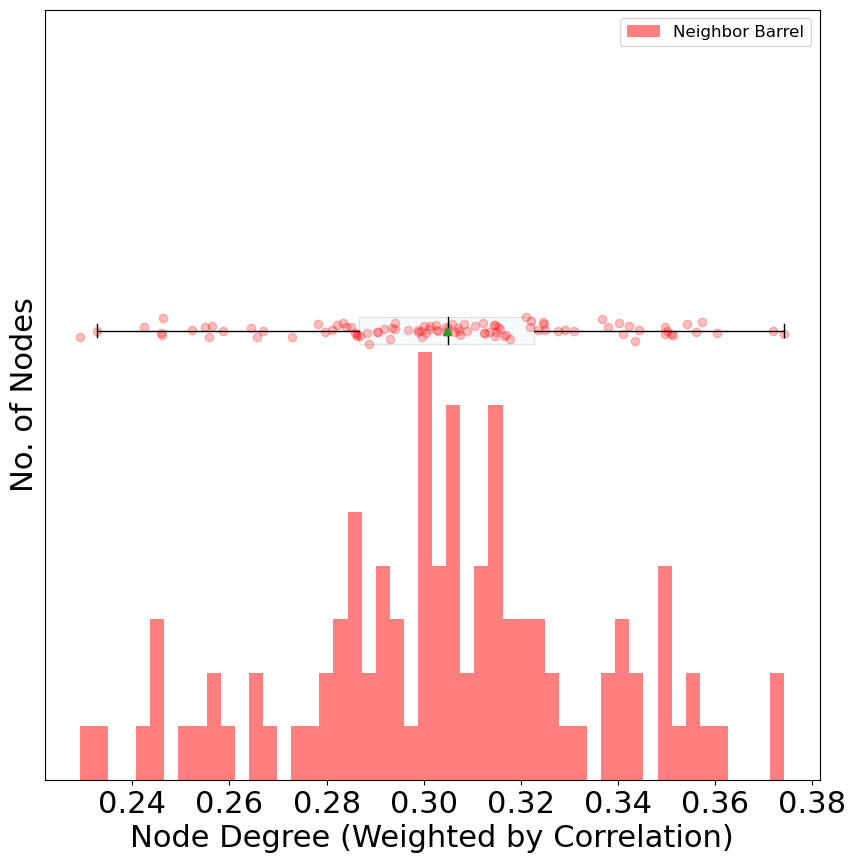

Date: 1/15/2025, Slice/Location: 3_2
[0.4604494540489346, 0.4367379399819908, 0.3827608461883591, 0.42084627791114076, 0.4239574413314518, 0.4695553366438407, 0.43153241137017523, 0.4639940896389203, 0.4359077122489728, 0.48143544565512214, 0.4508849556173939, 0.4480827551120558, 0.4509312292074302, 0.46448717304294396, 0.45229314287871497, 0.4224013541579564, 0.4610815628073679, 0.47447878328485893, 0.4207086615556973, 0.46378377332343584, 0.444831312757043, 0.4013053615806044, 0.38591870709028936, 0.4461882244975738, 0.4276027797487335, 0.43436157156124555, 0.4652015895001469, 0.43481148664441344, 0.4424503386211834, 0.4598927712906382, 0.47409094679655983, 0.4159040108165115, 0.4417795609511808, 0.4400740246977564, 0.4491297978201017, 0.4766787042225401, 0.4271976688125656, 0.39743183545192606, 0.43874606803622646, 0.4125083264184001, 0.4709648896410603, 0.47057514441099046, 0.38727090926925767, 0.48337225978408643, 0.4428201365563191, 0.4663571590231412, 0.4263956636298243, 0.45401

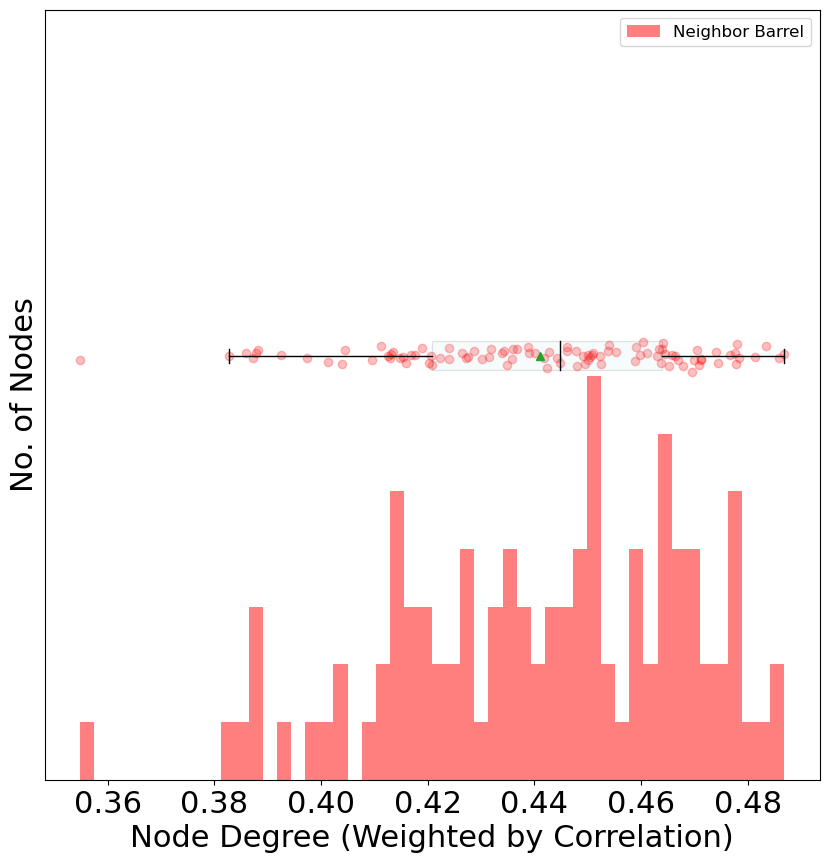

Date: 1/22/2025, Slice/Location: 1_2
[0.5427701690199872, 0.46376351266960475, 0.6277102777599579, 0.5949624125481195, 0.555197501839186, 0.49084260553680087, 0.5481316889883644, 0.49454453348745336, 0.5861769817658393, 0.508083116786737, 0.5296573022577307, 0.5307552076065281, 0.5364012622309021, 0.6154280274668004, 0.5338828637981315, 0.5763121684423166, 0.5673233587920216, 0.6029586859691366, 0.4886235453838791, 0.5645865026389492, 0.6304589404770475, 0.5316415014090045, 0.5346877267935335, 0.5778902359240529, 0.5804921176745061, 0.5546077257897012, 0.5030481163130205, 0.5442000619178179, 0.5014599379588531, 0.5965768898390647, 0.5444405997439112, 0.5962615666369885, 0.6375158950058041, 0.588553081495142, 0.5036232374289115, 0.5647941687627785, 0.496886882566468, 0.5490404361745949, 0.5726867643316906, 0.5640125363613108, 0.5359442417659369, 0.5064868055897617, 0.6138433228094482, 0.614148309976032, 0.5199948300277328, 0.6217084307920452, 0.6010905635752815, 0.6187206915418918, 0.54

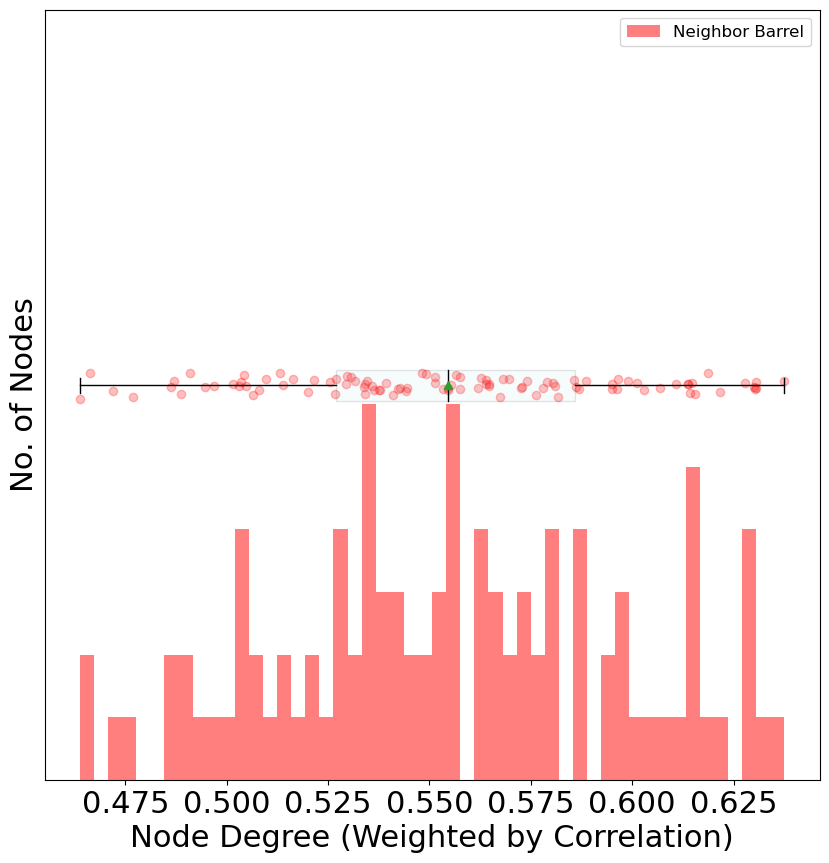

Date: 1/22/2025, Slice/Location: 3_2
[0.34198456696965196, 0.38407271330141735, 0.3543521920741051, 0.3462322169531106, 0.3140596540954273, 0.3583922012526569, 0.15995897347808655, 0.1864270804285488, 0.36747631344324283, 0.36439954656579454, 0.31469709100569354, 0.33296272929582826, 0.3099176880628736, 0.20010881784706464, 0.31385617988089065, 0.19215559661062356, 0.3774787877884241, 0.33567869216672336, 0.21810533857944306, 0.3892646691467927, 0.24816070409838722, 0.3241598558326242, 0.3433146353151083, 0.34151984573127625, 0.3427105007449371, 0.2524246877994126, 0.36060359010291565, 0.34565028043625096, 0.3524761888975017, 0.23996435133115251, 0.35407870707983097, 0.16796413654440903, 0.33664784693802885, 0.3424626568205301, 0.3531458254247576, 0.36544430310096343, 0.344622985336361, 0.3524034328864981, 0.19743143694912516, 0.2955753563056129, 0.3543495223404805, 0.34644732025906727, 0.37564465329244834, 0.2856878702288403, 0.3381700414400642, 0.33945434147993414, 0.2309389261977176

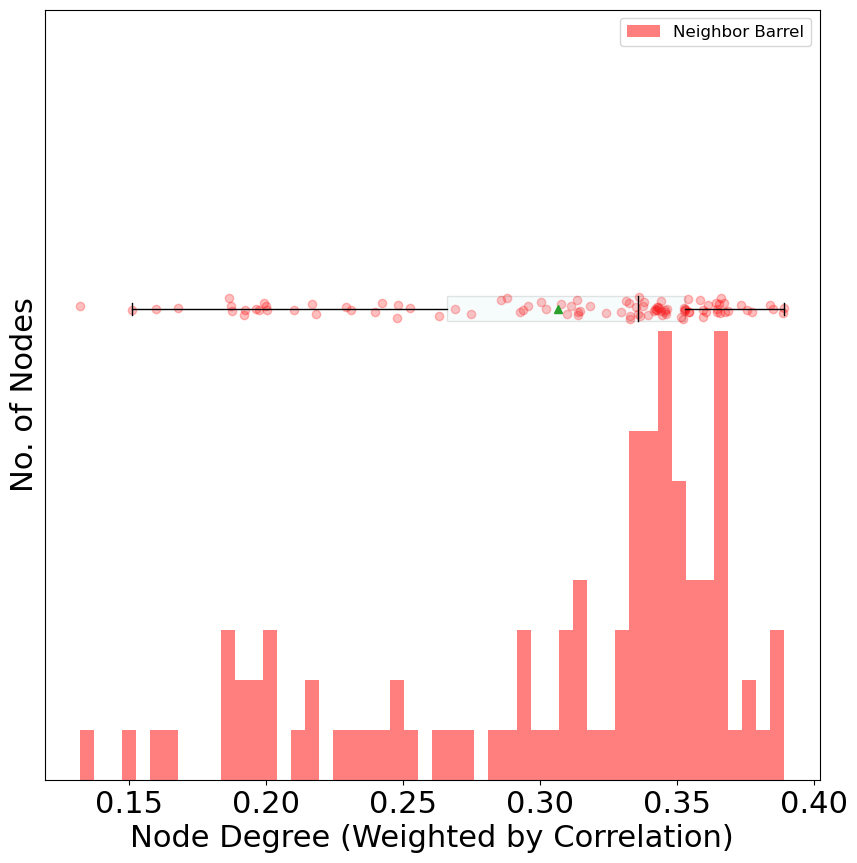

Date: 2/5/2025, Slice/Location: 1_3
[0.49195089470882836, 0.6307391191253617, 0.5944193646496676, 0.6473354304473307, 0.5090554936482257, 0.6650101473867381, 0.6484997312758918, 0.6333860194838488, 0.6423082489456697, 0.6041462834960402, 0.5826759749423804, 0.5757443030725703, 0.6050624944733244, 0.4737827267356188, 0.6170636162804404, 0.6034815899641114, 0.5471474470454282, 0.5559873814204456, 0.6107054676076596, 0.6241707446439121, 0.652488519132207, 0.5931789150923753, 0.500006098280813, 0.5866314679946595, 0.6561701715887635, 0.5796938888862105, 0.6501187561838847, 0.5416666379021832, 0.6312633584095797, 0.5657736298822742, 0.6483861885043811, 0.62462183237061, 0.6659042134111041, 0.6507287584487863, 0.6272721701525724, 0.5782315490091604, 0.625552147741985, 0.6545877357719408, 0.6233710585172991, 0.5297972397076754, 0.6150322348463844, 0.584630702727071, 0.6449222530388696, 0.6249137936243424, 0.5462086340350362, 0.4983963345513819, 0.5957780426175283, 0.6579302729415522, 0.608551

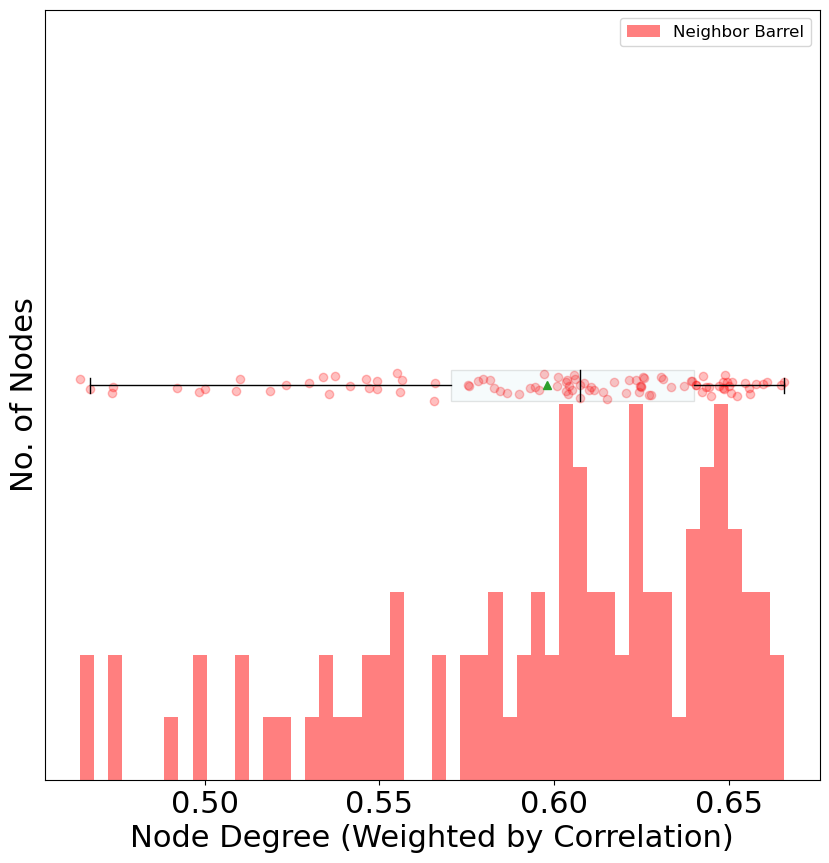

Date: 2/5/2025, Slice/Location: 2_2
[0.8208762544645809, 0.8185198299986844, 0.861064928582463, 0.8436217519723295, 0.8449355939248131, 0.8198140721530717, 0.8454603843230118, 0.8849463066901272, 0.8396996897283534, 0.8711376434694831, 0.8588282104405208, 0.8778860874907164, 0.7134945538149345, 0.8539361224344604, 0.8191701342977482, 0.8233829430806671, 0.8524328366460615, 0.828390058029214, 0.8835976803712493, 0.6921811340322805, 0.8753305353753463, 0.848822130664827, 0.844353399594939, 0.8603506899156422, 0.8441305534592697, 0.8388283979054887, 0.8675094890066544, 0.875866114222217, 0.8731889801801156, 0.8695042736258317, 0.8534820713326452, 0.8632628736783432, 0.8405768812282672, 0.8458250790763834, 0.8603122915129967, 0.8509223068003388, 0.8558386235696032, 0.8441202536613585, 0.8728901788153579, 0.8678988345226427, 0.8813179772989389, 0.8643727179190942, 0.8742711371891716, 0.8493954327392953, 0.8470177991218365, 0.8648948282689529, 0.8818387497456867, 0.8281532381179928, 0.865371

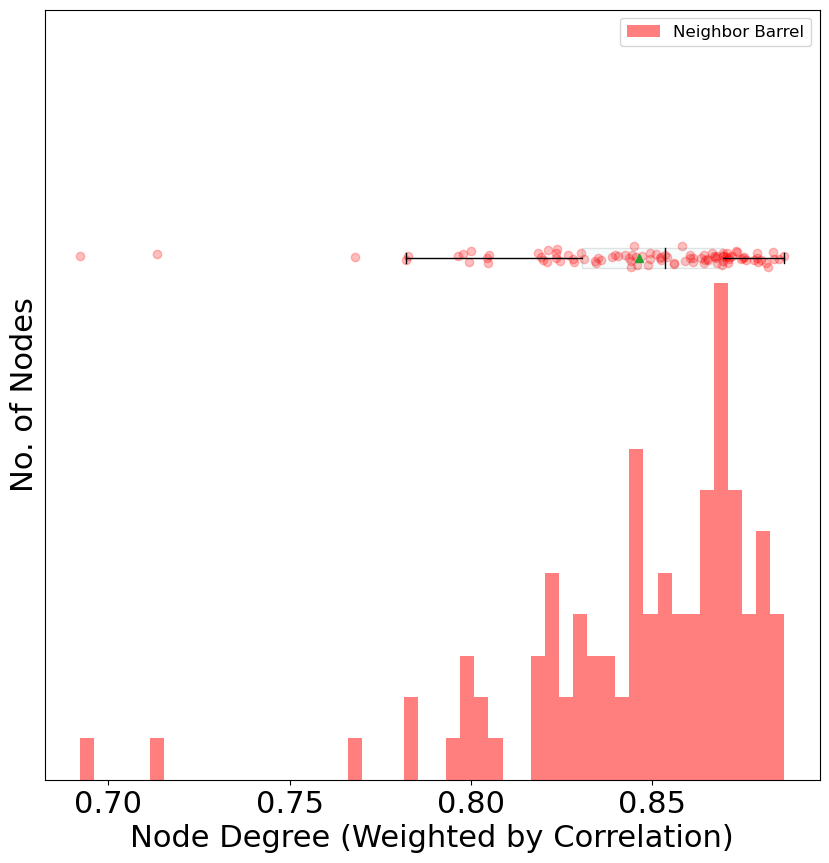

Date: 4/16/2025, Slice/Location: 1_1
[0.8089602715192749, 0.7792621446504288, 0.790211301053398, 0.7959878023475333, 0.7479764802682667, 0.7942845263392317, 0.8183732874598347, 0.7735808554730333, 0.7559215145409268, 0.7569477509497147, 0.7777184452427514, 0.7865932324866933, 0.8163302232312339, 0.7877106803176522, 0.7877864225920226, 0.7647986810090361, 0.7888812544129938, 0.7884056420520251, 0.8217001405500404, 0.7429621656107015, 0.8127322256621872, 0.7276739012050689, 0.7870795887031257, 0.7639166783975241, 0.8023360932041828, 0.7523585285643517, 0.7792080231644867, 0.8028728218581056, 0.7649672132277987, 0.7734037870896067, 0.8052411534535641, 0.8095885154115299, 0.7817681552526744, 0.8002006717686938, 0.8189450635891582, 0.8073177758841708, 0.7417243059935458, 0.8008373301497491, 0.783952799395456, 0.8254331893528934, 0.7996934630086324, 0.7682587729148016, 0.7905194989801837, 0.7863805232137798, 0.7974815355813034, 0.8118238628450386, 0.7822754786029913, 0.7761091702942832, 0.75

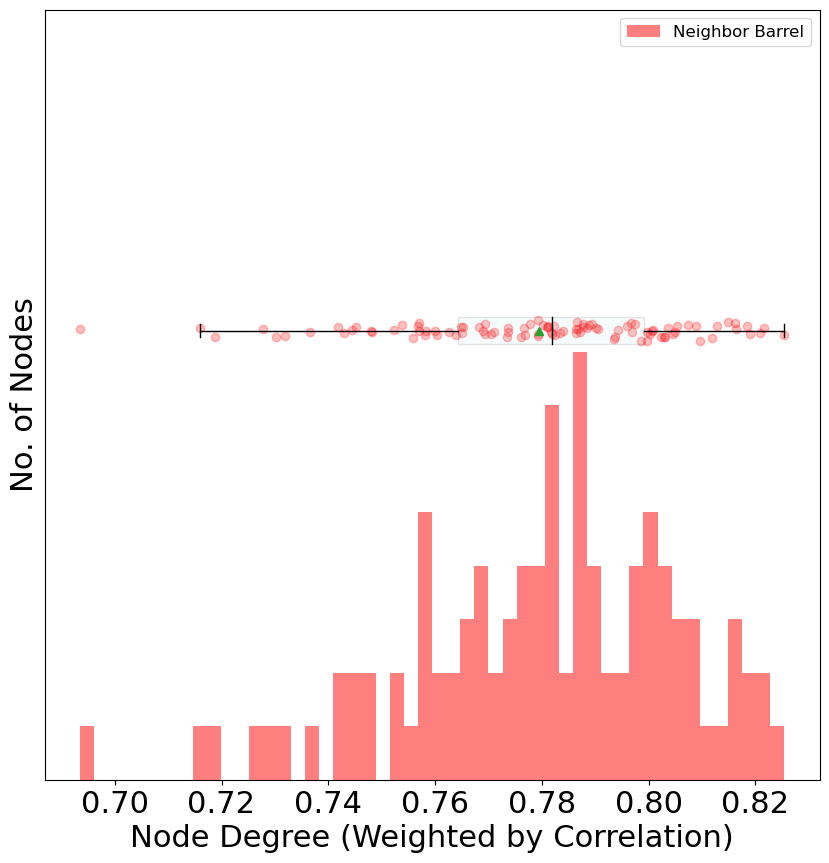

Date: 4/16/2025, Slice/Location: 2_2
[0.7917099673553407, 0.8115729281246763, 0.7990007155655908, 0.7665655115429381, 0.8254466356086965, 0.8253934712139017, 0.814254818365396, 0.7746657989343025, 0.7927041212834066, 0.696441721582977, 0.8040874346687081, 0.7834925745856112, 0.8115365683172749, 0.8038780651947628, 0.7603075130402659, 0.7345377261642664, 0.8023347326306002, 0.8033074293494338, 0.7093703987046897, 0.7786659526451561, 0.7246474911895294, 0.7247456508596558, 0.7953660704594125, 0.7957667912786873, 0.8096087339585271, 0.7600548597426795, 0.7918717585625084, 0.7028468857296539, 0.7520774234865153, 0.8102418999243761, 0.81485478862598, 0.8188087893256478, 0.7852624299000204, 0.7083033916189244, 0.7876018856673618, 0.7261363262619203, 0.7988741033285813, 0.7488045587438132, 0.78988336210794, 0.7951992995875958, 0.6742896733846816, 0.6440188843145656, 0.8092574965127055, 0.7857493582891417, 0.8108069334464335, 0.7804263263308238, 0.7953196281421046, 0.7305992129375396, 0.768682

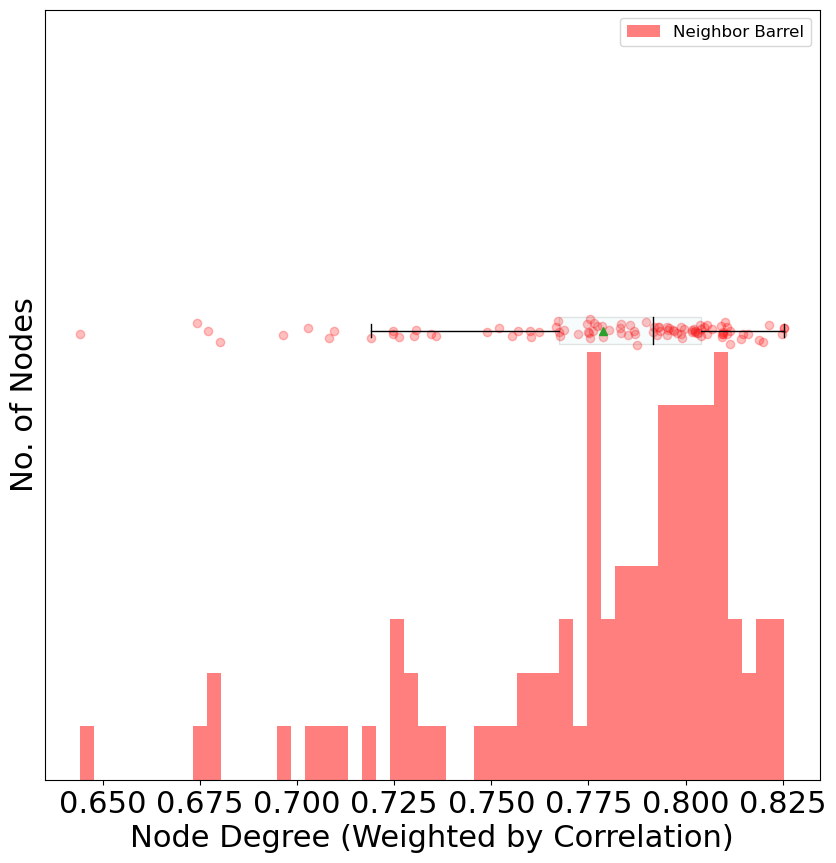

Date: 4/9/2025, Slice/Location: 1_2
[0.8140058806099123, 0.8396969148830159, 0.8467005212465555, 0.7655336323165628, 0.8021019769343285, 0.8310793741682981, 0.7467887920481497, 0.8403540391484493, 0.7930199532529096, 0.8089022907259953, 0.8162408641109089, 0.8213242304051489, 0.8117336187876054, 0.8256690880219913, 0.7798130955200129, 0.827080592715821, 0.7950099693478014, 0.7893104864666195, 0.8066309133838155, 0.8295682361127393, 0.8062694364165879, 0.8109593845306379, 0.8448824006149865, 0.7933403709853347, 0.8270699758337718, 0.7907725665209725, 0.7941364058727804, 0.8030230827169783, 0.8051811148017535, 0.8252211283723315, 0.7843615327473236, 0.7943555272952508, 0.8404250486833463, 0.7825491148849212, 0.7826242917347298, 0.8193019159939456, 0.8398208816323922, 0.8243940792250923, 0.8007343637017347, 0.8133556945395557, 0.7806423088198606, 0.7889547667461381, 0.8207760032137369, 0.8077130588536254, 0.7883101212326806, 0.8194066949420483, 0.8413935766443069, 0.7956872017269083, 0.83

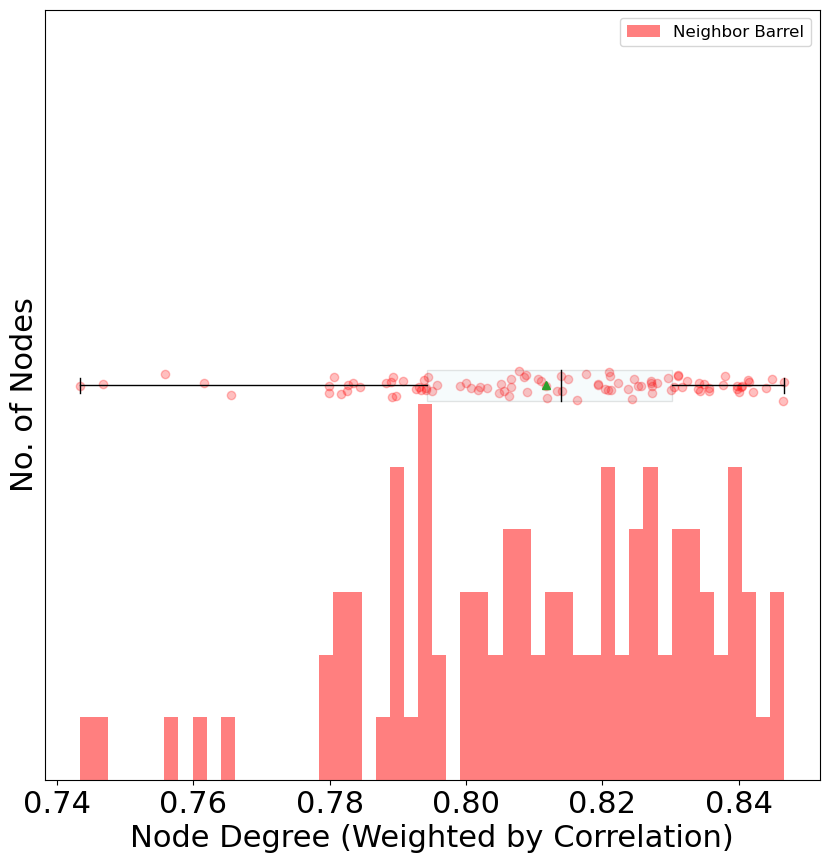

Date: 4/9/2025, Slice/Location: 2_2
[0.7815707128572332, 0.817201901507793, 0.8222156749197574, 0.7946723972486208, 0.8235366596413567, 0.7670738950230562, 0.7901077984007383, 0.7664892850453959, 0.8048584735679383, 0.7677770129544276, 0.8250203728795091, 0.7490966954624138, 0.8253713329452382, 0.7508438212293675, 0.7361388664709619, 0.7225788128090478, 0.7813624405891821, 0.8271601460694497, 0.747794673784042, 0.7902824309604768, 0.8213399087454138, 0.825133325306331, 0.8249086132702622, 0.8182008064399015, 0.7663112095991689, 0.7632687909939492, 0.8318573307264776, 0.8011326139543209, 0.8280077537003617, 0.7820574413566769, 0.8232443742813818, 0.824525770820102, 0.8272022940825474, 0.8262059768504556, 0.7794187736869728, 0.7991136257556494, 0.8253838292320897, 0.8222943384054909, 0.8220947172556153, 0.8201702693365136, 0.8239997151158335, 0.8072638325037875, 0.7853831676014978, 0.8073393828121885, 0.8083425541173019, 0.8171662567812648, 0.8224488128685541, 0.797628588423812, 0.752586

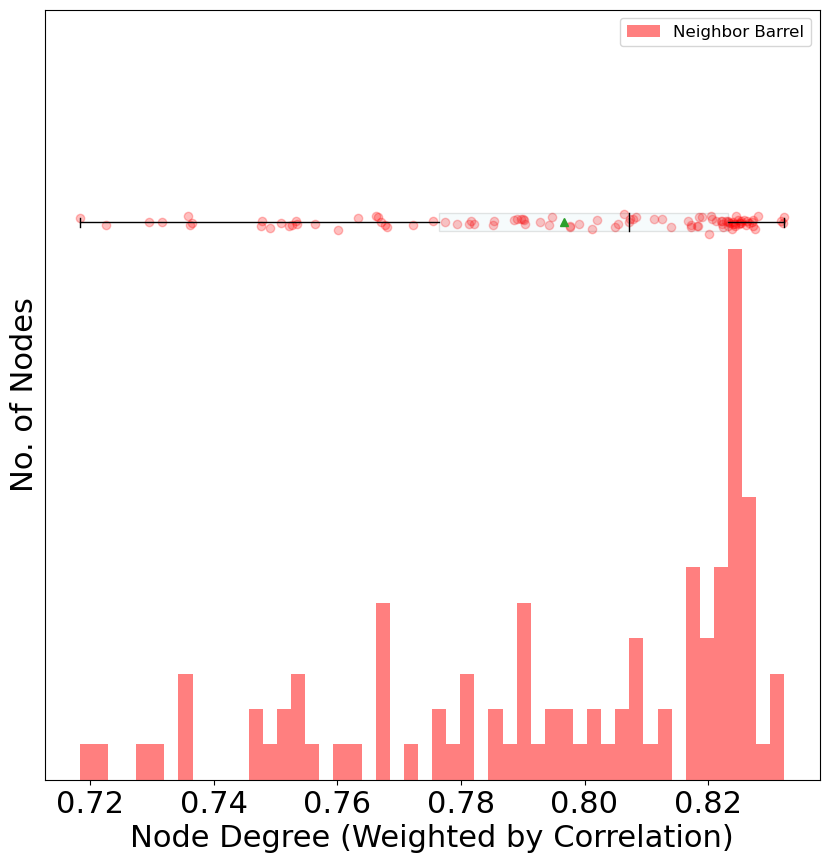

Date: 4/9/2025, Slice/Location: 3_2
[0.8304749223464168, 0.856758462630959, 0.841861518571645, 0.8568736424895435, 0.8625538141897772, 0.8613714490732062, 0.8665238855397642, 0.8401655517640598, 0.8609538384012754, 0.8572092192117508, 0.8604675430999715, 0.8481048061557199, 0.8456337257438031, 0.8573876880256059, 0.7649229342009314, 0.8187331601269746, 0.8554497308751482, 0.8353630845005681, 0.7760892362055531, 0.8574083296402905, 0.8495215797613039, 0.8583528774368719, 0.8654391131384387, 0.8571438395354011, 0.7796645730844906, 0.85946387681928, 0.8070403020948284, 0.8093484767368613, 0.8063723055355314, 0.8585253708827014, 0.8511654198969302, 0.8574649016909948, 0.8576657240249255, 0.8587643011876697, 0.8239622520879962, 0.858637676255085, 0.7857427083426344, 0.829298121537121, 0.8222888006571706, 0.7437821273836177, 0.8499030159591267, 0.8524158342060796, 0.8558773573039614, 0.8556648660726713, 0.8601422055142728, 0.8204372002741128, 0.8479170723525767, 0.8525727188139328, 0.7963315

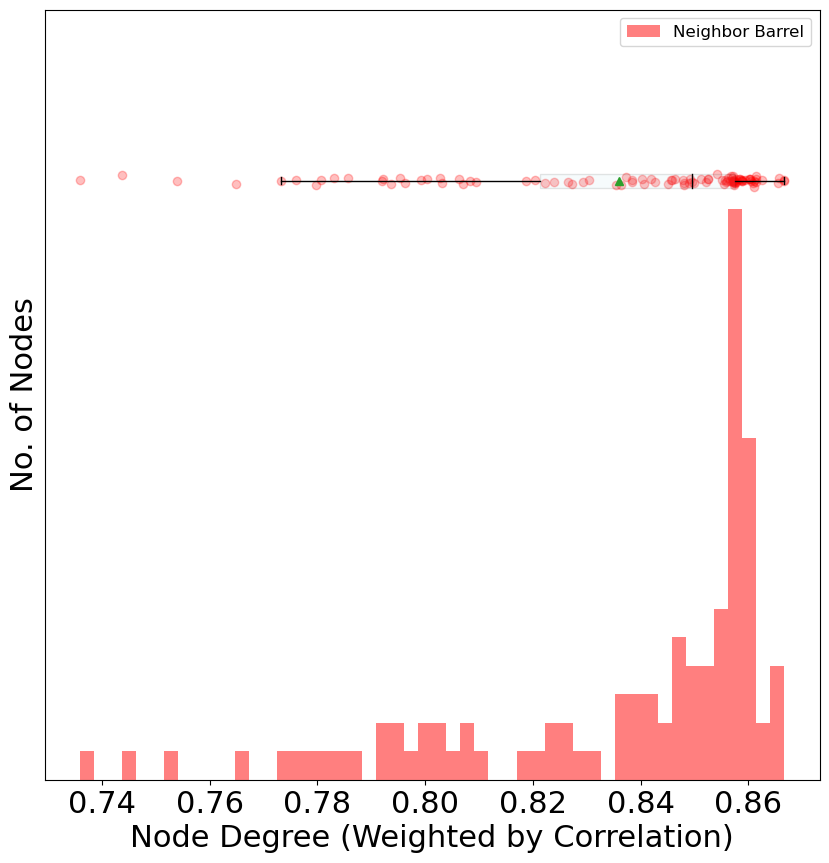

Date: 4/9/2025, Slice/Location: 4_2
[0.7406749306579048, 0.6991563260302017, 0.5946824987908249, 0.7404132284918334, 0.6952620325708573, 0.6123731634706098, 0.692739840776265, 0.6532896790789898, 0.7020208455011367, 0.671743029975902, 0.691484844602693, 0.6118423741268831, 0.6124827288397099, 0.7047900413973504, 0.6909066584668022, 0.7287192133452005, 0.6724920776361804, 0.755637283022695, 0.7182612892621325, 0.693542690489643, 0.7329966886187608, 0.7356790312547479, 0.6028796254774149, 0.7602887690533997, 0.68102415894241, 0.7385003564578496, 0.605695793375019, 0.6621509016779855, 0.7433400526398237, 0.6777996845863058, 0.6645642197721116, 0.7380000878420094, 0.7481139130854473, 0.6583038803976976, 0.7049886266736981, 0.7315910242967264, 0.73103394588166, 0.7480277945202746, 0.5985073170074013, 0.7106721473230811, 0.7526235303721741, 0.6933379788143034, 0.7307334525161372, 0.7550024366919593, 0.7094834765791528, 0.7312231518154483, 0.6174780848204545, 0.7552688171576439, 0.64834854566

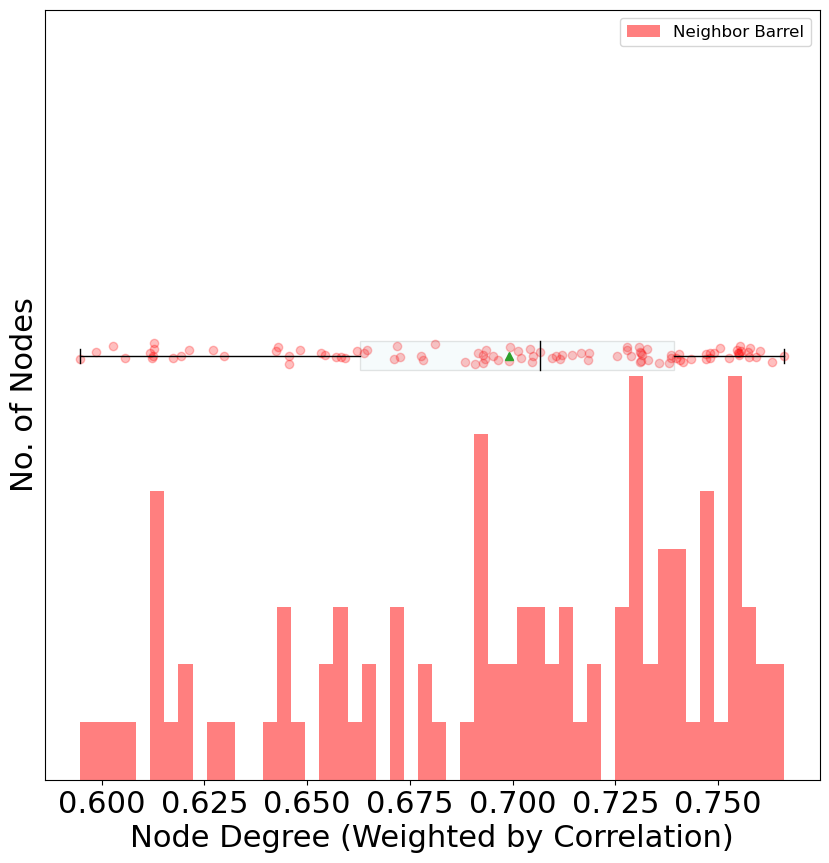

In [25]:
for date in node_degree_dist.keys():
    for slic_loc_id in node_degree_dist[date].keys():
        print(f"Date: {date}, Slice/Location: {slic_loc_id}")
        # plot the distribution of node degrees
        fig, ax = plt.subplots(figsize=(10, 10))
        #ax.set_xlim(0, 1)

        print(list(node_degree_dist[date][slic_loc_id][1].values()))

        ax.hist(list(node_degree_dist[date][slic_loc_id][1].values()),
                    bins=50, histtype='bar',
                    color='red', alpha=0.5, label='Neighbor Barrel',)
        plot_ylim = ax.get_ylim()[1]

        # plot scatter points for each node degree
        y_jitter = np.random.normal(0, 0.1, len(node_degree_dist[date][slic_loc_id][1].values()))
        ax.scatter(list(node_degree_dist[date][slic_loc_id][1].values()),
                    y_jitter + plot_ylim, color='red', alpha=0.25)

        # add horizontal boxplots 
        ax.boxplot([ 
                    list(node_degree_dist[date][slic_loc_id][1].values())],
                    positions=[ plot_ylim], 
                            widths=0.5, patch_artist=True,
                    boxprops=dict(facecolor='lightblue', alpha=0.1),
                    showfliers=False,
                    medianprops=dict(color='black'), showmeans=True, vert=False)

        ax.set_ylim(0, plot_ylim + 6)
        ax.legend(loc='upper right', fontsize=12)
        ax.set_yticks([])

        ax.set_xlabel('Node Degree (Weighted by Correlation)')
        ax.set_ylabel('No. of Nodes')
        date_formatted = date.replace('/', '-')
        plt.savefig(f"{output_fig_dir}/{date_formatted}_{slic_loc_id}_"
                    f"node_degree_distribution_barrel_cutoff_intrabarrel.png")
        plt.show()

In [26]:
node_degree_dist_cutoff

{'12/23/2024': {'1_3': {0: {},
   1: {'52_48': 0.8754296647949662,
    '39_58': 0.8502512276569135,
    '57_51': 0.8721606614739582,
    '47_54': 0.8833589613930302,
    '43_49': 0.9000537743599932,
    '43_56': 0.8648207386376245,
    '54_51': 0.8879960111725191,
    '38_54': 0.8741316273669452,
    '46_52': 0.8937783436493127,
    '45_42': 0.8243023288546703,
    '38_51': 0.883764560293383,
    '47_42': 0.7909108396926555,
    '43_46': 0.8899917756654784,
    '50_61': 0.8195088886205447,
    '37_54': 0.8675739330934189,
    '44_52': 0.8950851325774596,
    '41_52': 0.8876070875305975,
    '46_44': 0.8433813555826919,
    '39_49': 0.8926791935190362,
    '42_57': 0.8594497305027544,
    '50_56': 0.8782906607154872,
    '39_55': 0.8689792106509387,
    '55_50': 0.8838010497209899,
    '40_56': 0.8736126039009097,
    '50_53': 0.8955467910980546,
    '49_45': 0.8302177028294123,
    '44_61': 0.8288023822838819,
    '42_52': 0.8914490822352441,
    '56_49': 0.8685352676529637,
    '40_52

Date: 12/23/2024, Slice/Location: 1_3


NameError: name 'roi_file_barrel_0' is not defined

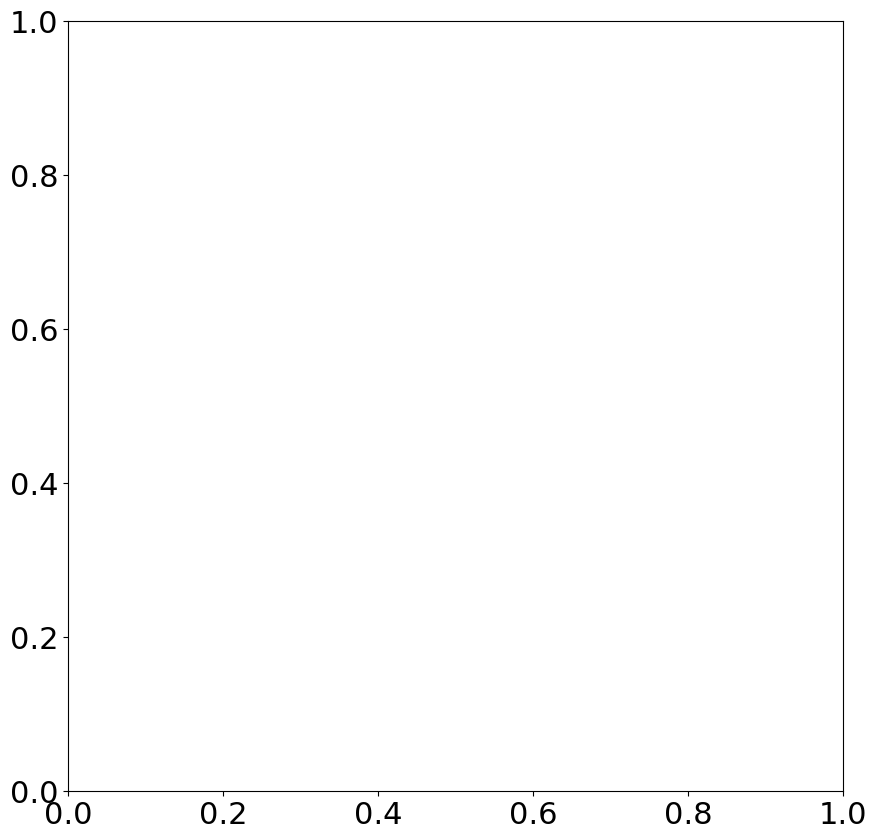

In [27]:
# node degree vs distance from center of barrel
for date in node_degree_dist_cutoff.keys():
    for slic_loc_id in node_degree_dist_cutoff[date].keys():
        print(f"Date: {date}, Slice/Location: {slic_loc_id}")
        # plot the distribution of node degrees
        fig, ax = plt.subplots(figsize=(10, 10))
        #ax.set_xlim(0, 1)

        # calculate center of the barrel from the roi points
        home_barrel = 0
        i_barrel = 1

        # get roi_file for home_barrel
        roi_file_barrel_1 = loc_df[loc_df['ROI_Set'].str.contains('rand_0')]['ROI_File'].values[0]
        
        # read the roi file (home_barrel)
        rois_0 = ROIFileReader(roi_file_barrel_0).get_roi_list()
        rois_0 = [LaminarROI(r, input_diode_numbers=True)
                for r in rois_0]
        rois_points0 = [roi.get_points() for roi in rois_0]
        
        xs, ys = [], []
        for roi in rois_points0:
            for px in roi:
                xs.append(px[0])
                ys.append(px[1])
        center = (np.mean(xs), np.mean(ys))

        # get the distance from the center of the barrel for each node
        dist_from_center = []
        for key in node_degree_dist_cutoff[date][slic_loc_id][i_barrel].keys():
            x, y = map(int, key.split('_'))
            dist_from_center.append(np.sqrt((x - center[0]) ** 2 
                                            + (y - center[1]) ** 2) *
                                            um_per_px)
        label = 'Home Barrel' if i_barrel == 0 else 'Neighbor Barrel'
        color = 'blue' if i_barrel == 0 else 'red'
        ax.scatter(dist_from_center, 
                    list(node_degree_dist_cutoff[date][slic_loc_id][i_barrel].values()), 
                    color=color, alpha=0.35, label=label)

        # linear regression for the node degree vs distance from center
        slope, intercept, r_value, p_value, std_err = linregress(
            dist_from_center, 
            list(node_degree_dist_cutoff[date][slic_loc_id][i_barrel].values()))
        print(f"Slope: {slope}, Intercept: {intercept}, R^2: {r_value**2}, p-value: {p_value}, Std Err: {std_err}")
        # plot the line of best fit
        x_fit = np.linspace(0, max(dist_from_center), 100)
        y_fit = slope * x_fit + intercept
        # plot only for the domain of the data
        x_fit = x_fit[x_fit <= max(dist_from_center)]
        ax.plot(x_fit, y_fit, color=color, linewidth=2)

        ax.set_xlabel('Distance from Home Barrel (um)')
        ax.set_ylabel('Node Degree (Weighted by Correlation)')
        ax.legend(loc='upper right', fontsize=12)
        
        date_formatted = date.replace('/', '-')
        plt.savefig(f"{output_fig_dir}/{date_formatted}_{slic_loc_id}_"
                    f"node_degree_vs_distance_from_center_barrel_cutoff.png")
        plt.show()

No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
No corr_matrices_by_slice for this date
Date:  12/23/2024 Slice:  1 Location:  3
Avg corr shape:  (26, 100, 100)
Clustering: [0.880390219004886, 0.8637002559493259, 0.878920197069167, 0.8863594021114621, 0.8973973297721994, 0.873718225427267, 0.8893481369889269, 0.8798808120507817, 0.8932641602010557, 0.8448276209328595, 0.8865501929985878, 0.8212058550424182, 0.8904321520002297, 0.8429263978528848, 0.8755312724033744, 0.894026769066851, 0.889074436941845, 0.8580401302079443, 0.892551449081331, 0.8700363926193945, 0.8828938981298121, 0.8763475441658284, 0.8865100639137916, 0.8794801145269728, 0.8944734539504615, 0.8488844730467496, 0.8490616180329142, 0.8916369018883626, 0.8761190522790229, 0.8871768824551062, 0.8625205406571269, 0.8875421121829484, 0.8776829008087369, 0.8565214153061014, 

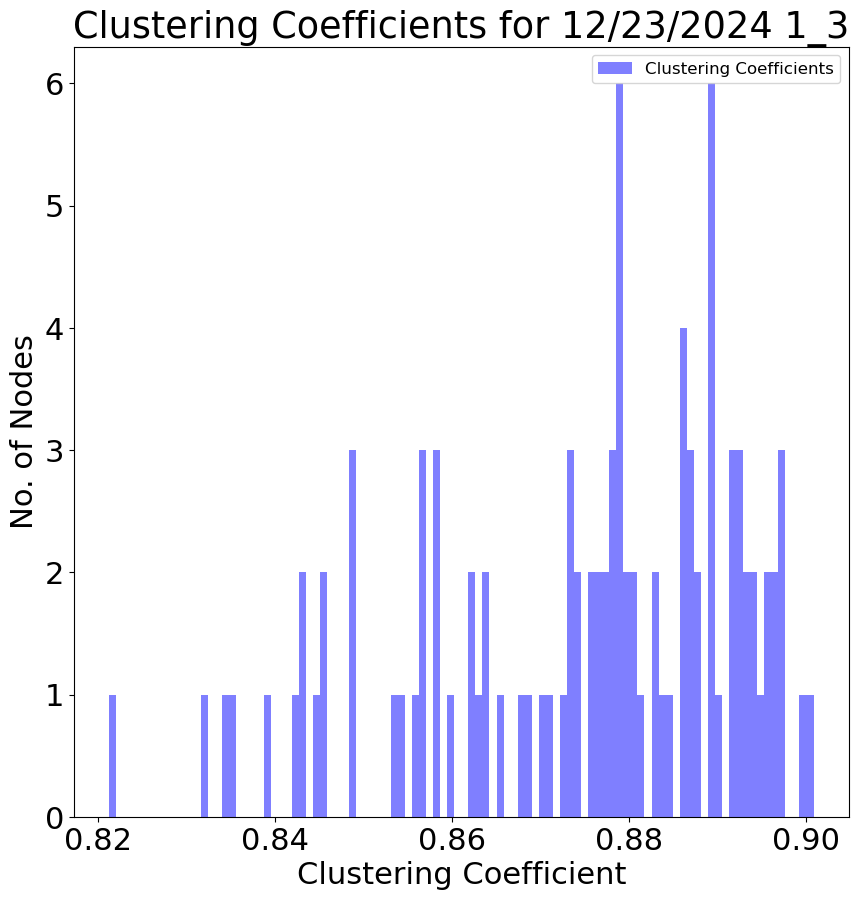

Modularity: 0.01374157240913082
Betweenness Centrality: {0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.0, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.0, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.0, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0.0, 88: 0.0, 89: 0.0, 90: 0.0, 91: 0.0, 92: 0.0, 93: 0.0, 94: 0.0, 95: 0.0, 96: 0.0, 97: 0.0, 98: 0.0, 99: 0.0}


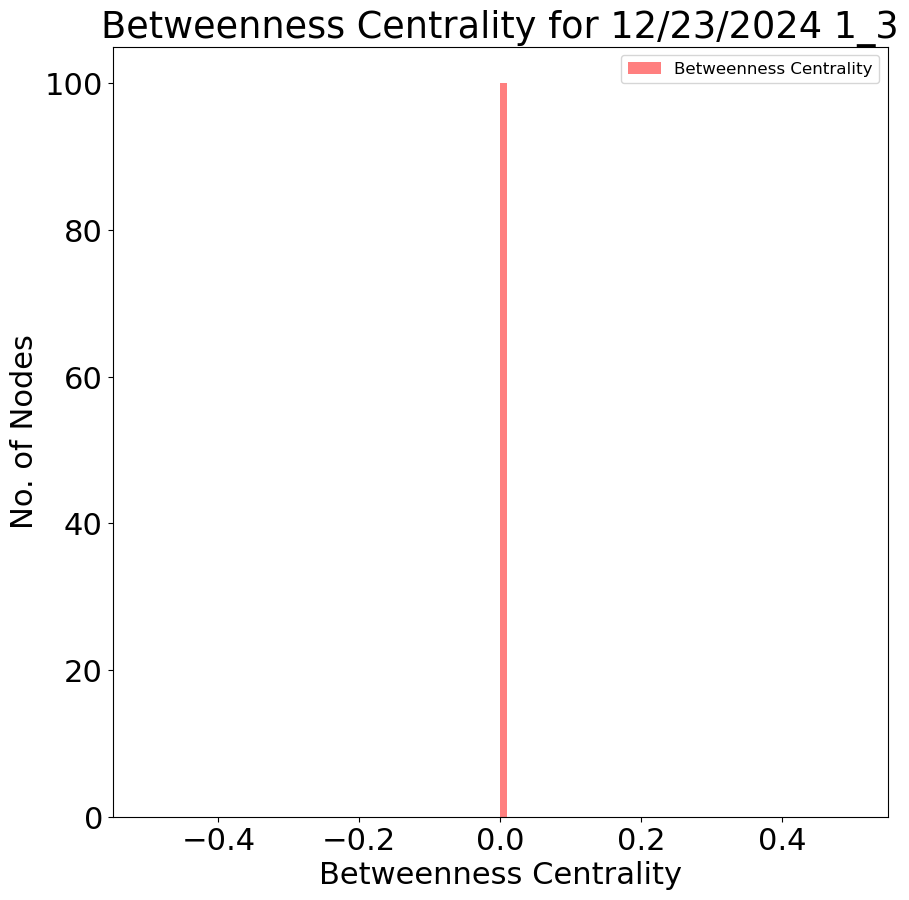

Date:  12/23/2024 Slice:  2 Location:  2
Avg corr shape:  (26, 100, 100)
Clustering: [0.5569812036400974, 0.547738335208008, 0.5546100547196406, 0.5323432954110926, 0.5749865999046232, 0.574164376861373, 0.5529155192900074, 0.5725208215798078, 0.5582069829461823, 0.5726728006721643, 0.5954439260514802, 0.5890934105378026, 0.5738326730398282, 0.5195943466947016, 0.5774950770663244, 0.566101619050067, 0.5866391410705127, 0.589187913209408, 0.5663657699220354, 0.5838699366491038, 0.5965216156559311, 0.5862024784567437, 0.5707634603897092, 0.5890130779400499, 0.5319369425264177, 0.573282179361398, 0.5988300851596358, 0.6007638304082803, 0.5720199568341325, 0.543567710717398, 0.48663201415702456, 0.5608738711090493, 0.5601410308895282, 0.577711019986601, 0.5655735390015996, 0.5555281133845177, 0.5711980141264708, 0.5846171302110573, 0.5782058796662, 0.5851215160601477, 0.58694720162735, 0.5667323460158664, 0.5889496948928961, 0.5636211693885234, 0.5780689612037211, 0.5621640027549273, 0.554

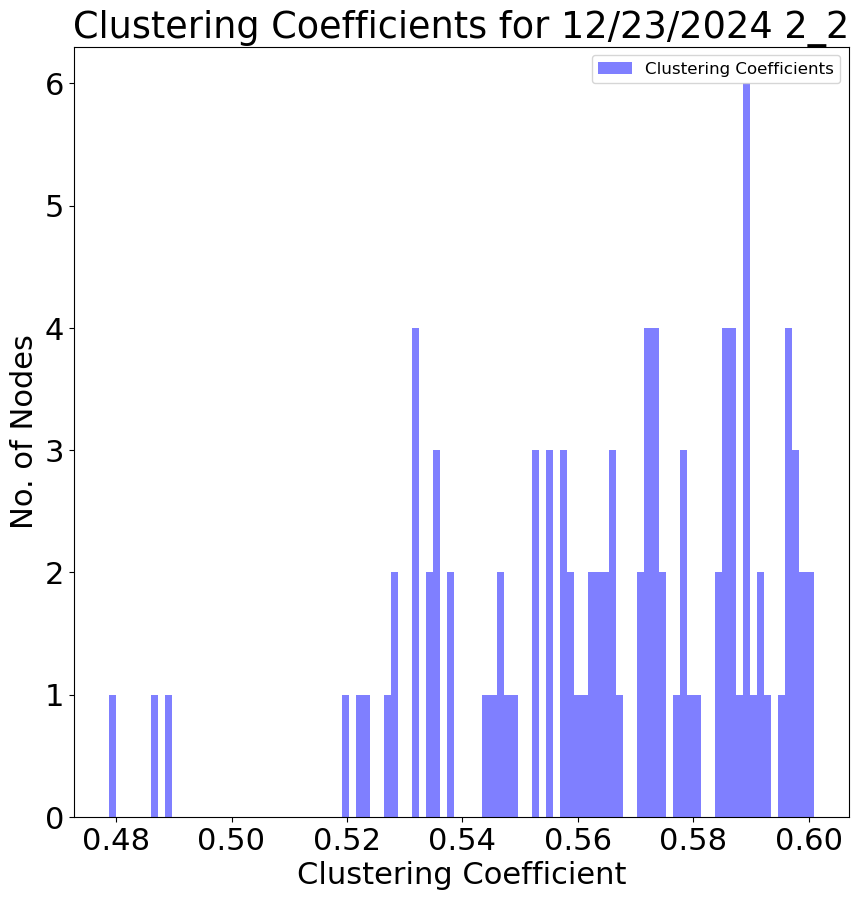

Modularity: 0.021846948162795504
Betweenness Centrality: {0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.00020614306328592042, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.00020614306328592042, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.006390434961863533, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.00020614306328592042, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.00041228612657184083, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.00041228612657184083, 69: 0.0, 70: 0.0, 71: 0.002473716759431045, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.0, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.008658008658008658, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0.0, 88: 0.0, 89: 0

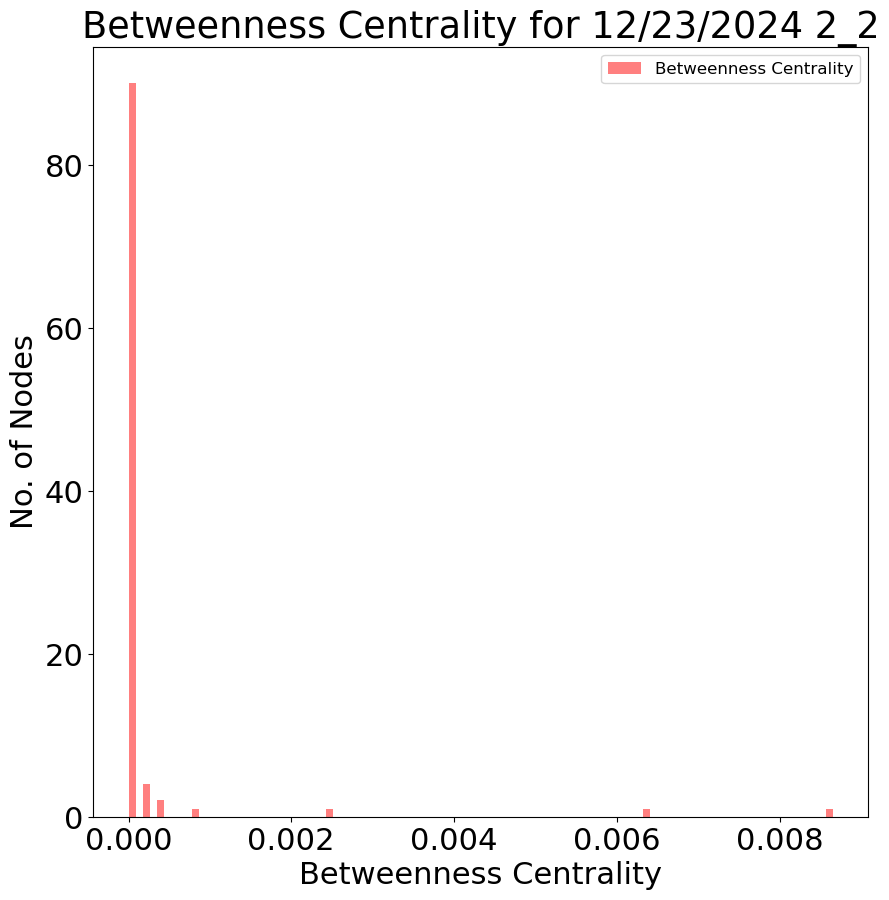

Date:  1/15/2025 Slice:  1 Location:  3
Avg corr shape:  (26, 100, 100)
Clustering: [0.3309470298307347, 0.3497062458032502, 0.35818409116501726, 0.35085274297318575, 0.35496389801033756, 0.35342411628956744, 0.3614885345133735, 0.30203276458189965, 0.35946694019713793, 0.3480665678489524, 0.3033874931308771, 0.33649809944564657, 0.34566696263216284, 0.3281927346663824, 0.3524872134024109, 0.381673433644283, 0.3075291857419154, 0.3404504165946054, 0.3500262930186106, 0.2932556604330649, 0.37796474252162104, 0.3389445395623161, 0.35488432108771406, 0.34156619935949273, 0.3249029467027185, 0.36942953026015923, 0.3874690249804895, 0.3471610319398152, 0.3570829553736255, 0.3621357870676501, 0.3119622059413453, 0.38628699124016663, 0.3659545119792564, 0.3460017145999032, 0.3239280900428239, 0.3576678169536249, 0.35484077841494405, 0.3504776420817168, 0.36002533897370353, 0.36411878567723444, 0.3311477246731427, 0.36251321618633875, 0.38962397456194764, 0.346106497408639, 0.3124829434697147,

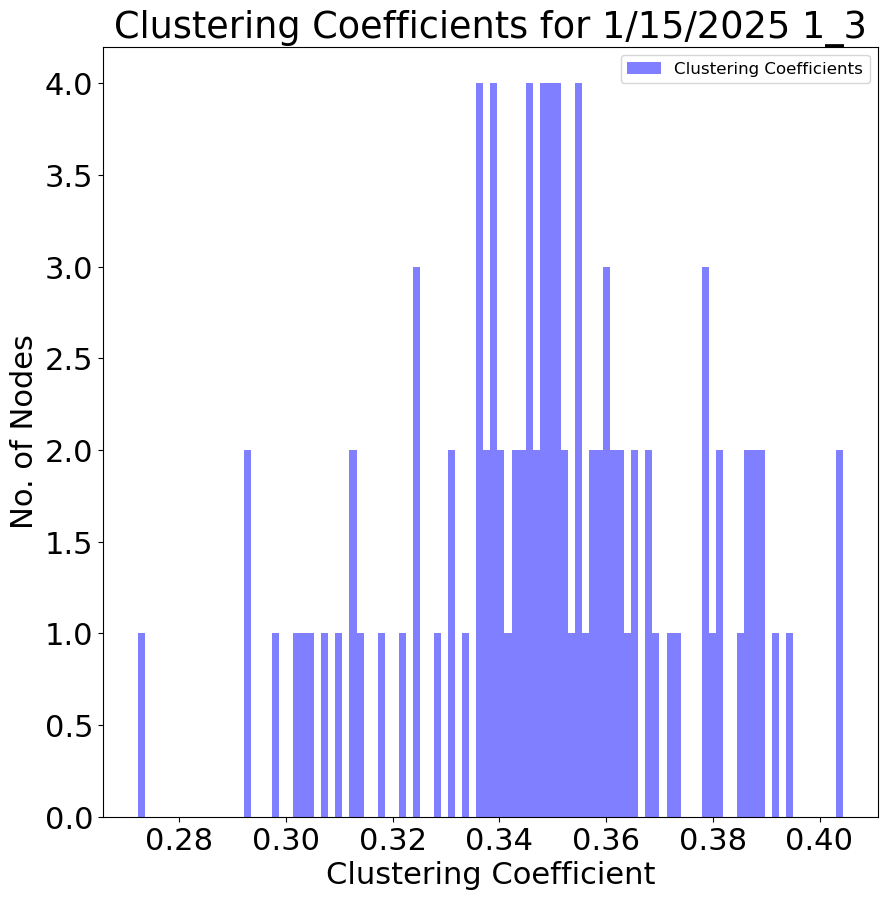

Modularity: 0.08139074034095942
Betweenness Centrality: {0: 0.00020614306328592042, 1: 0.00020614306328592042, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.00041228612657184083, 8: 0.0, 9: 0.0010307153164296021, 10: 0.010719439290867862, 11: 0.0, 12: 0.00020614306328592042, 13: 0.008864151721294579, 14: 0.0, 15: 0.0, 16: 0.009688723974438259, 17: 0.0, 18: 0.0, 19: 0.03896103896103896, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.035456606885178314, 35: 0.0, 36: 0.0, 37: 0.012368583797155224, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.00020614306328592042, 46: 0.0, 47: 0.033189033189033185, 48: 0.0, 49: 0.0, 50: 0.014636157493300349, 51: 0.0, 52: 0.00041228612657184083, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.00020614306328592042, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.0, 65: 0.00041228612657184083, 66: 0.011131725417439703, 67: 0.011750154607297465, 68

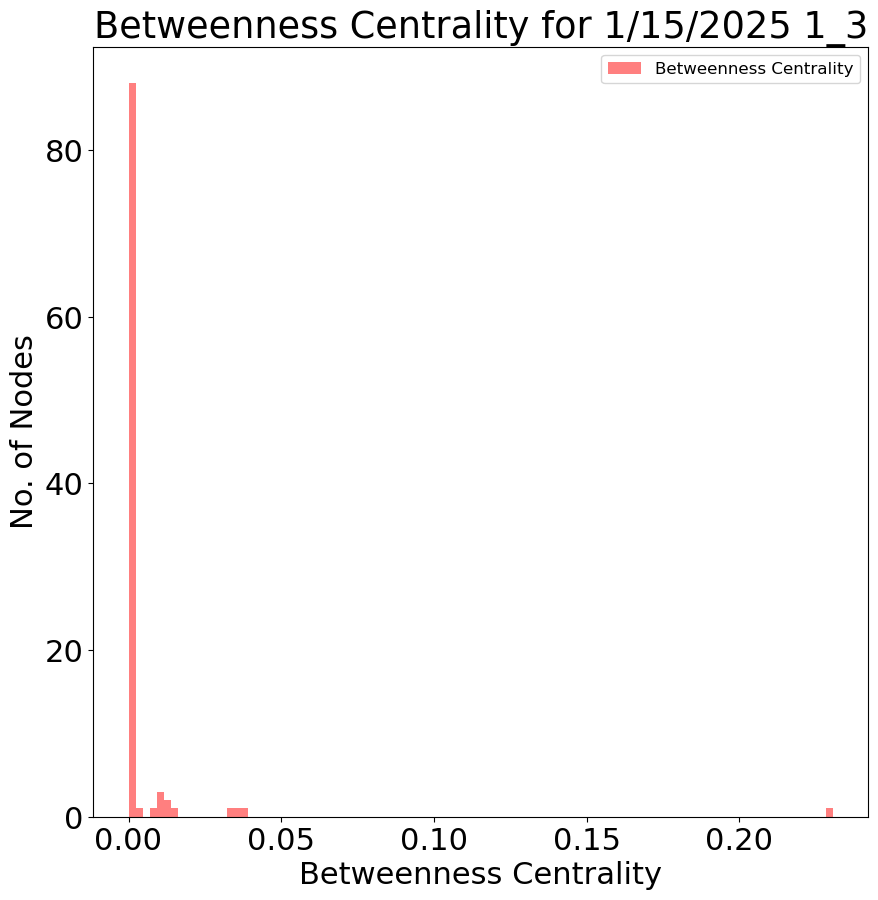

Date:  1/15/2025 Slice:  3 Location:  2
Avg corr shape:  (26, 100, 100)
Clustering: [0.509826774204777, 0.4898248588751407, 0.44092116955326244, 0.47687838792432924, 0.47892722673036753, 0.5149905527568945, 0.48710121041253657, 0.5109954012507251, 0.48664962992719873, 0.5237726520916907, 0.5027256855330265, 0.5002993298772757, 0.5004988379221903, 0.5125951388081569, 0.5031422081343586, 0.47292007755676174, 0.5096754385864197, 0.5199143501286495, 0.4765830832006433, 0.5116928233618523, 0.4956038703370231, 0.4597939449022887, 0.44931337606948635, 0.49816934319777867, 0.48443913510309233, 0.48632448550697716, 0.5130470301674478, 0.4860153890776435, 0.49343267836276095, 0.5099513228796371, 0.5197580266739695, 0.46972753666599887, 0.4939998972575227, 0.4931394039132007, 0.5009909256056837, 0.5212693151628118, 0.4834198353757779, 0.4534309520816382, 0.4909634461343292, 0.468598531751732, 0.517558779562398, 0.5168137258854579, 0.4473801376176976, 0.5256071219177423, 0.4949729125822978, 0.5140

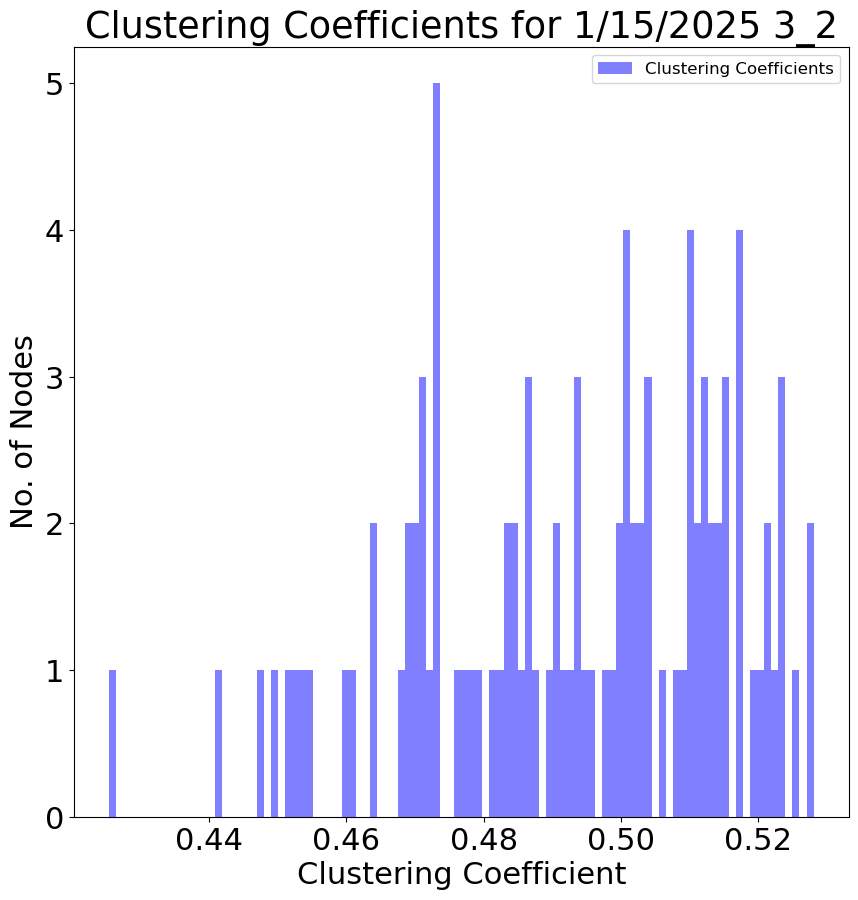

Modularity: 0.05569253601829725
Betweenness Centrality: {0: 0.0, 1: 0.0, 2: 0.0404040404040404, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.00041228612657184083, 16: 0.0, 17: 0.0, 18: 0.00041228612657184083, 19: 0.0, 20: 0.0, 21: 0.0008245722531436817, 22: 0.005772005772005772, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0006184291898577612, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.012780869923727066, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.008658008658008658, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0012368583797155224, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.02329416615130901, 55: 0.0, 56: 0.0037105751391465673, 57: 0.00041228612657184083, 58: 0.0, 59: 0.007215007215007215, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.00020614306328592042, 72: 0.0, 73: 0.00020614306328592042, 74: 0.0, 75: 0.0, 76:

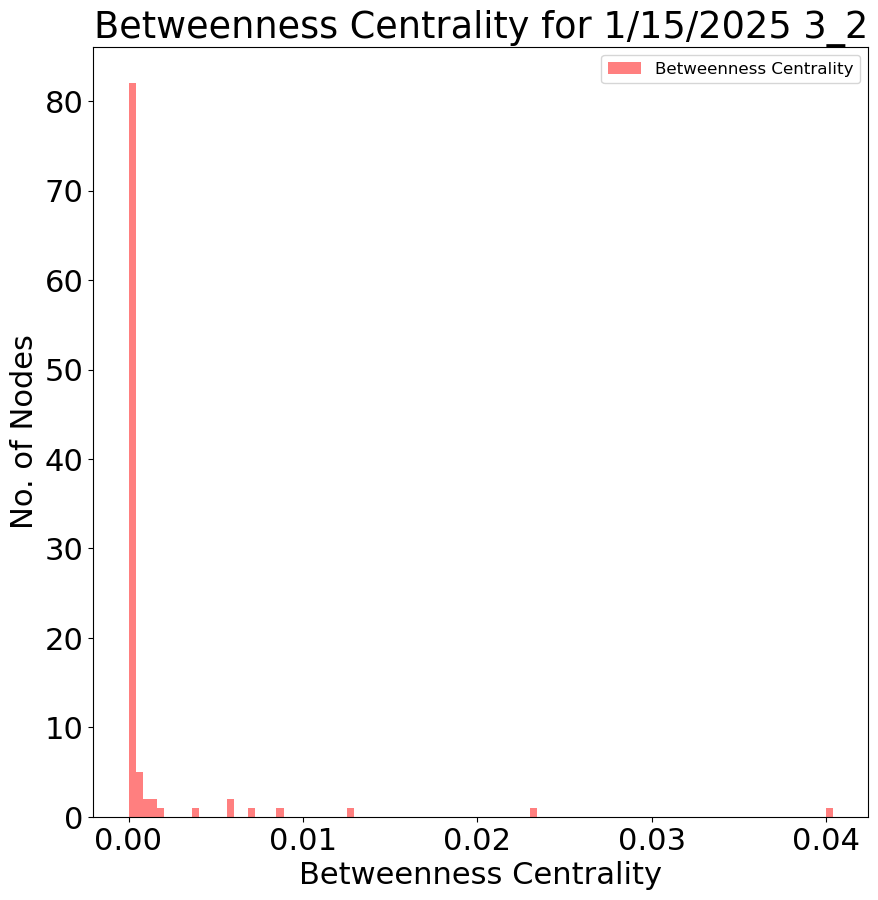

Date:  1/22/2025 Slice:  1 Location:  2
Avg corr shape:  (26, 100, 100)
Clustering: [0.5849751221784193, 0.527338485838232, 0.6451268353850769, 0.6216856490219455, 0.5938307132345028, 0.5464708422374402, 0.5891996566588057, 0.5502144577591891, 0.6163416557544696, 0.5596310820199479, 0.5754109959750712, 0.576404707403402, 0.5807904954035829, 0.6363139816132207, 0.5791741173629804, 0.6087975261163056, 0.6019222190753418, 0.6276664622889205, 0.5455812697750703, 0.6011402492739403, 0.646932140264655, 0.5782795335280065, 0.5789957866420141, 0.6103853407529506, 0.6120992793346587, 0.5936883787827647, 0.5564006674353041, 0.5860358601890082, 0.5546799753021514, 0.6227315521518181, 0.5869553598093376, 0.6229710302064992, 0.6516756618877393, 0.6179749225414979, 0.5557473788850692, 0.6015287903269606, 0.5513446404310232, 0.588776817848864, 0.6067531318889341, 0.5997528652506309, 0.5802956391771361, 0.5584921578332817, 0.6353274805615167, 0.6352257300242696, 0.5683015239262577, 0.6411666309652527,

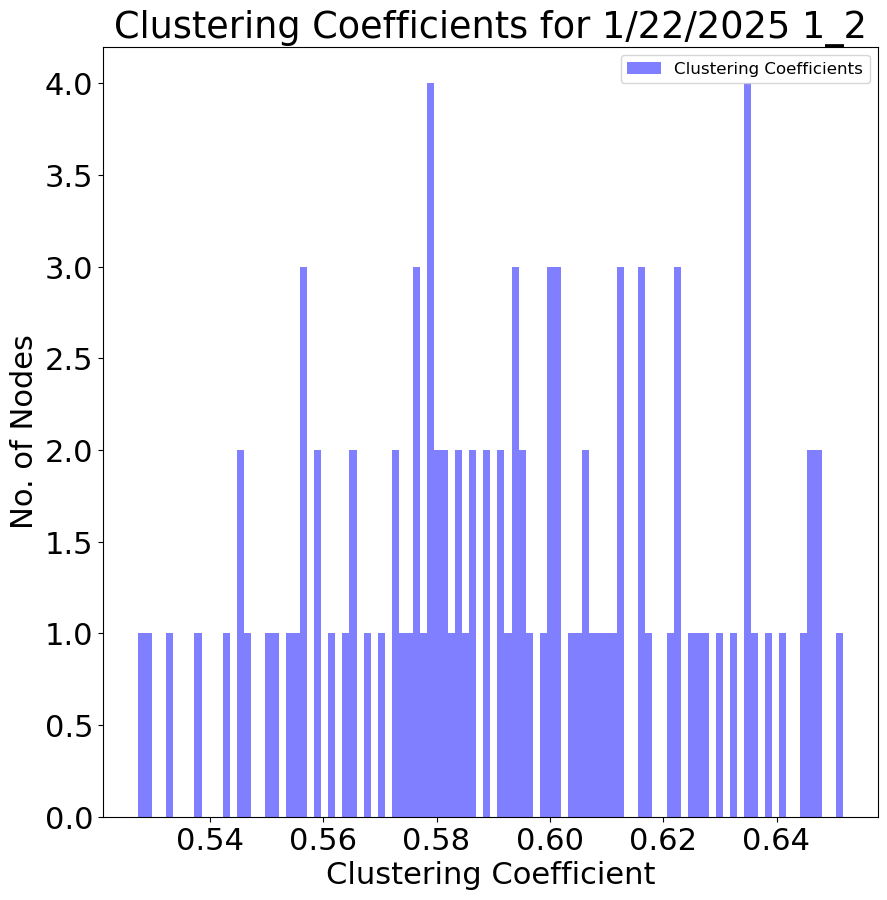

Modularity: 0.018829098929014396
Betweenness Centrality: {0: 0.0, 1: 0.0037105751391465673, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0006184291898577612, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0006184291898577612, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.00020614306328592042, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0012368583797155224, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0022675736961451248, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.0, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.0, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.0, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0.0, 88: 0.0, 89: 0.0, 90: 0.0006184291898577612, 91: 0.

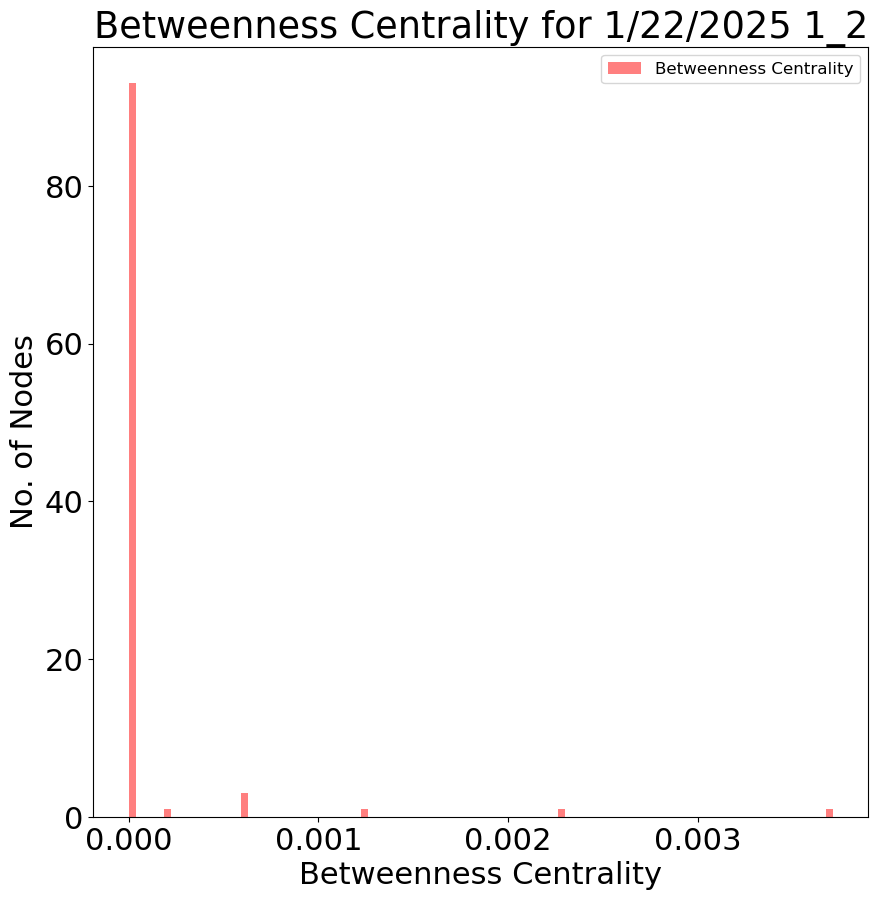

Date:  1/22/2025 Slice:  3 Location:  2
Avg corr shape:  (26, 100, 100)
Clustering: [0.34757584305936234, 0.34934215705613086, 0.33366196035321716, 0.40283326730632874, 0.36872041037998965, 0.40915193059992894, 0.19391293585956818, 0.370455954091415, 0.407689392828322, 0.2819577574652524, 0.3158193370895907, 0.2966654117780421, 0.31523552030705193, 0.402907924891729, 0.35267239469797207, 0.3475681186334644, 0.3093216382484693, 0.22608431527561076, 0.36884059267494806, 0.2507267722165146, 0.30366544287304703, 0.3207294624815989, 0.3268479776282267, 0.3785671766380062, 0.227979759926856, 0.3347809300355115, 0.4039955170232253, 0.32470966928905765, 0.2228169204035565, 0.41272204668262436, 0.32210494227060726, 0.375136722290011, 0.38900131429419743, 0.3927898274370119, 0.4101402086519731, 0.31694016955521265, 0.40630303144415986, 0.20132163732611813, 0.3655519606462459, 0.3951035983179791, 0.41229274363536034, 0.3464848499769464, 0.2528343320277311, 0.3241421367759278, 0.371569161916382, 0

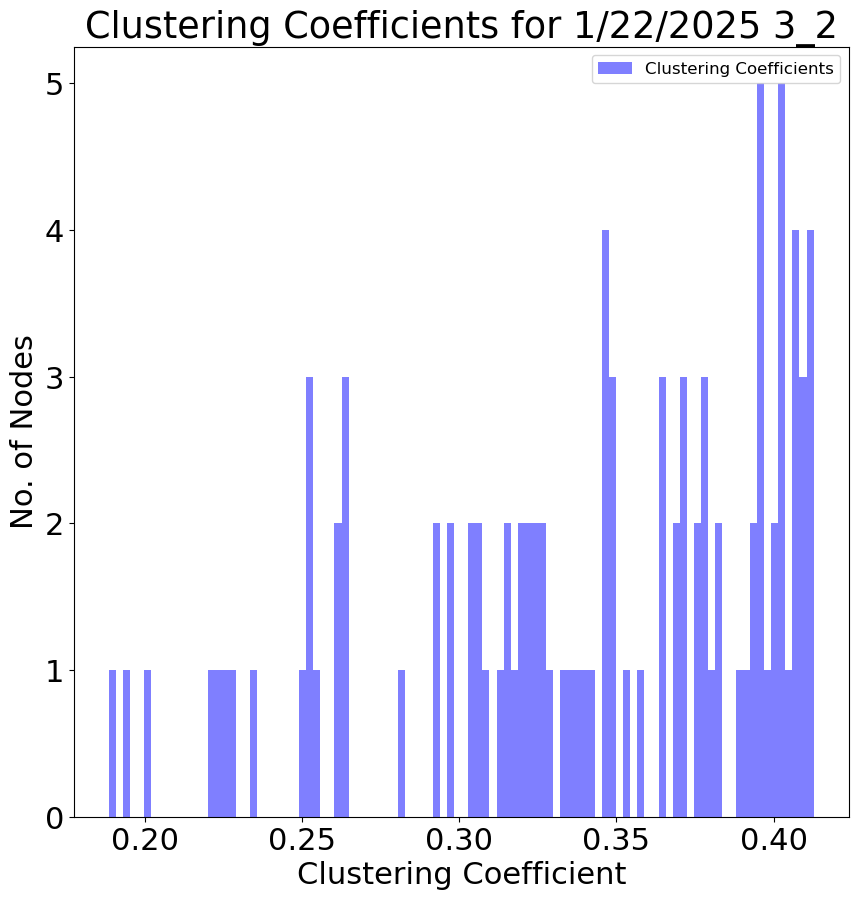

Modularity: 0.22898764276486994
Betweenness Centrality: {0: 0.0606060606060606, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.10781282209853638, 7: 0.02514945372088229, 8: 0.01834673263244692, 9: 0.01958359101216244, 10: 0.0, 11: 0.014017728303442589, 12: 0.047619047619047616, 13: 0.06596578025149454, 14: 0.06782106782106782, 15: 0.008658008658008658, 16: 0.0, 17: 0.0, 18: 0.0010307153164296021, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.42547928262213974, 25: 0.06493506493506493, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.15646258503401358, 30: 0.0, 31: 0.06349206349206349, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.016491445062873634, 36: 0.0, 37: 0.0, 38: 0.06699649556792414, 39: 0.18655947227375796, 40: 0.0, 41: 0.00515357658214801, 42: 0.02535559678416821, 43: 0.024324881467738608, 44: 0.0, 45: 0.183879612451041, 46: 0.13378684807256236, 47: 0.04432075860647289, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.021851164708307565, 52: 0.0, 53: 0.0, 54: 0.0018552875695732837, 55: 0.0, 56: 0.0045351473922902496, 57: 0.0

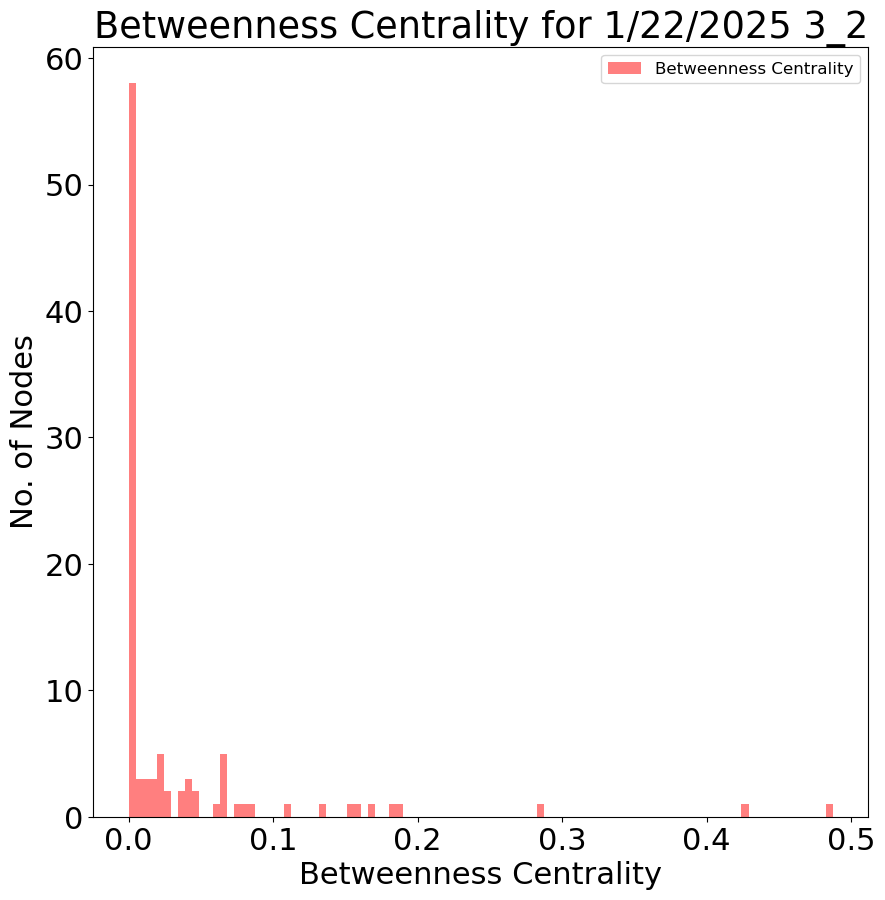

Date:  2/5/2025 Slice:  1 Location:  3
Avg corr shape:  (26, 100, 100)
Clustering: [0.5550603519171871, 0.6568494931325446, 0.6306415652845927, 0.6681701451496683, 0.5673407094937828, 0.6798433156603315, 0.6676792520934076, 0.6578512357861711, 0.6617580695209335, 0.633763349617391, 0.622184542593418, 0.6178292996827048, 0.6361433766382386, 0.5414069872109596, 0.643143921200242, 0.6340923858535857, 0.5959900289106586, 0.6039800792804405, 0.6432373423793157, 0.6524501331612149, 0.6703115025679528, 0.6307288667823905, 0.5612697212055908, 0.6256626630466197, 0.6734444138076263, 0.6206599109230068, 0.6682563746216648, 0.5928084875057976, 0.6574776853807174, 0.6110736921749199, 0.6657363700018971, 0.6509054527381609, 0.6793573550230817, 0.6689995442002332, 0.6545168232953757, 0.6198401465586598, 0.6526847377313341, 0.6704512858006243, 0.6512181963612239, 0.5831481083900332, 0.6412517932751398, 0.6238570216380193, 0.6666505068282452, 0.6528309534711674, 0.596910465981908, 0.5591475143162754, 

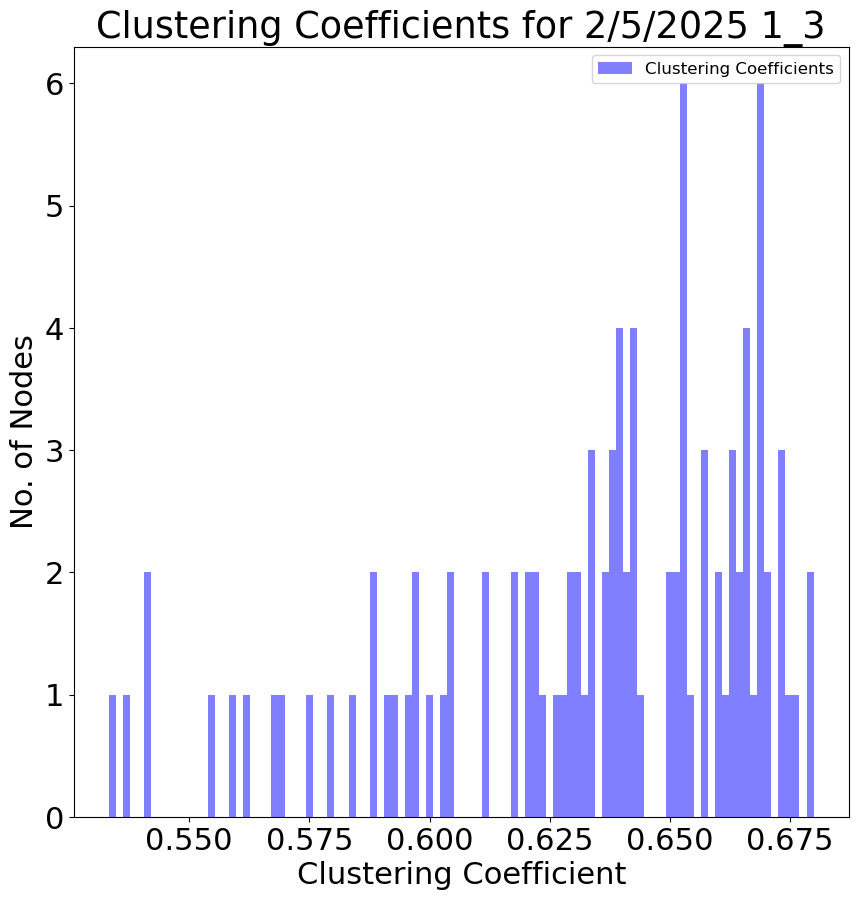

Modularity: 0.030611605078983306
Betweenness Centrality: {0: 0.00041228612657184083, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0010307153164296021, 10: 0.0, 11: 0.0, 12: 0.00020614306328592042, 13: 0.0016491445062873633, 14: 0.0, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0006184291898577612, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0016491445062873633, 46: 0.0006184291898577612, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.022881880024737167, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.0, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.00041228612657184083, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.0, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0

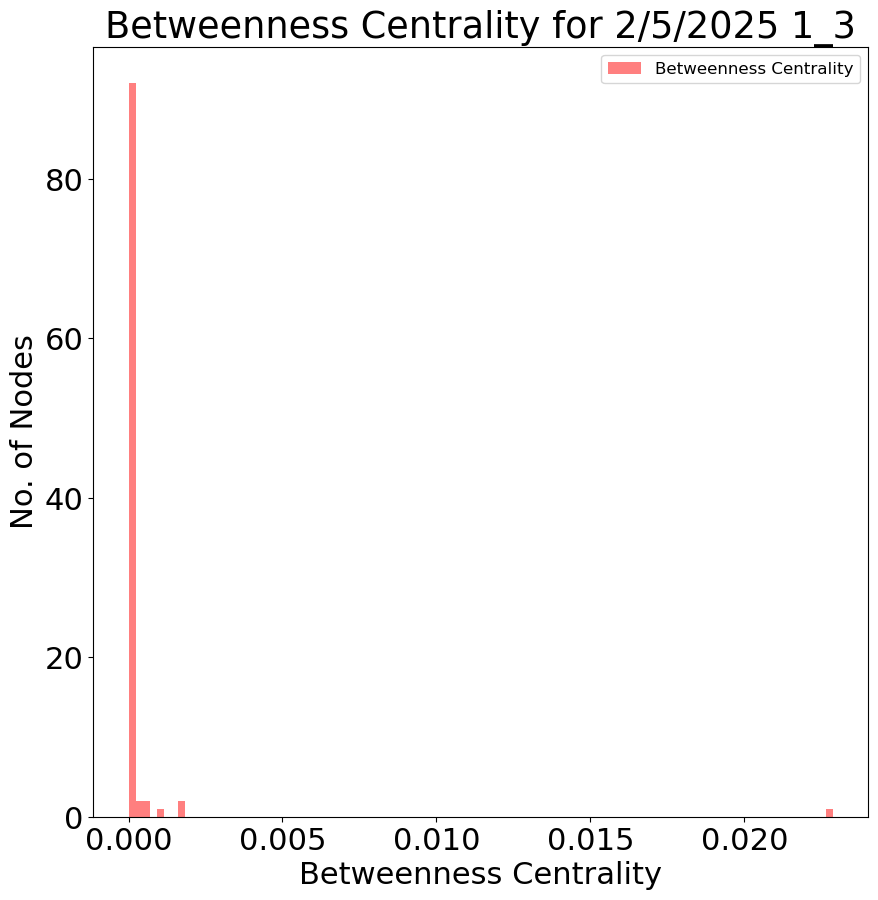

Date:  2/5/2025 Slice:  2 Location:  2
Avg corr shape:  (26, 100, 100)
Clustering: [0.8399485732147471, 0.8390134682496011, 0.8680922803409263, 0.8558406524706216, 0.8564957640833168, 0.8392908890288638, 0.85714251051728, 0.8841315754674424, 0.8532770095664847, 0.8749638753747601, 0.8665500654478311, 0.8794585438233927, 0.7625022695542383, 0.863333793548866, 0.8391073647192951, 0.8419930921654823, 0.8619845448949262, 0.8454342805191515, 0.8832451863897095, 0.746606019595677, 0.8774633833522298, 0.8593610831412906, 0.8563063171639048, 0.8672992743768436, 0.8563885242961624, 0.8525370004549359, 0.8723461745999355, 0.8781778772546068, 0.8760685054009016, 0.873718859192615, 0.8629308783884376, 0.8696999992691059, 0.8538017327917498, 0.8572670436419174, 0.8673017901479539, 0.8607721672606387, 0.8649174404897484, 0.8562238427465717, 0.876129388132038, 0.8723135485832343, 0.8817960183829259, 0.8702809089770327, 0.8770635516376768, 0.8600041523208076, 0.858571911975563, 0.8703608231237453, 0.8

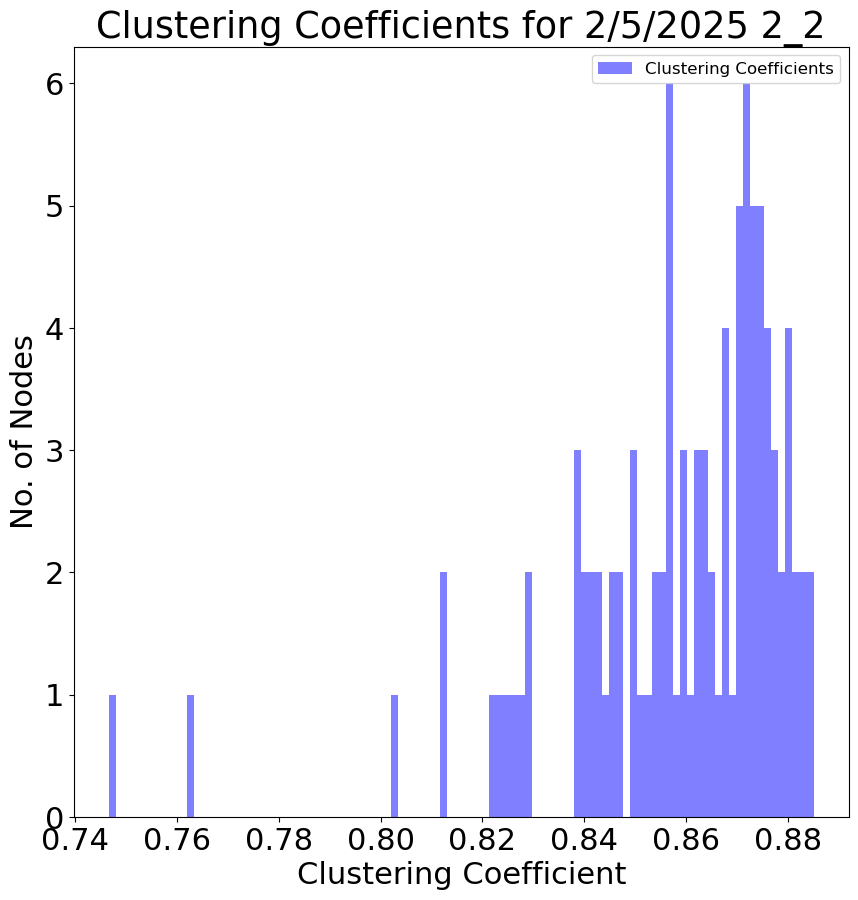

Modularity: 0.01669628073077689
Betweenness Centrality: {0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.0, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.0, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.0, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0.0, 88: 0.0, 89: 0.0, 90: 0.0, 91: 0.0, 92: 0.0, 93: 0.0, 94: 0.0, 95: 0.0, 96: 0.0, 97: 0.0, 98: 0.0, 99: 0.0}


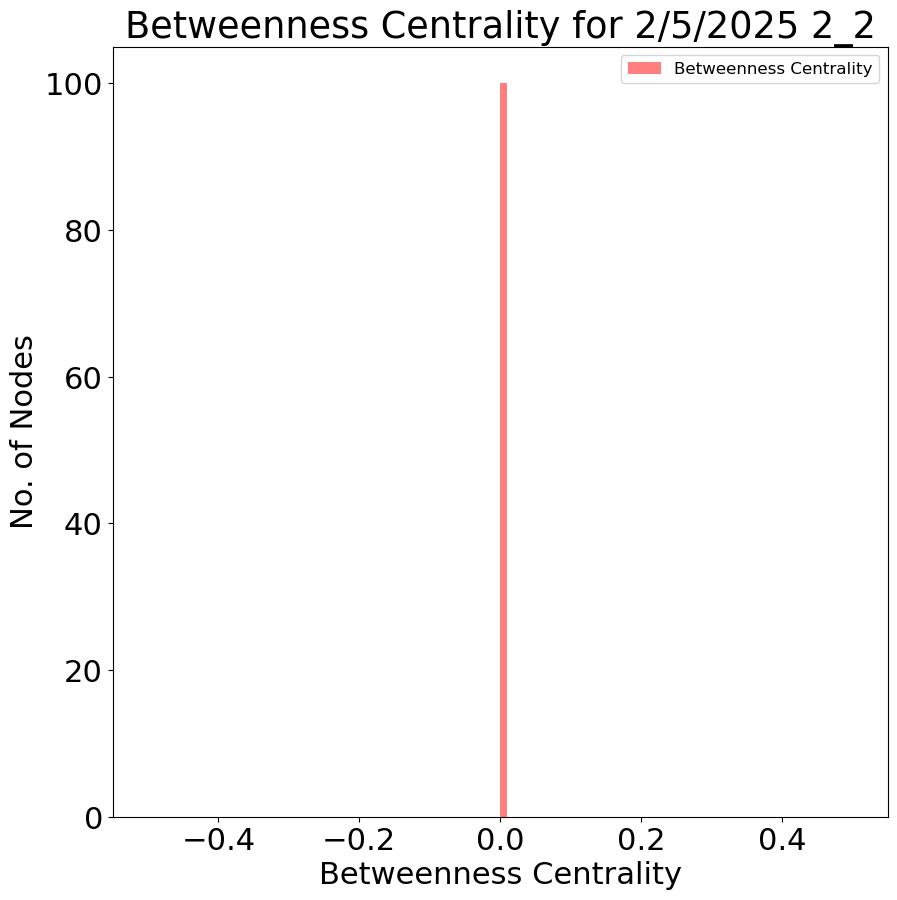

Date:  4/16/2025 Slice:  1 Location:  1
Avg corr shape:  (26, 100, 100)
Clustering: [0.8209684864818994, 0.8012512341671455, 0.808856079682221, 0.8124582759965788, 0.7796526562775036, 0.8114101575750353, 0.8276819645052943, 0.7970409197864881, 0.7852249063087712, 0.7846349787627227, 0.7998545187543046, 0.8063291506110654, 0.8264585411559283, 0.8071777273464535, 0.8071507088522103, 0.7910086087635703, 0.8079190044509047, 0.8075896438792417, 0.829789590386624, 0.776186227059673, 0.8234366486346365, 0.7650541957964805, 0.8062749404950175, 0.7907827105838237, 0.8170807581952347, 0.7826216681895746, 0.8013504109468771, 0.8169309341416926, 0.7915363742853827, 0.7974052926481493, 0.8190925807542807, 0.8219100084918762, 0.8030846141934889, 0.8156389278165829, 0.827844315291604, 0.8200953534876635, 0.7751608913420198, 0.8152650864978901, 0.8036527450267551, 0.8323441197456778, 0.815299463632494, 0.7926087665784619, 0.809029144601643, 0.8062881886757364, 0.8137808494063281, 0.8234270016552275, 0

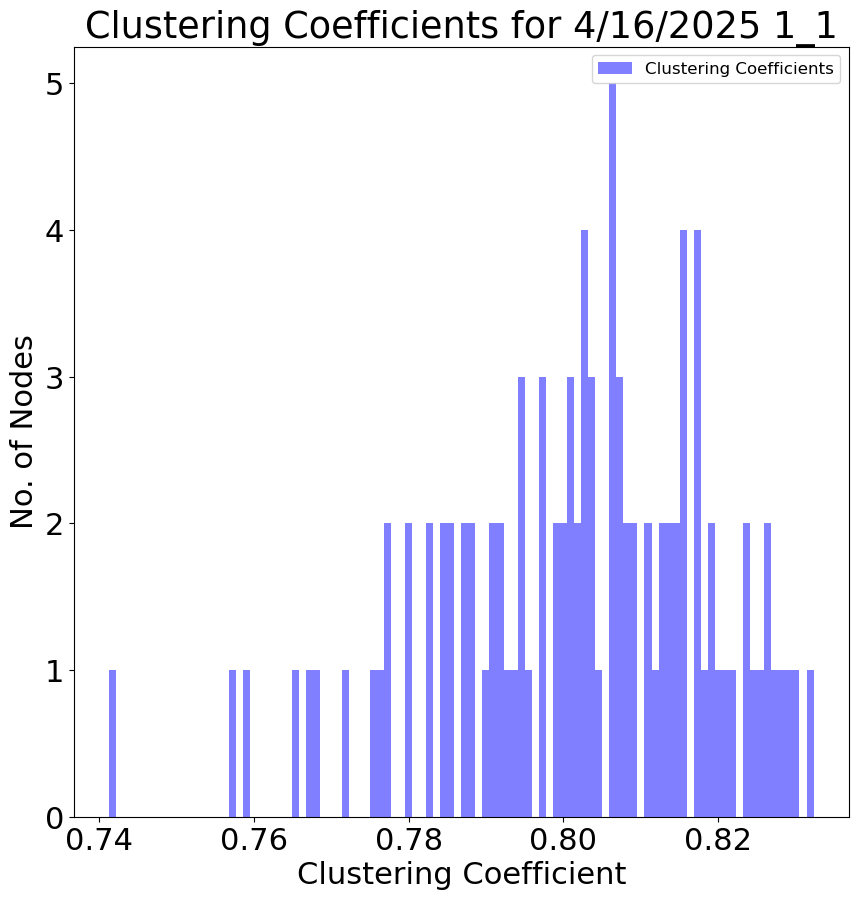

Modularity: 0.011900548896759872
Betweenness Centrality: {0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.0, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.0, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.0, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0.0, 88: 0.0, 89: 0.0, 90: 0.0, 91: 0.0, 92: 0.0, 93: 0.0, 94: 0.0, 95: 0.0, 96: 0.0, 97: 0.0, 98: 0.0, 99: 0.0}


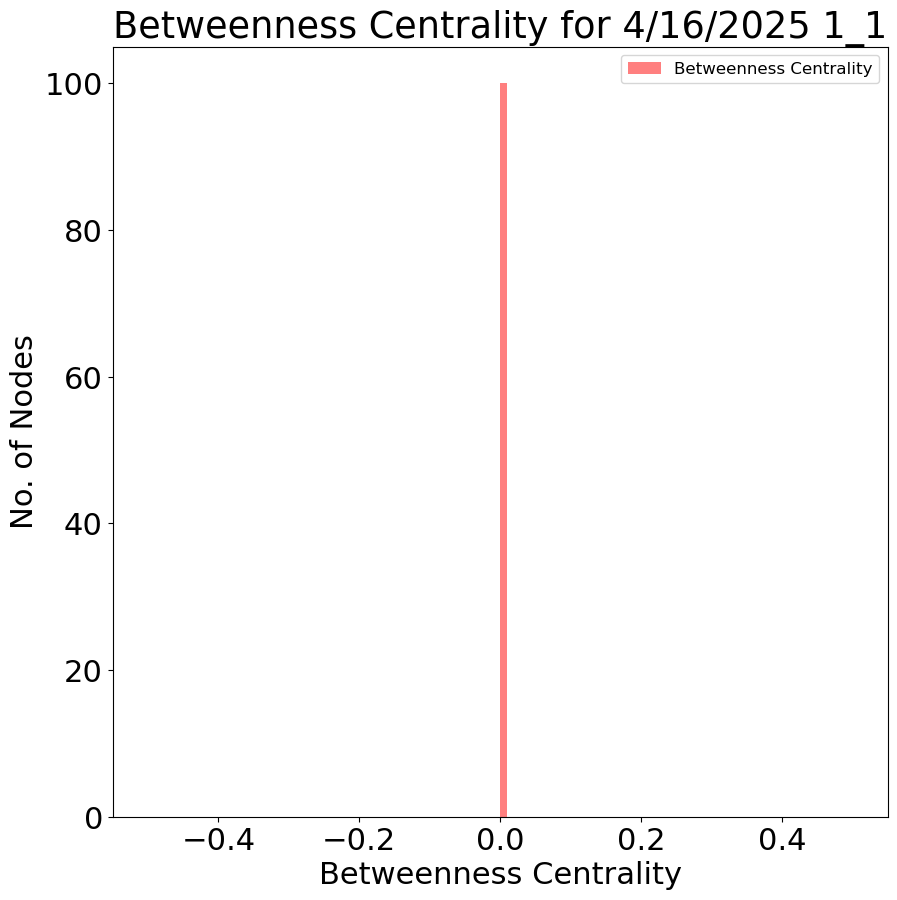

Date:  4/16/2025 Slice:  2 Location:  2
Avg corr shape:  (12, 100, 100)
Clustering: [0.8078616976330713, 0.82119259789857, 0.8128099869562331, 0.7907236098082782, 0.8303695042826552, 0.8304656116919915, 0.8229649682951283, 0.796223122317055, 0.8084662875435058, 0.7420826235243256, 0.8160501548399227, 0.8021607133728462, 0.8211531258273443, 0.8158743077574838, 0.7867571556403746, 0.7687323057788839, 0.8150077385967791, 0.8156554110770065, 0.7509810470301284, 0.7990067560727601, 0.7619402980014537, 0.7622229533324653, 0.8101636813214773, 0.8106300364633087, 0.8198357236858075, 0.7864294408272521, 0.8079996911550852, 0.7466284014278918, 0.7809709107466097, 0.820248569097689, 0.8233390481241177, 0.8260039229191841, 0.8033328320028451, 0.7506117128055653, 0.8049921393247939, 0.7628885178582266, 0.8126081693068369, 0.7786618817932466, 0.8066671514846786, 0.8101802814653701, 0.7259951235957401, 0.7045470506722713, 0.8196339760242961, 0.8035096488910876, 0.8205603993405292, 0.8002786515528753,

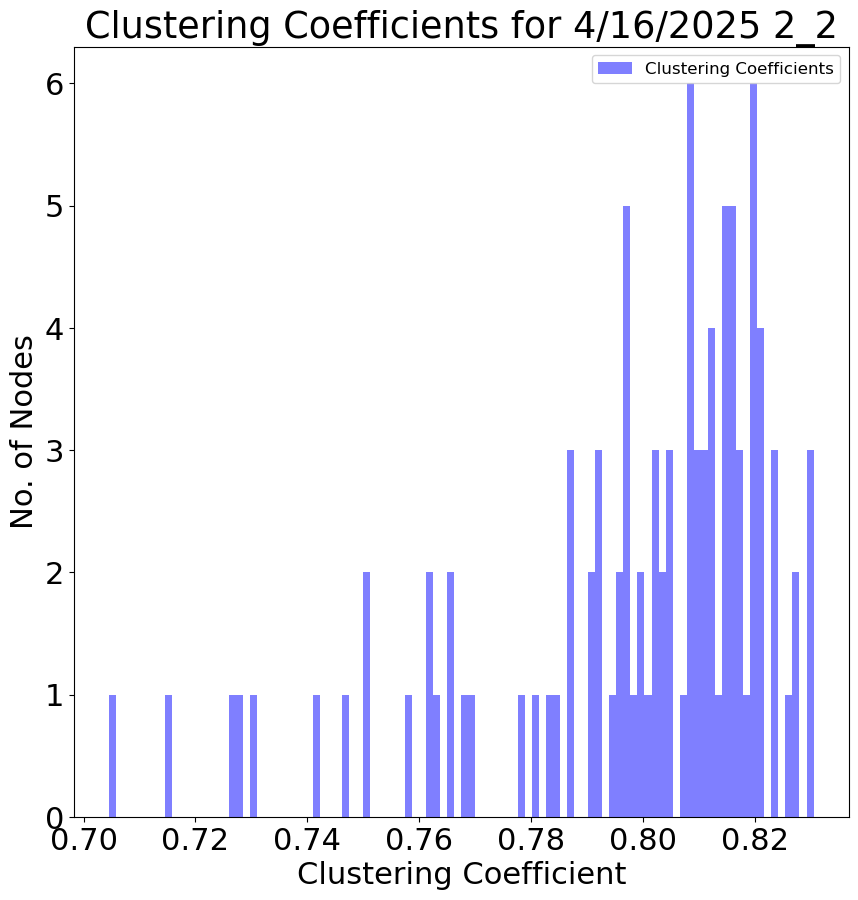

Modularity: 0.004172142141318461
Betweenness Centrality: {0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.0, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.0, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.0, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0.0, 88: 0.0, 89: 0.0, 90: 0.0, 91: 0.0, 92: 0.0, 93: 0.0, 94: 0.0, 95: 0.0, 96: 0.0, 97: 0.0, 98: 0.0, 99: 0.0}


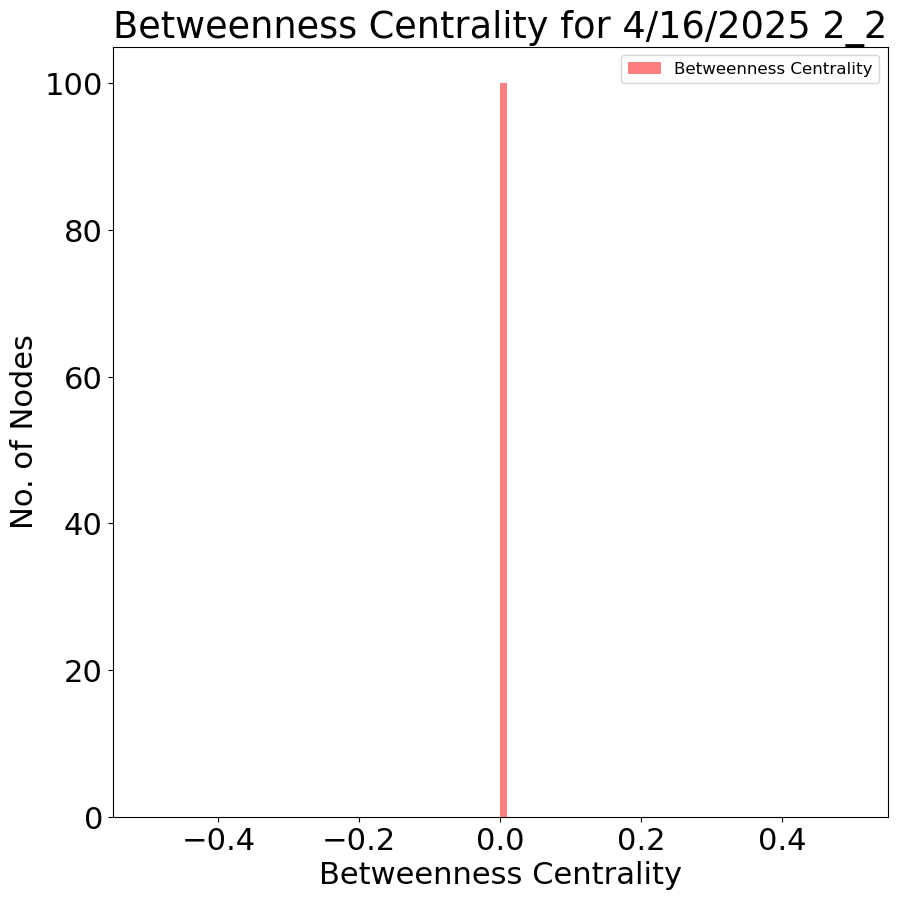

No corr_matrices_by_slice for this date/slice/location
Date:  4/9/2025 Slice:  1 Location:  2
Avg corr shape:  (16, 100, 100)
Clustering: [0.8395835603932793, 0.8569981063896742, 0.8617453376469876, 0.8058185722825157, 0.8313913872894397, 0.8513291041930513, 0.7930096841453432, 0.8575473072892037, 0.8249710626108353, 0.8360509664249675, 0.8411215417833855, 0.8445821847731318, 0.8380676584628649, 0.8476232556793779, 0.8158087009728938, 0.8484969049426849, 0.826742142296293, 0.8226515957867094, 0.8346434749634263, 0.8501249198109241, 0.8342710631417656, 0.8374822871075448, 0.8605400400137945, 0.8254101663672969, 0.8484896485165185, 0.8237076340948087, 0.8259637586972126, 0.8320390937481712, 0.8334932781700883, 0.847248845627593, 0.8192523095735563, 0.8261073435728157, 0.8576345759693974, 0.8178053007397639, 0.8180322018254584, 0.8432522747287029, 0.8570889761197247, 0.8467343472283985, 0.8304793639616909, 0.8390235997727488, 0.816581632712612, 0.8223463692099432, 0.844233643014121, 0.835

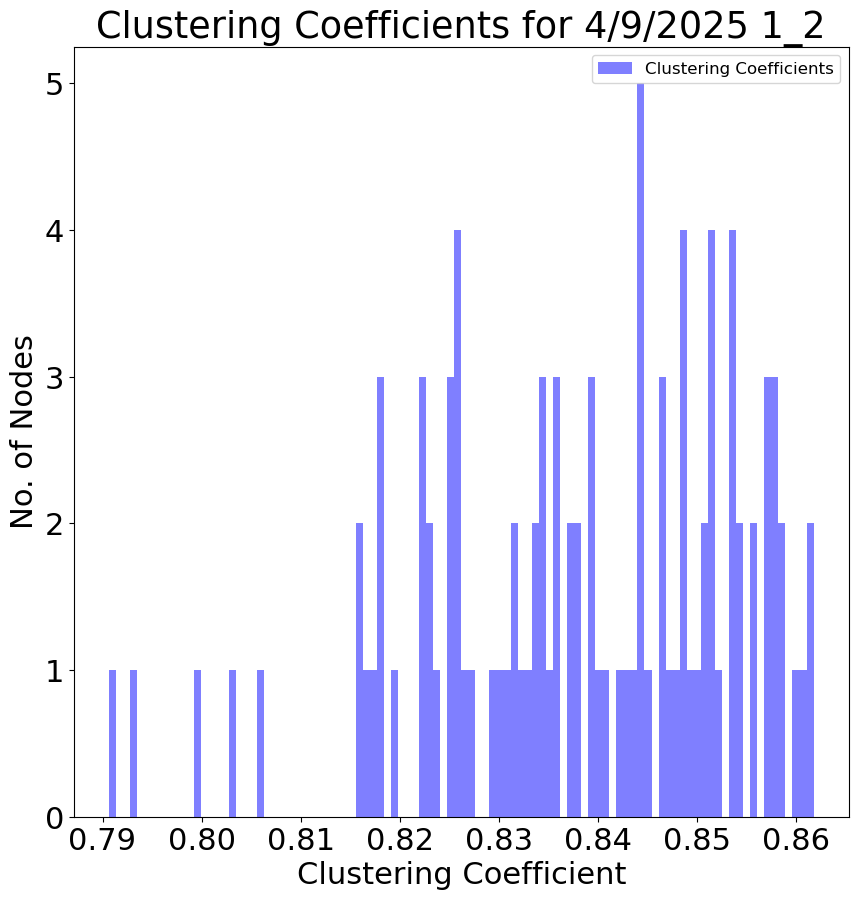

Modularity: 0.004547273921552589
Betweenness Centrality: {0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.0, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.0, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.0, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0.0, 88: 0.0, 89: 0.0, 90: 0.0, 91: 0.0, 92: 0.0, 93: 0.0, 94: 0.0, 95: 0.0, 96: 0.0, 97: 0.0, 98: 0.0, 99: 0.0}


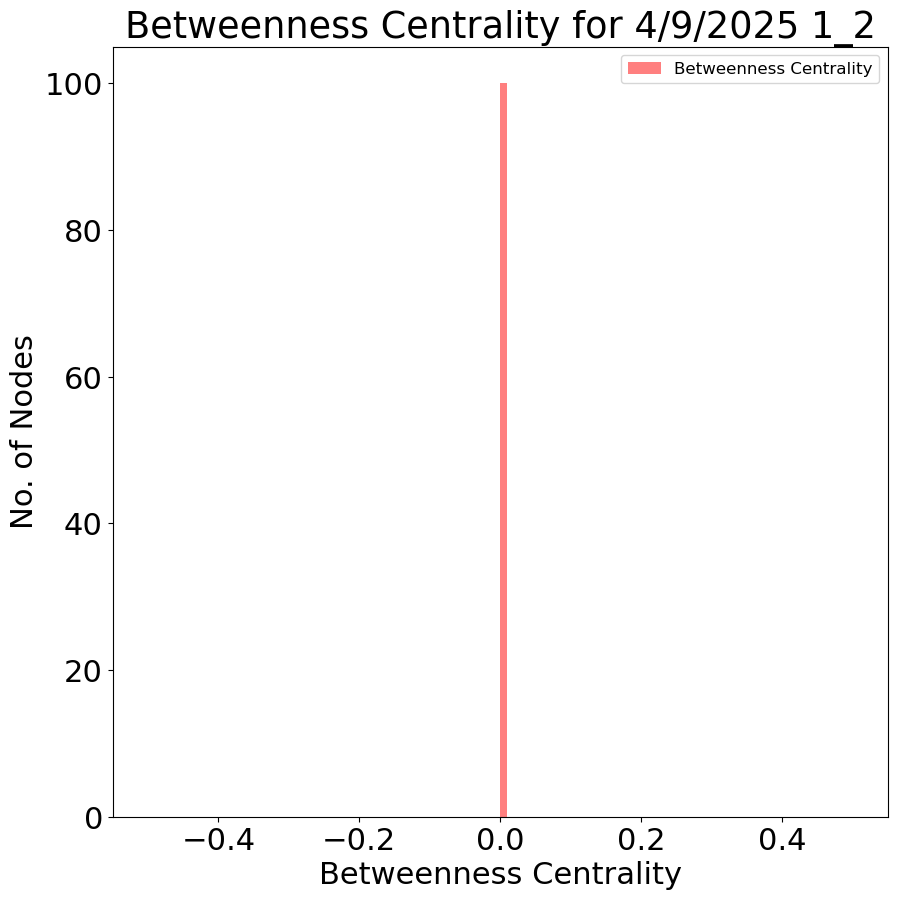

Date:  4/9/2025 Slice:  2 Location:  2
Avg corr shape:  (24, 100, 100)
Clustering: [0.8025413141186656, 0.8262927784885761, 0.8299386791023693, 0.8114830567828113, 0.8305429061898708, 0.7926093867102224, 0.8082070769095712, 0.7919927532660007, 0.8184202224303303, 0.7930418024491481, 0.8315088231630997, 0.7802382256478217, 0.831789725241047, 0.7811055327939319, 0.7711417313879025, 0.7617215500714156, 0.8025187693720277, 0.8328856047183362, 0.7790606285768434, 0.8084318941112558, 0.829105561572064, 0.8313670672215601, 0.8312919017413124, 0.8273393723833333, 0.7921068637862847, 0.7899200445870296, 0.8361925283489453, 0.8155626981577502, 0.833704953720228, 0.8028098174935167, 0.8302438682081501, 0.8312609279805421, 0.8328886760179091, 0.8325619705310967, 0.8010055943810583, 0.8144845255662723, 0.8320219398207768, 0.8297724582162008, 0.8295568810058191, 0.8279099722792513, 0.8306330483489636, 0.8191567853624144, 0.8052834302645355, 0.8197457140987868, 0.8204356682376224, 0.8262773565994459,

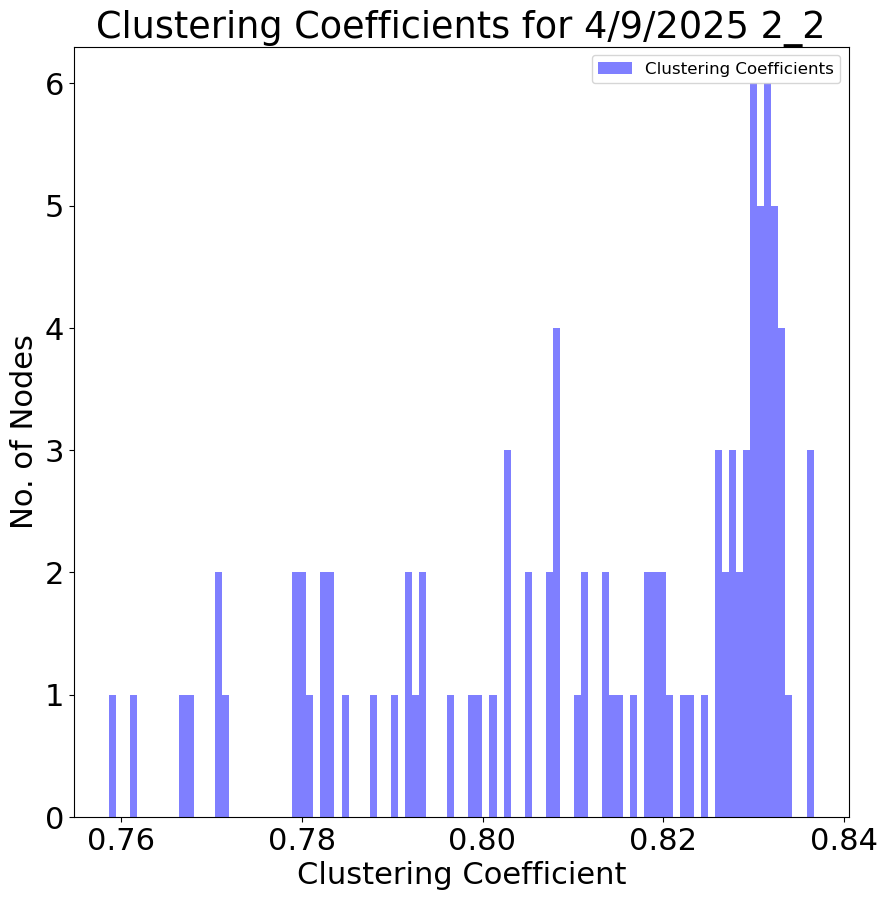

Modularity: 0.008984609495483381
Betweenness Centrality: {0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.0, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.0, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.0, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0.0, 88: 0.0, 89: 0.0, 90: 0.0, 91: 0.0, 92: 0.0, 93: 0.0, 94: 0.0, 95: 0.0, 96: 0.0, 97: 0.0, 98: 0.0, 99: 0.0}


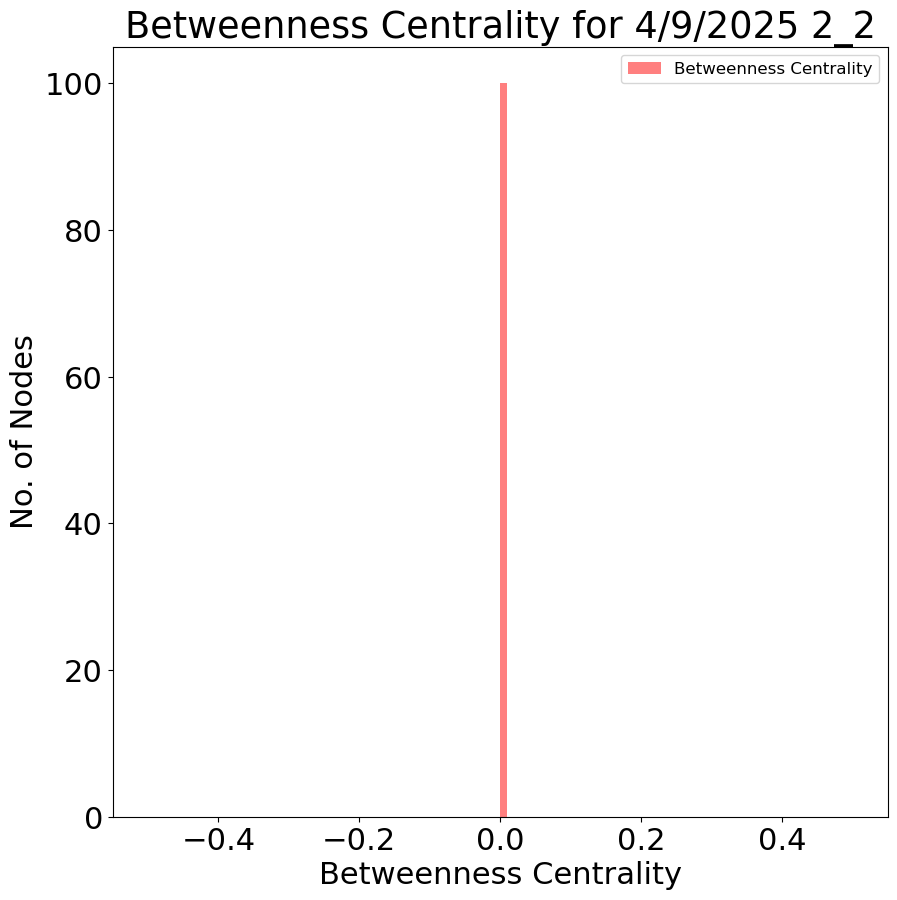

Date:  4/9/2025 Slice:  3 Location:  2
Avg corr shape:  (26, 100, 100)
Clustering: [0.8499983541094287, 0.867572527549703, 0.8575879776428725, 0.867582149005468, 0.8711753751840758, 0.8705229597383304, 0.8739526440326633, 0.856474590419313, 0.8703277467719619, 0.8674362727727888, 0.8698005765779677, 0.8617500739276186, 0.8602188383807514, 0.8679924688451351, 0.8048570843609864, 0.8421110039928144, 0.866296051015336, 0.8532713002609813, 0.8125348897540186, 0.8677899185243629, 0.8627740869945044, 0.8683512255608453, 0.8732728007399666, 0.8676510728065178, 0.815100284061571, 0.8694559291665356, 0.8339394437753561, 0.8355954948164371, 0.8335113285609724, 0.8687238657413628, 0.8638103801402041, 0.8679681723404084, 0.8680798993403083, 0.8688193987330144, 0.8455199903291928, 0.8685418374833203, 0.8194557449176814, 0.8491469918886089, 0.8443906425872093, 0.7900446191034748, 0.8629873496407692, 0.8647101098689126, 0.8669461721885373, 0.866726654960779, 0.869755521516279, 0.8432165057205111, 0.8

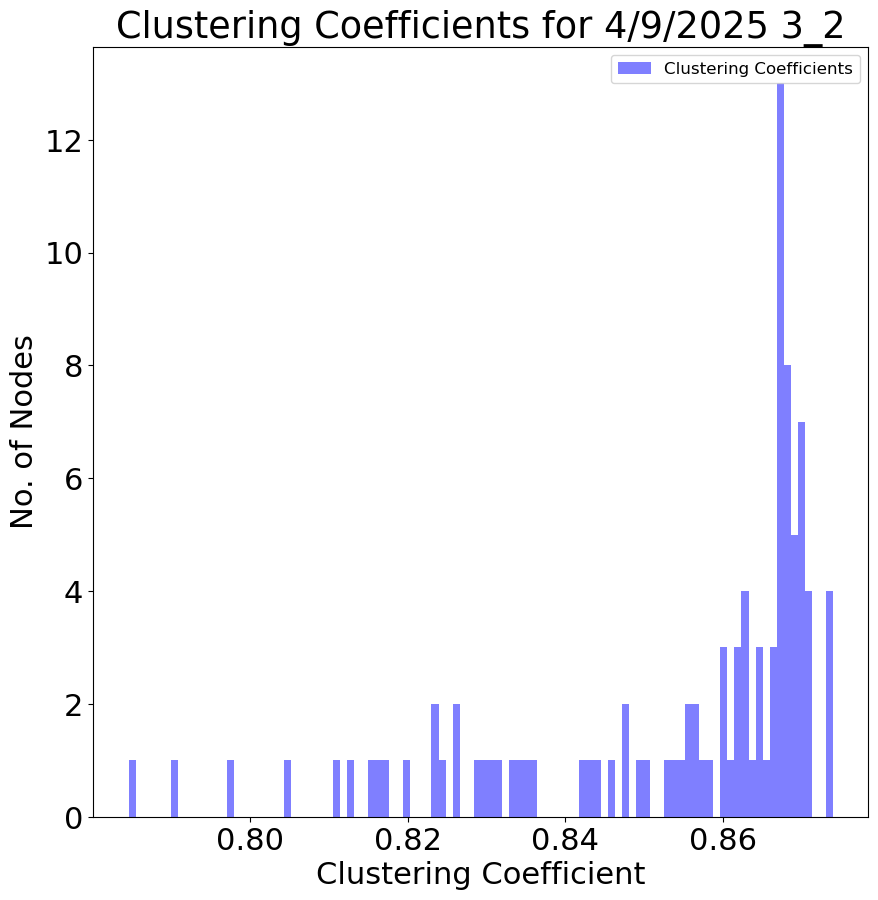

Modularity: 0.004735247607854681
Betweenness Centrality: {0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.0, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.0, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.0, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0.0, 88: 0.0, 89: 0.0, 90: 0.0, 91: 0.0, 92: 0.0, 93: 0.0, 94: 0.0, 95: 0.0, 96: 0.0, 97: 0.0, 98: 0.0, 99: 0.0}


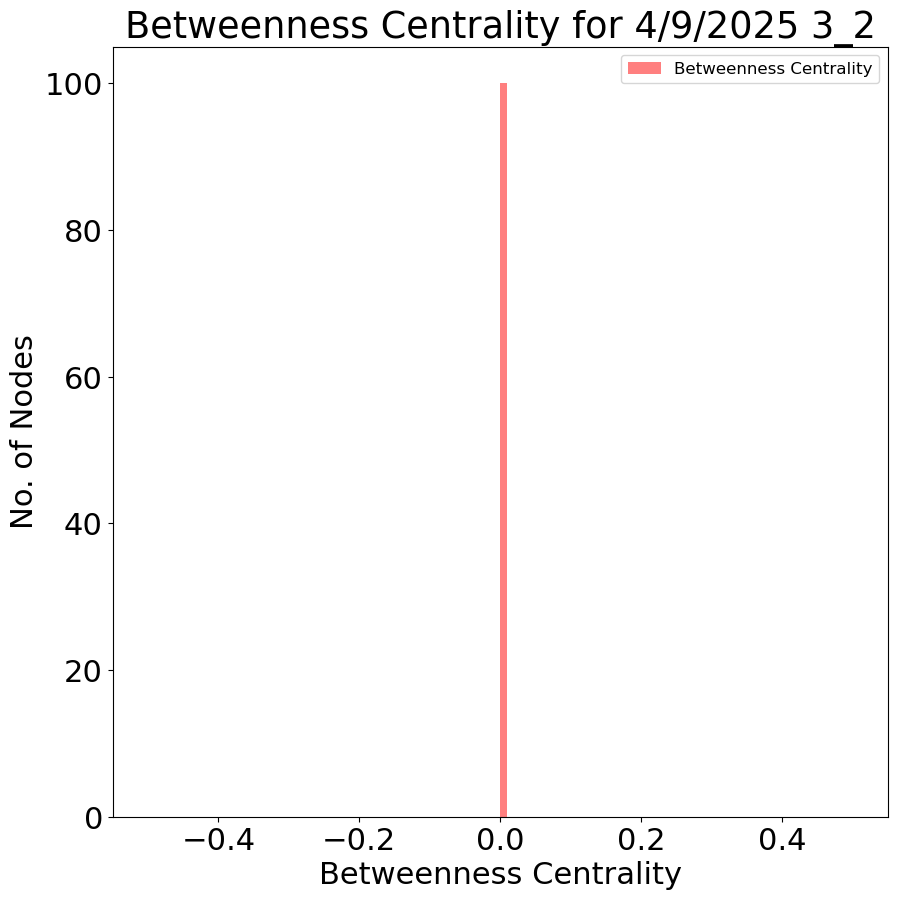

Date:  4/9/2025 Slice:  4 Location:  2
Avg corr shape:  (26, 100, 100)
Clustering: [0.7499163381031934, 0.721635247349834, 0.6482693979666421, 0.7499302693444758, 0.7192542201370724, 0.6610681535620179, 0.7174378803120981, 0.689808856788011, 0.7237998447999149, 0.7030203039011023, 0.7168597171625992, 0.6605593951017954, 0.6609278870481253, 0.7256606483486925, 0.7159096042956243, 0.7411701566390896, 0.7036462787032457, 0.7600130463072727, 0.7344699414845541, 0.7180554356538087, 0.7444724141783399, 0.7463603649980267, 0.6549905828030993, 0.7626446520099085, 0.7091668851616555, 0.7481726176825035, 0.6560799600339072, 0.6960227416031187, 0.751556406159217, 0.7065107669607575, 0.698057507460459, 0.7475481492282589, 0.754037776461475, 0.6930385637948193, 0.7252911334227881, 0.743100365756636, 0.7427296799271885, 0.7550548362614995, 0.650689279716439, 0.7294104982293339, 0.7577598437706858, 0.7170595563739423, 0.7429571276436491, 0.7593174762065585, 0.7289243983798012, 0.7434868422539676, 0.6

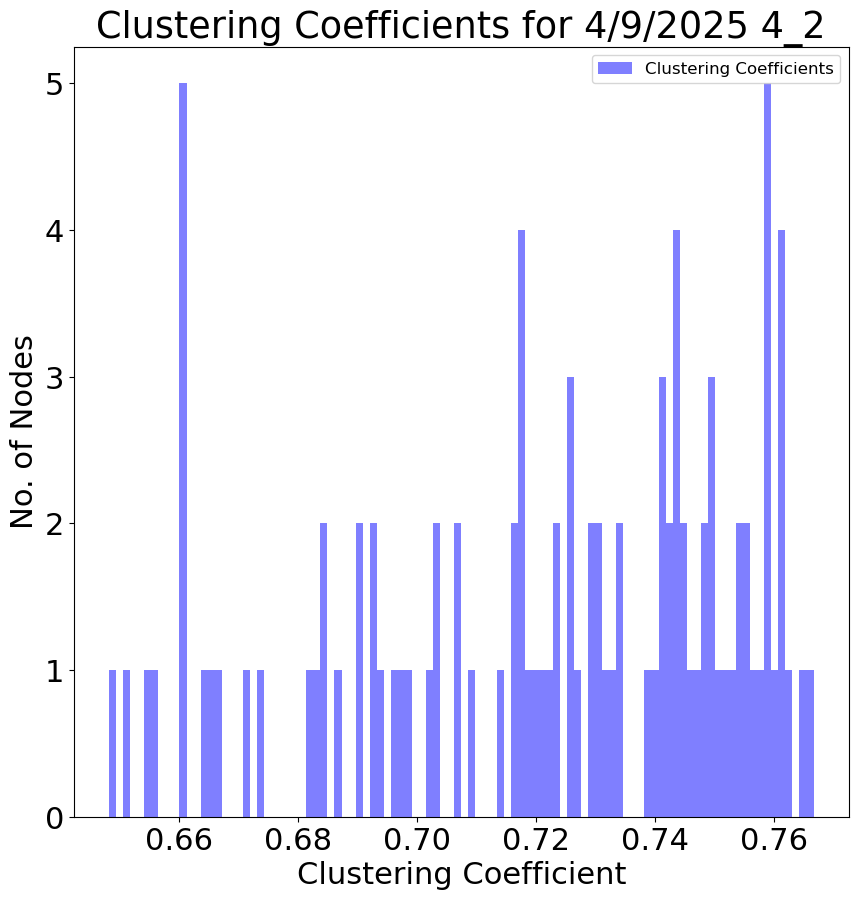

Modularity: 0.01313252415218404
Betweenness Centrality: {0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0, 10: 0.0, 11: 0.0, 12: 0.0, 13: 0.0, 14: 0.0, 15: 0.0, 16: 0.0, 17: 0.0, 18: 0.0, 19: 0.0, 20: 0.0, 21: 0.0, 22: 0.0, 23: 0.0, 24: 0.0, 25: 0.0, 26: 0.0, 27: 0.0, 28: 0.0, 29: 0.0, 30: 0.0, 31: 0.0, 32: 0.0, 33: 0.0, 34: 0.0, 35: 0.0, 36: 0.0, 37: 0.0, 38: 0.0, 39: 0.0, 40: 0.0, 41: 0.0, 42: 0.0, 43: 0.0, 44: 0.0, 45: 0.0, 46: 0.0, 47: 0.0, 48: 0.0, 49: 0.0, 50: 0.0, 51: 0.0, 52: 0.0, 53: 0.0, 54: 0.0, 55: 0.0, 56: 0.0, 57: 0.0, 58: 0.0, 59: 0.0, 60: 0.0, 61: 0.0, 62: 0.0, 63: 0.0, 64: 0.0, 65: 0.0, 66: 0.0, 67: 0.0, 68: 0.0, 69: 0.0, 70: 0.0, 71: 0.0, 72: 0.0, 73: 0.0, 74: 0.0, 75: 0.0, 76: 0.0, 77: 0.0, 78: 0.0, 79: 0.0, 80: 0.0, 81: 0.0, 82: 0.0, 83: 0.0, 84: 0.0, 85: 0.0, 86: 0.0, 87: 0.0, 88: 0.0, 89: 0.0, 90: 0.0, 91: 0.0, 92: 0.0, 93: 0.0, 94: 0.0, 95: 0.0, 96: 0.0, 97: 0.0, 98: 0.0, 99: 0.0}


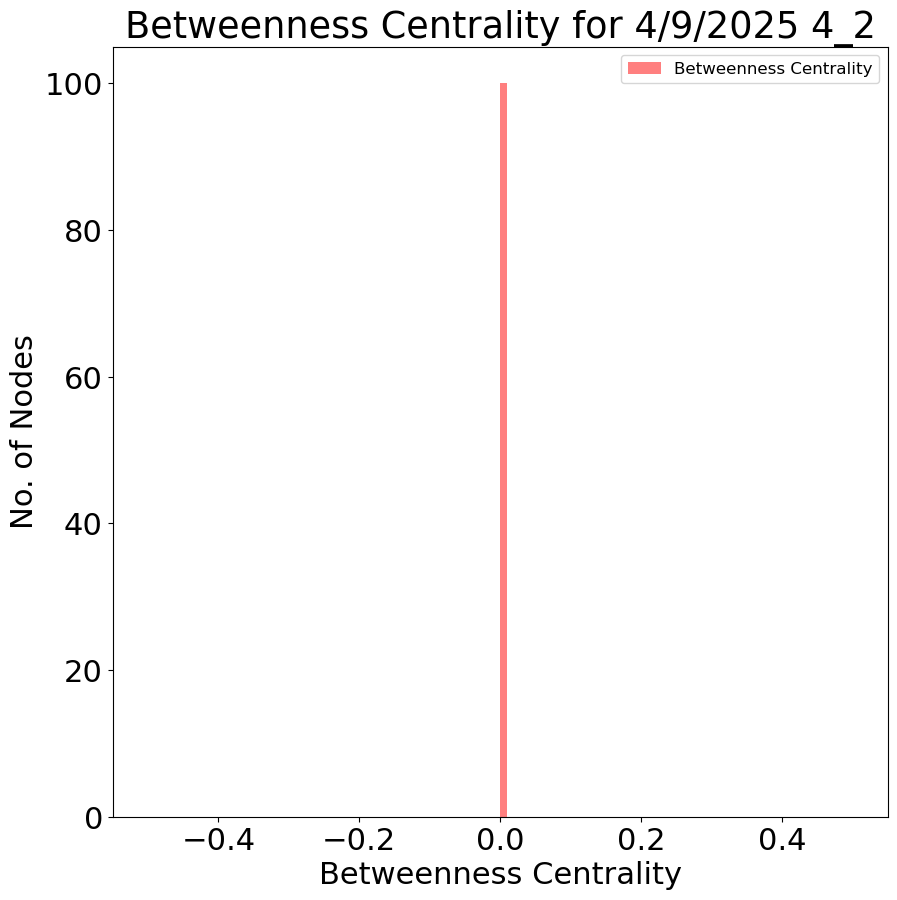

In [ ]:
# measure of betweeness centrality for each node
# betweeness centrality is the number of shortest paths that pass through a node


for date in ppr_df['Date'].unique():
    date_df = ppr_df[ppr_df['Date'] == date]
    if date not in corr_matrices_by_slice:
        print("No corr_matrices_by_slice for this date")
        continue
    for slic in date_df['Slice'].unique():
        slic_df = date_df[date_df['Slice'] == slic]
        for loc in slic_df['Location'].unique():
            loc_df = slic_df[slic_df['Location'] == loc]
            slic_loc_id = f"{slic}_{loc}"
            if slic_loc_id not in corr_matrices_by_slice[date]:
                print("No corr_matrices_by_slice for this date/slice/location")
                continue

            print("Date: ", date, "Slice: ", slic, "Location: ", loc)

            ppr_barrel_subset = ppr_barrel_df[(ppr_barrel_df['Date'] == date) &
                    (ppr_barrel_df['Slice'] == slic) &
                    (ppr_barrel_df['Location'] == loc)]
            if len(ppr_barrel_subset) == 0:
                print("No ppr_barrel_df for this date/slice/location")
                continue
            
            # now get the correlation matrix for this date/slice/location
            avg_corr = []
            # corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][lag][i]
            for ipi in corr_matrices_by_slice[date][slic_loc_id].keys():
                for control_or_ppr_type in corr_matrices_by_slice[date][slic_loc_id][ipi].keys():
                    try:
                        avg_corr.append(corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][optimal_lag])
                    except IndexError:
                        print("IndexError: ", ipi, control_or_ppr_type, optimal_lag, i_slice)
                        print('len(corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][optimal_lag]): ',
                            len(corr_matrices_by_slice[date][slic_loc_id][ipi][control_or_ppr_type][optimal_lag])) # 
                        continue
            avg_corr = np.array([ac[1] for ac in avg_corr])
            avg_corr = np.array(avg_corr).reshape(-1, 100, 100)
            print("Avg corr shape: ", avg_corr.shape)
            avg_corr = np.mean(avg_corr, axis=0)

            if avg_corr.shape[0] < 10:
                print("Avg corr shape is too small: ", avg_corr.shape)
                continue

            G = nx.Graph()
            # avg_corr is a adjacency matrix, convert to edges in G
            for i in range(avg_corr.shape[0]):
                for j in range(i + 1, avg_corr.shape[1]):
                    if avg_corr[i, j] > 0:
                        G.add_edge(i, j, weight=avg_corr[i, j])

            # histogram of clustering
            clustering_coeffs = list(nx.clustering(G, weight='weight').values())
            print("Clustering:", clustering_coeffs)
            fig, ax = plt.subplots(figsize=(10, 10))
            ax.hist(clustering_coeffs, bins=100, color='blue', alpha=0.5, label='Clustering Coefficients')
            ax.set_xlabel('Clustering Coefficient')
            ax.set_ylabel('No. of Nodes')
            ax.set_title(f"Clustering Coefficients for {date} {slic_loc_id}")
            plt.legend(loc='upper right', fontsize=12)
            date_formatted = date.replace('/', '-')
            plt.savefig(f"{output_fig_dir}/{date_formatted}_{slic_loc_id}_"
                        f"clustering_distribution_barrel_cutoff_intrabarrel.png")
            plt.show()


            # calculate modularity
            # partition the graph into communities
            partition = nx.community.louvain_communities(G, weight='weight')
            modularity = nx.community.modularity(G, partition)
            print(f"Modularity: {modularity}")

            # betweenness centrality
            betweenness_centrality = nx.betweenness_centrality(G, weight='weight')
            print("Betweenness Centrality:", betweenness_centrality)
            # plot the betweenness centrality
            fig, ax = plt.subplots(figsize=(10, 10))
            ax.hist(list(betweenness_centrality.values()), bins=100, color='red', alpha=0.5, label='Betweenness Centrality')
            ax.set_xlabel('Betweenness Centrality')
            ax.set_ylabel('No. of Nodes')
            ax.set_title(f"Betweenness Centrality for {date} {slic_loc_id}")
            plt.legend(loc='upper right', fontsize=12)
            date_formatted = date.replace('/', '-')
            plt.savefig(f"{output_fig_dir}/{date_formatted}_{slic_loc_id}_"
                        f"betweenness_centrality_barrel_cutoff_intrabarrel.png")
            plt.show()

            
            

## 